# <center> <b>Advanced Machine Learning (6G7V0017)</b></center>

## <center><b>AutoTrader's Car Price Predictor v.1.00</b></center>

In order to address the main task of producing and analysing a regression model for price prediction,
you need to implement and run the following tasks that are typical of a Machine Learning pipeline,
using our usual environment (i.e., Python ecosystem/notebooks):
1. <b>Data Processing for Machine Learning</b> (e.g., detect and deal with noise (i.e., erroneous
values), missing values, and outliers; categorically-encode, rescale data; split data into predictors
and target; obtain train/validation/test folds).

2. <b>Feature Engineering</b> (e.g., derive features based on domain knowledge; produce polynmial/basis functions and interaction features).

3. <b>Feature Selection and Dimensionality Reduction</b> (e.g., perform manual selection guided
by domain knowledge and exploratory data analysis, run and report on automated selection
algorithms for most useful predictors).

4. <b>Model Building</b> (e.g., choose suitable algorithm(s), fit and tune models; grid-search, rank,
and select model(s) on based on evaluation metrics and under/overfit trade-off; build an
ensemble with best performing models/configurations).

5. <b>Model Evaluation and Analysis</b> (e.g., evaluate selected model(s) according to popular
score and loss metrics with cross-validation, analyse true vs predicted plot, gain and discuss
insights based on feature importance and model output space).


## <b>1. Data / Domain Understanding & Exploration</b>

In [271]:
# Importing warnings to ignore warnings
import warnings
warnings.filterwarnings("ignore")

# Basic Data Libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Pipeline and Feature Union
from sklearn.pipeline import Pipeline, make_pipeline

# Target Encoding
import category_encoders as ce

# Train-Test Split
from sklearn.model_selection import train_test_split

# Scaling the data
from sklearn.preprocessing import StandardScaler

# Linear Regression
from sklearn.linear_model import LinearRegression

# Cross Validation
from sklearn.model_selection import cross_validate

# Polynomial Features
from sklearn.preprocessing import PolynomialFeatures

# GridSearchCV
from sklearn.model_selection import GridSearchCV

# Recursive Feature Elimination Cross Validation with Linear Regression
from sklearn.feature_selection import RFECV

# Sequential Feature Selector
from sklearn.feature_selection import SequentialFeatureSelector

# Import SelectKBest
from sklearn.feature_selection import SelectKBest, f_regression

# Import PCA
from sklearn.decomposition import PCA

# Import r2_score
from sklearn.metrics import r2_score

# An Averager/Voter/Stacker Ensemble
from sklearn.ensemble import VotingRegressor

# Importing matplotlib
import matplotlib as mpl

# SHAP Values
import shap

# Initialize JavaScript visualization code
shap.initjs()

# Importing the necessary libraries for SHAP
from shap import KernelExplainer, Explanation

# Random Forest Regressor
from sklearn.ensemble import RandomForestRegressor

# Gradient Boosting Regressor
from sklearn.ensemble import GradientBoostingRegressor

# Create a pipeline with Stacking Regressor
from sklearn.ensemble import StackingRegressor

# Linear Regression Cross Validation
from sklearn.model_selection import cross_val_score

# Import library for partial dependency plots
from sklearn.inspection import PartialDependenceDisplay

### <b>a. Load the Dataset</b>

In [141]:
# Importing the dataset
df = pd.read_csv('../Dataset/adverts.csv')

### <b>b. Sampling the Observations</b>

In [142]:
# Extracting the 5 top rows in the dataset
df.head(5)

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,NaN,73970,SUV,False,Petrol Plug-in Hybrid
1,202007020778260,108230.0,61,Blue,Jaguar,XF,USED,2011.0,7000,Saloon,False,Diesel
2,202007020778474,7800.0,17,Grey,SKODA,Yeti,USED,2017.0,14000,SUV,False,Petrol
3,202007080986776,45000.0,16,Brown,Vauxhall,Mokka,USED,2016.0,7995,Hatchback,False,Diesel
4,202007161321269,64000.0,64,Grey,Land Rover,Range Rover Sport,USED,2015.0,26995,SUV,False,Diesel


In [143]:
# Extracting a random sample of the dataset
df.sample(5)

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
393109,202009224062026,1.0,NaN,White,MG,MG5,NEW,NaN,23095,Estate,False,Electric
252464,202010305628664,75595.0,04,Silver,SEAT,Ibiza,USED,2004.0,999,Hatchback,False,Diesel
21035,202010315651927,25000.0,67,Silver,Nissan,X-Trail,USED,2017.0,16495,SUV,False,Diesel
47206,202010245380753,58320.0,15,Black,Vauxhall,Corsa,USED,2015.0,5395,Hatchback,False,Petrol
313630,202007010734263,31967.0,67,Black,Volvo,S60,USED,2018.0,12295,Saloon,False,Petrol


In [144]:
# Extracting the last 5 rows of the dataset
df.tail(5)

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
402000,202010315652942,5179.0,69,Grey,Peugeot,208,USED,2019.0,10595,Hatchback,False,Petrol
402001,202010315657341,110000.0,59,Red,Peugeot,107,USED,2009.0,2000,Hatchback,False,Petrol
402002,202010315659271,52760.0,62,White,Nissan,Qashqai,USED,2012.0,7250,SUV,False,Petrol
402003,202011015662436,10250.0,65,Red,Abarth,595,USED,2015.0,11490,Hatchback,False,Petrol
402004,201512149444029,14000.0,14,Silver,Audi,A4 Avant,USED,2014.0,20520,Estate,False,Diesel


In [145]:
# Checking for size and shape of the dataset
print("Size of the Dataset is: ", df.size)
print("Shape of the Dataset is: ", df.shape)

Size of the Dataset is:  4824060
Shape of the Dataset is:  (402005, 12)


<b> Observation(s):</b>

* No issue while importing the dataset and sampling the data.
* There are 402,005 rows in the dataset along with 12 columns / features.

### <b>c. Checking Correct Parsing of Data</b>

In [146]:
# Types of data in the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 402005 entries, 0 to 402004
Data columns (total 12 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   public_reference       402005 non-null  int64  
 1   mileage                401878 non-null  float64
 2   reg_code               370148 non-null  object 
 3   standard_colour        396627 non-null  object 
 4   standard_make          402005 non-null  object 
 5   standard_model         402005 non-null  object 
 6   vehicle_condition      402005 non-null  object 
 7   year_of_registration   368694 non-null  float64
 8   price                  402005 non-null  int64  
 9   body_type              401168 non-null  object 
 10  crossover_car_and_van  402005 non-null  bool   
 11  fuel_type              401404 non-null  object 
dtypes: bool(1), float64(2), int64(2), object(7)
memory usage: 34.1+ MB


<table>
    <thead>
        <tr>
            <th>Data Attribute</th>
            <th>Value</th>
        </tr>
    </thead>
    <tbody>
        <tr>
            <td>Public Reference</td>
            <td>Date on which the advertisment was published</td>
        </tr>
        <tr>
            <td>Mileage</td>
            <td>Total mileage of the cars</td>
        </tr>
        <tr>
            <td>Reg Code</td>
            <td>Regisration code of the car</td>
        </tr>
        <tr>
            <td>Standard Colour</td>
            <td>Colour of the car</td>
        </tr>
        <tr>
            <td>Standard Make</td>
            <td>Make / Manufacturer of the car</td>
        </tr>
        <tr>
            <td>Standard Model</td>
            <td>Model of the car</td>
        </tr>
        <tr>
            <td>Vehicle Condition</td>
            <td>Condition of the car</td>
        </tr>
        <tr>
            <td>Year of Registration</td>
            <td>Year on which the vehicle was registered</td>
        </tr>
        <tr>
            <td>Price</td>
            <td>Quoted price of the car</td>
        </tr>
        <tr>
            <td>Body Type</td>
            <td>Body type of the car</td>
        </tr>
        <tr>
            <td>Crossover Car and Van</td>
            <td>whether it is a crossover b/w car and van or not</td>
        </tr>
        <tr>
            <td>Fuel Type</td>
            <td>Fuel type of the vehicle</td>
        </tr>
    </tbody>
</table>

<b> Observation(s): </b>

* Although almost all of the column's datatypes seems to be correct, but the `year_of_registration` column's data type should be changed because it cannot be in float.
* `reg_code` should be inspected whether it needs a datatype change or not. It will be checked whether it has string or just numerical values.

In [147]:
# Descriptive Statistics for columns in the dataset
df.describe(include='all')

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
count,4.020050e+05,401878.000000,370148,396627,402005,402005,402005,368694.000000,4.020050e+05,401168,402005,401404
unique,NaN,NaN,72,22,110,1168,2,NaN,NaN,16,2,9
top,NaN,NaN,17,Black,BMW,Golf,USED,NaN,NaN,Hatchback,False,Petrol
freq,NaN,NaN,36738,86287,37376,11583,370756,NaN,NaN,167315,400210,216929
mean,2.020071e+14,37743.595656,NaN,NaN,NaN,NaN,NaN,2015.006206,1.734197e+04,NaN,NaN,NaN
std,1.691662e+10,34831.724018,NaN,NaN,NaN,NaN,NaN,7.962667,4.643746e+04,NaN,NaN,NaN
min,2.013072e+14,0.000000,NaN,NaN,NaN,NaN,NaN,999.000000,1.200000e+02,NaN,NaN,NaN
25%,2.020090e+14,10481.000000,NaN,NaN,NaN,NaN,NaN,2013.000000,7.495000e+03,NaN,NaN,NaN
50%,2.020093e+14,28629.500000,NaN,NaN,NaN,NaN,NaN,2016.000000,1.260000e+04,NaN,NaN,NaN
75%,2.020102e+14,56875.750000,NaN,NaN,NaN,NaN,NaN,2018.000000,2.000000e+04,NaN,NaN,NaN


<b>Observation(s):</b>

* At the initial phase, it can be easily observed that there might be error values in the `mileage` max column (999999.000000), `year_of_registration` min column (999.000000), and `price` max column (9.999999e+06). 

### <b>d. Categorical Columns' Unique Value Assessment</b>

In [148]:
# Consistency checks for the standard_colour column by looking out for all the unique values 
standard_colour = df['standard_colour'].unique().tolist()
sort_standard_colour = np.sort(standard_colour)
print(sort_standard_colour)

['Beige' 'Black' 'Blue' 'Bronze' 'Brown' 'Burgundy' 'Gold' 'Green' 'Grey'
 'Indigo' 'Magenta' 'Maroon' 'Multicolour' 'Navy' 'Orange' 'Pink' 'Purple'
 'Red' 'Silver' 'Turquoise' 'White' 'Yellow' 'nan']


In [149]:
# Consistency checks for the standard_make column by looking out for all the unique values 
standard_make = df['standard_make'].unique().tolist()
sort_standard_make = np.sort(standard_make)
print(sort_standard_make)

['AC' 'AK' 'Abarth' 'Aixam' 'Alfa Romeo' 'Alpine' 'Ariel' 'Aston Martin'
 'Audi' 'Austin' 'BAC' 'BMW' 'Beauford' 'Bentley' 'Bristol' 'Bugatti'
 'Buick' 'CUPRA' 'Cadillac' 'Carbodies' 'Caterham' 'Chevrolet' 'Chrysler'
 'Citroen' 'Corvette' 'Custom Vehicle' 'DS AUTOMOBILES' 'Dacia' 'Daewoo'
 'Daihatsu' 'Daimler' 'Datsun' 'Dax' 'Dodge' 'Ferrari' 'Fiat' 'GMC'
 'Gentry' 'Great Wall' 'Holden' 'Honda' 'Hummer' 'Hyundai' 'Infiniti'
 'International' 'Isuzu' 'Iveco' 'Jaguar' 'Jeep' 'Jensen' 'Kia' 'LEVC'
 'Lamborghini' 'Lancia' 'Land Rover' 'Lexus' 'Leyland' 'Lincoln'
 'London Taxis International' 'Lotus' 'MG' 'MINI' 'Maserati' 'Maybach'
 'Mazda' 'McLaren' 'Mercedes-Benz' 'Mev' 'Mitsubishi' 'Mitsuoka' 'Morgan'
 'Morris' 'Nissan' 'Noble' 'Opel' 'Pagani' 'Panther' 'Perodua' 'Peugeot'
 'Pilgrim' 'Plymouth' 'Pontiac' 'Porsche' 'Proton' 'Radical' 'Reliant'
 'Renault' 'Replica' 'Rolls-Royce' 'Rover' 'SEAT' 'SKODA' 'Saab' 'Sebring'
 'Smart' 'SsangYong' 'Subaru' 'Suzuki' 'TVR' 'Tesla' 'Tiger' 'Toyota'
 '

In [150]:
# Consistency checks for the standard_model column by looking out for all the unique values 
standard_model = df['standard_model'].unique().tolist()
sort_standard_model = np.sort(standard_model)
print(sort_standard_model)

for model in sort_standard_model:
    print(model)

['1 Series' '10' '100' ... 'ix35' 'quattro' 'up!']
1 Series
10
100
1000
1007
106
107
108
11
110
122
124 Spider
126
127
12C
146
147
1500
156
159
159 Sportwagon
1600
164
19
190
190 SL
2 CV
2 Series
2 Series Active Tourer
2 Series Gran Coupe
2 Series Gran Tourer
200
2000
2008
205
206
206 CC
206 SW
207
207 CC
207 SW
208
220
222
230
230 SL
240
240Z
246
25
25/30
250
2500
260
275
280
3 Series
3 Series Gran Turismo
3 Wheeler
300
3000GT
3008
300C
306
307
307 CC
307 SW
308
308 CC
308 SW
310
320
3200
323
328
340R
348
350
350 Z
3500
350i
355 F1
356
360
365
370 Z
380
4 Series
4 Series Gran Coupe
4/4
400
4007
406
407
407 SW
420
4200
430
45
450
456
456M
458
480
488
488 Pista
4C
5
5 Series
5 Series Gran Turismo
500
5008
500C
500L
500X
508
508 SW
512
540C
550
560
560SL
57
570GT
570S
575M
595
595C
599
6 Series
6 Series Gran Coupe
6 Series Gran Turismo
6/110
600
600LT
607
612
62
626
650S
675LT
695
695C
7 Series
700
718 Boxster
718 Cayman
718 Spyder
720S
740
75
75 Tourer
8 Series
8 Series Gran Coupe
80
80

In [151]:
# Consistency checks for the vehicle_condition column by looking out for all the unique values 
vehicle_condition = df['vehicle_condition'].unique().tolist()
sort_vehicle_condition = np.sort(vehicle_condition)
print(sort_vehicle_condition)

['NEW' 'USED']


In [152]:
# Consistency checks for the body_type column by looking out for all the unique values 
body_type = df['body_type'].unique().tolist()
sort_body_type = np.sort(body_type)
print(sort_body_type)

['Camper' 'Car Derived Van' 'Chassis Cab' 'Combi Van' 'Convertible'
 'Coupe' 'Estate' 'Hatchback' 'Limousine' 'MPV' 'Minibus' 'Panel Van'
 'Pickup' 'SUV' 'Saloon' 'Window Van' 'nan']


In [153]:
# Consistency checks for the crossover_car_and_van column by looking out for all the unique values 
crossover_car_and_van = df['crossover_car_and_van'].unique().tolist()
sort_crossover_car_and_van = np.sort(crossover_car_and_van)
print(sort_crossover_car_and_van)

[False  True]


In [154]:
# Consistency checks for the fuel_type column by looking out for all the unique values 
fuel_type = df['fuel_type'].unique().tolist()
sort_fuel_type = np.sort(fuel_type)
print(sort_fuel_type)

['Bi Fuel' 'Diesel' 'Diesel Hybrid' 'Diesel Plug-in Hybrid' 'Electric'
 'Natural Gas' 'Petrol' 'Petrol Hybrid' 'Petrol Plug-in Hybrid' 'nan']


<b>Observation(s):</b>

* The consistency in the categorical columns seems to be fine in all the columns and haven't saw any inconsistencies. However, a plethora of NaN values exists which either should be removed or dealth with according to the importance of the columns.

### <b>e. Quantitative Columns' Values Consistency Check</b>

In [155]:
# Checking for negative or extreme values in all numerical columns in the dataset
df.describe()

,public_reference,mileage,year_of_registration,price
count,4.020050e+05,401878.000000,368694.000000,4.020050e+05
mean,2.020071e+14,37743.595656,2015.006206,1.734197e+04
std,1.691662e+10,34831.724018,7.962667,4.643746e+04
min,2.013072e+14,0.000000,999.000000,1.200000e+02
25%,2.020090e+14,10481.000000,2013.000000,7.495000e+03
50%,2.020093e+14,28629.500000,2016.000000,1.260000e+04
75%,2.020102e+14,56875.750000,2018.000000,2.000000e+04
max,2.020110e+14,999999.000000,2020.000000,9.999999e+06


<b>Observation(s):</b>

* There are no negative values observations in any of the columns.

### <b>f. Identify Quantitative and Qualitative Features</b>

In [156]:
# Quantitative Features in the Dataset are:
quantitative_features = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
print("Quantitative Features are: ", quantitative_features)

#Qualitative Features in the Dataset are:
qualitative_features = df.select_dtypes(include=['object']).columns.tolist()
print("Qualitative Features are: ", qualitative_features)


Quantitative Features are:  ['public_reference', 'mileage', 'year_of_registration', 'price']
Qualitative Features are:  ['reg_code', 'standard_colour', 'standard_make', 'standard_model', 'vehicle_condition', 'body_type', 'fuel_type']


### <b>g. Analyse Data Distributions (e.g., range, centrality, dispersion, shape)</b>

In [157]:
# For range of values in the dataset, we will use the describe function
df.describe()

,public_reference,mileage,year_of_registration,price
count,4.020050e+05,401878.000000,368694.000000,4.020050e+05
mean,2.020071e+14,37743.595656,2015.006206,1.734197e+04
std,1.691662e+10,34831.724018,7.962667,4.643746e+04
min,2.013072e+14,0.000000,999.000000,1.200000e+02
25%,2.020090e+14,10481.000000,2013.000000,7.495000e+03
50%,2.020093e+14,28629.500000,2016.000000,1.260000e+04
75%,2.020102e+14,56875.750000,2018.000000,2.000000e+04
max,2.020110e+14,999999.000000,2020.000000,9.999999e+06


<b>Observation(s):</b>

* According to `public_reference`, earliest advertisment of car was posted on 2013 and the last was on 2020.
* `mileage` shows a variation of values with minimum value being 0.0 because most probably it denotes new car and 999999 shows error value.
* In the `year_of_registration` column, the minimum value is 999.0 incorrect & it also denotes that most probably there are error values just above the minimum range.
* Regarding `price`, it doesn't reveal much except there should be error values near the maximum end of the values.

* Apart from the error / outlier values, the ranges in the column are in accordance with the context / nature of the columns and dataset.

In [158]:
# Although most of the statistical functions are available in the describe function, some more simple functions will be used to find out median and mode of the dataset
print("Median of the Quantitative Features: ", df[quantitative_features].median())

print("\n \nMode of the Qualitative Features: ", df[qualitative_features].mode())

Median of the Quantitative Features:  public_reference        2.020093e+14
mileage                 2.862950e+04
year_of_registration    2.016000e+03
price                   1.260000e+04
dtype: float64

 
Mode of the Qualitative Features:    reg_code standard_colour standard_make standard_model vehicle_condition  \
0       17           Black           BMW           Golf              USED   

   body_type fuel_type  
0  Hatchback    Petrol  


<b>Observation(s):</b>

* <b>Median</b> for the quantitative does not reveal much which should be mentioned except that the middle value of `mileage` is around 28k miles and 2016 is for `year_of_registration`.
* <b>Mode</b> of the qualitative dataset reveals some interesting features of most values in the columns: BMW is for `standard_make`, black is for `standard_colour`, used is for the `vehicle_condition`, hatchback is for `body_type`, and petrol is for `fuel_type`.

In [159]:
# For dispersion measures like include variance, standard deviation, and interquartile range (IQR), we will use the describe function:
print("Standard Deviation of the Quantitative Features: ", df[quantitative_features].std())
print("\n \nVariance of the Quantitative Features: ", df[quantitative_features].var())
print("\n \nInterquartile Range of the Quantitative Features: ", df[quantitative_features].quantile([0.25, 0.5, 0.75]))

Standard Deviation of the Quantitative Features:  public_reference        1.691662e+10
mileage                 3.483172e+04
year_of_registration    7.962667e+00
price                   4.643746e+04
dtype: float64

 
Variance of the Quantitative Features:  public_reference        2.861719e+20
mileage                 1.213249e+09
year_of_registration    6.340407e+01
price                   2.156438e+09
dtype: float64

 
Interquartile Range of the Quantitative Features:        public_reference   mileage  year_of_registration    price
0.25      2.020090e+14  10481.00                2013.0   7495.0
0.50      2.020093e+14  28629.50                2016.0  12600.0
0.75      2.020102e+14  56875.75                2018.0  20000.0


<b>Observation(s):</b>

* According to the data of Standard Deviation / variance, it can be analyzed that the `mileage` & `price` values are dispersed much more than the value of `year_of_registration`. It may be like this because the data pertaining to year of registration is majorly around thr 2000's era.
* As for the IQR, there are some key insights that were observed: The mileage around which most of the vehicle are around 28,000, most of the vehicles were put on for sale around 2016, and prices of most of the vehicles revolves around £12,000.

In [160]:
# For knowing the skewness of the quanitative, we will use the skew:
print("Skewness of the Quantitative Features: ", df[quantitative_features].skew())

Skewness of the Quantitative Features:  public_reference        -11.365289
mileage                   1.451132
year_of_registration    -87.909954
price                   154.681527
dtype: float64


<b>Obseration(s):</b>

Skewness shows the titlt of the majority of the values from the mean of the column: 

* In `public_reference` , a negative skewness indicates that the data is skewed to the left, with the left tail being longer or fatter than the right tail.
* A positive skewness in `mileage` indicates that the data is skewed to the right.
* `year_of_registration` large negative values suggests a significant left skew.
* `Price` large positive skewness with many values being greater than the mean.


### <b>h. Value Distributions of Quantitative Columns</b>

This section is just about getting detailed information along with values about the related columns for detailed analysis.

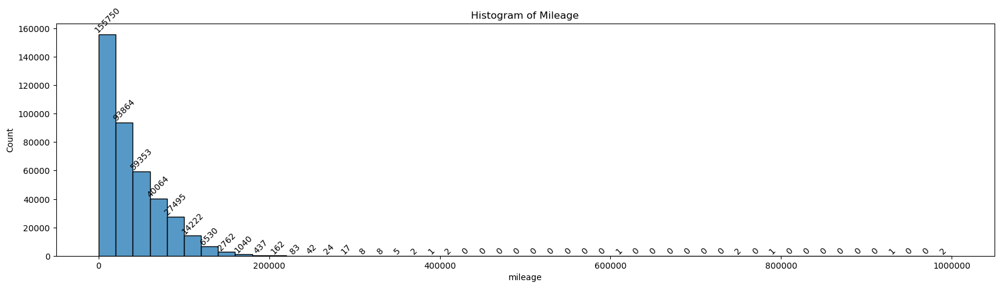

In [161]:
# Detailed Visualization the dispersion measures of mileage column via histogram
plt.figure(figsize=(20, 5))
plt.ticklabel_format(style='plain')
ax = sns.histplot(df['mileage'], bins=50, binrange=(0, 1000000))

# Labelling bars in the histogram
for i in ax.containers:
    ax.bar_label(i, rotation= 45, label_type="edge")
plt.title("Histogram of Mileage")
plt.show()


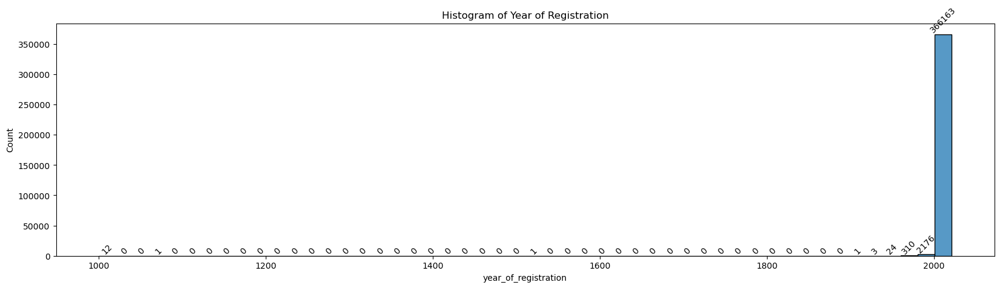

In [162]:
# Detailed Visualization the dispersion measures of year_of_registration column via histogram
plt.figure(figsize=(20, 5))
plt.ticklabel_format(style='plain')
ax = sns.histplot(df['year_of_registration'], bins=50, binrange=(1000, 2021))

#Labelling bars in the histogram
for i in ax.containers:
    ax.bar_label(i, rotation= 45, label_type="edge")
plt.title("Histogram of Year of Registration")
plt.show()

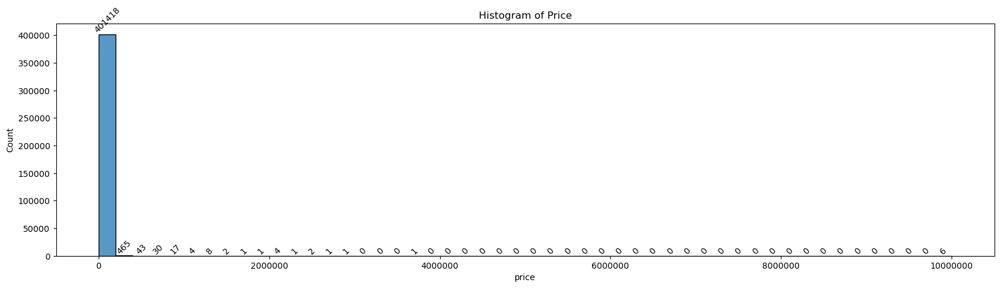

In [163]:
# Detailed Visualization the dispersion measures of price column via histogram
plt.figure(figsize=(20, 5))
plt.ticklabel_format(style='plain')
ax = sns.histplot(df['price'], bins=50, binrange=(0, 10000000))

# Labelling bars in the histogram
for i in ax.containers:
    ax.bar_label(i, rotation= 45, label_type="edge")
plt.title("Histogram of Price")
plt.show()

<b>Observation(s):</b>
* `mileage` column shows that the milage of most of the vehicles are in between 0 to 20,000. It shows that most of them are either new or a little bit old when it comes to condition.
* `year_of_registration` reveals a very insteresting aspect that most of the cars were registered on the website are fairly new i.e. they have been recently registered during the 2000's era.
* `price` column values dispersion reveals that most of the vehicles on display are within most of the people's budget and there are lesser number of vehicles which are more than £200,000.


### <b>i. Outliers Detection of Quantitative Columns</b>

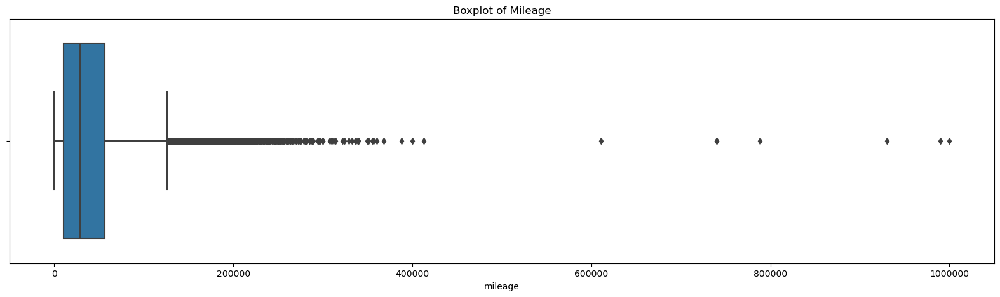

In [164]:
# Outlier detection of the mileage column via a box plot
plt.figure(figsize=(20, 5))
plt.ticklabel_format(style='plain')
sns.boxplot(data=df, x='mileage')
plt.title("Boxplot of Mileage")
plt.show()

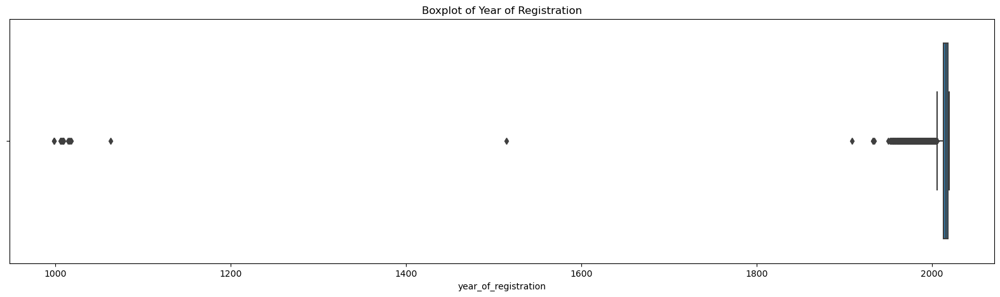

In [165]:
# Outlier detection of the year_of_registration column via a box plot
plt.figure(figsize=(20, 5))
plt.ticklabel_format(style='plain')
sns.boxplot(data=df, x='year_of_registration')
plt.title("Boxplot of Year of Registration")
plt.show()

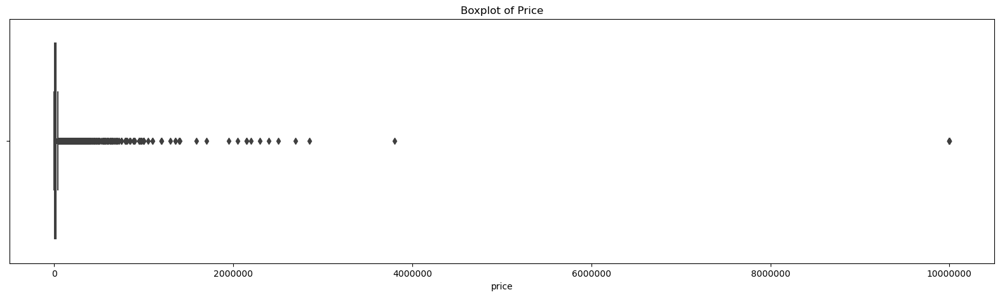

In [166]:
# Outlier detection of the price column via a box plot
plt.figure(figsize=(20, 5))
plt.ticklabel_format(style='plain')
sns.boxplot(data=df, x='price')
plt.title("Boxplot of Price")
plt.show()

<b>Observation(s):</b>

* There are a few outliers after `mileage` value of above 150,000 and it should be investigated whether they are genuine values or are values which have error.
* In the `year_of_registration` column, there are a few values which dates even before 1500. So such values needs to be investigated because it's highly unlikely that there are cars for auction, if they have even survived for that long.
* Regarding `price`, a few values are above £380,000 needs to be checked whether they are error values or they are of sports / luxurious cars as they are extremely expensive.

### <b>j. Value Distributions of Qualitative Columns</b>

This section is just about getting detailed information along with values about the related columns for detailed analysis.

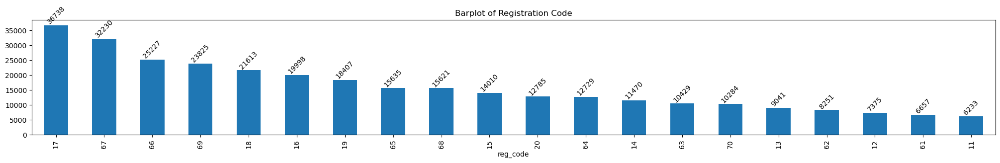

In [167]:
# Detailed Visualization the dispersion measures of reg_code column via bar plot
plt.figure(figsize=(25, 3))
plt.ticklabel_format(style='plain')
ax = df['reg_code'].value_counts().nlargest(20).plot(kind='bar')

# Labelling bars in the barplot
for i in ax.containers:
    ax.bar_label(i, rotation= 45, label_type="edge")
plt.title("Barplot of Registration Code")
plt.show()

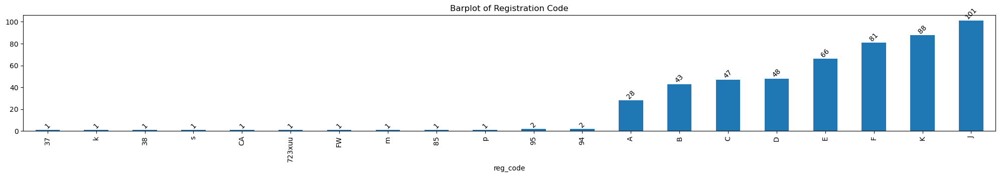

In [168]:
# Detailed Visualization the dispersion measures of reg_code column via bar plot
plt.figure(figsize=(25, 3))
plt.ticklabel_format(style='plain')
ax = df['reg_code'].value_counts().nsmallest(20).plot(kind='bar')

# Labelling bars in the barplot
for i in ax.containers:
    ax.bar_label(i, rotation= 45, label_type="edge")
plt.title("Barplot of Registration Code")
plt.show()

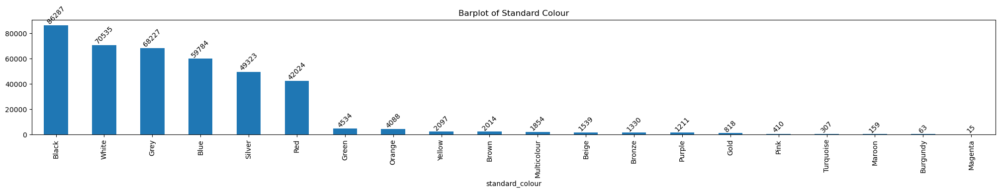

In [169]:
# Detailed Visualization the dispersion measures of standard_colour column via bar plot
plt.figure(figsize=(25, 3))
plt.ticklabel_format(style='plain')
ax = df['standard_colour'].value_counts().nlargest(20).plot(kind='bar')

# Labeling bars in the barplot
for i in ax.containers:
    ax.bar_label(i, rotation= 45, label_type="edge")
plt.title("Barplot of Standard Colour")
plt.show()

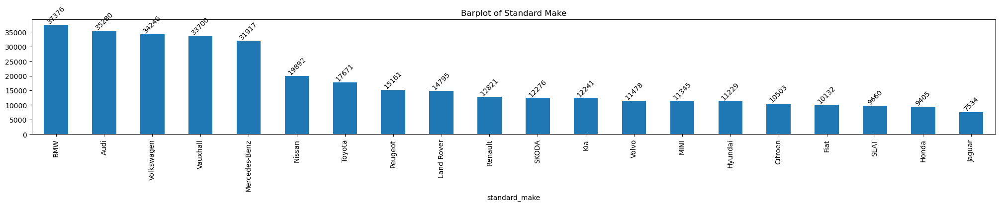

In [170]:
# Detailed Visualization the dispersion measures of standard_make column via bar plot
plt.figure(figsize=(25, 3))
plt.ticklabel_format(style='plain')
ax = df['standard_make'].value_counts().nlargest(20).plot(kind='bar')

# Labeling bars in the barplot
for i in ax.containers:
    ax.bar_label(i, rotation= 45, label_type="edge")
plt.title("Barplot of Standard Make")
plt.show()

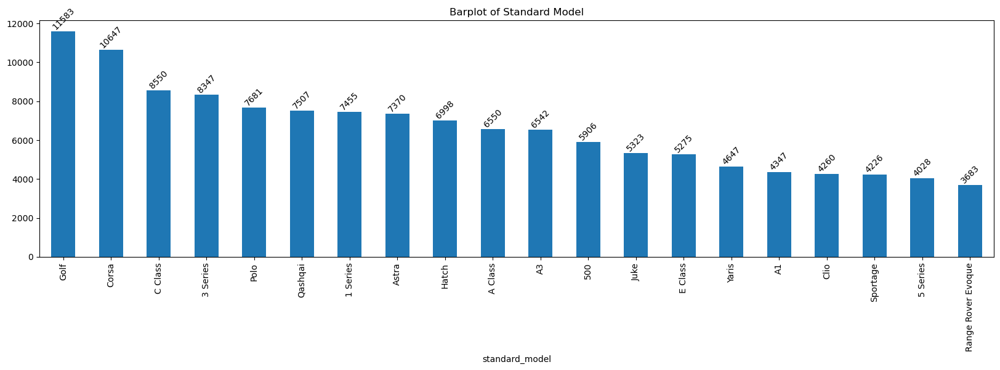

In [171]:
# Detailed Visualization the dispersion measures of standard_model column via bar plot
plt.figure(figsize=(20, 5))
plt.ticklabel_format(style='plain')
ax = df['standard_model'].value_counts().nlargest(20).plot(kind='bar')

# Labelling bars in the barplot
for i in ax.containers:
    ax.bar_label(i, rotation= 45, label_type="edge")
plt.title("Barplot of Standard Model")
plt.show()

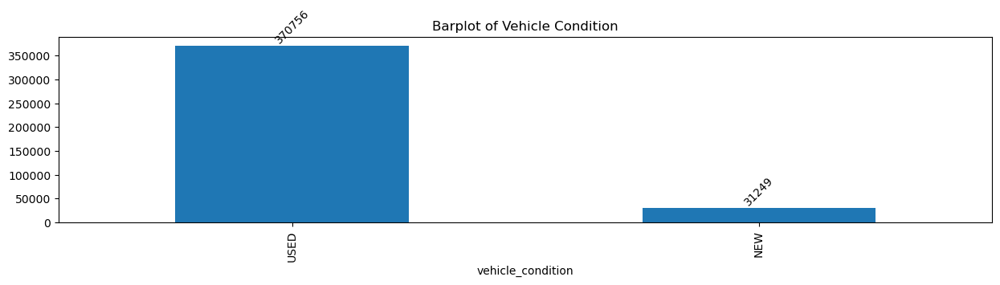

In [172]:
# Detailed Visualization the dispersion measures of vehicle_condition column via bar plot
plt.figure(figsize=(15, 3))
plt.ticklabel_format(style='plain')
ax = df['vehicle_condition'].value_counts().plot(kind='bar')

# Labelling bars in the barplot
for i in ax.containers:
    ax.bar_label(i, rotation= 45, label_type="edge")
plt.title("Barplot of Vehicle Condition")
plt.show()

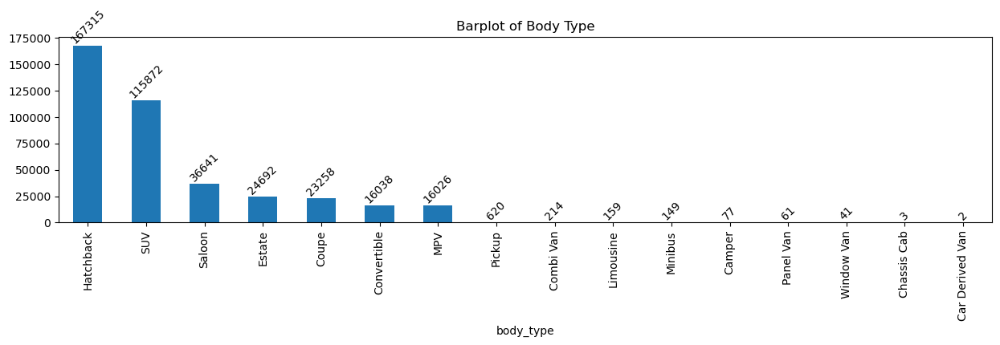

In [173]:
# Detailed Visualization the dispersion measures of body_type column via bar plot
plt.figure(figsize=(15, 3))
plt.ticklabel_format(style='plain')
ax = df['body_type'].value_counts().plot(kind='bar')

# Labelling bars in the barplot
for i in ax.containers:
    ax.bar_label(i, rotation= 45, label_type="edge")
plt.title("Barplot of Body Type")
plt.show()

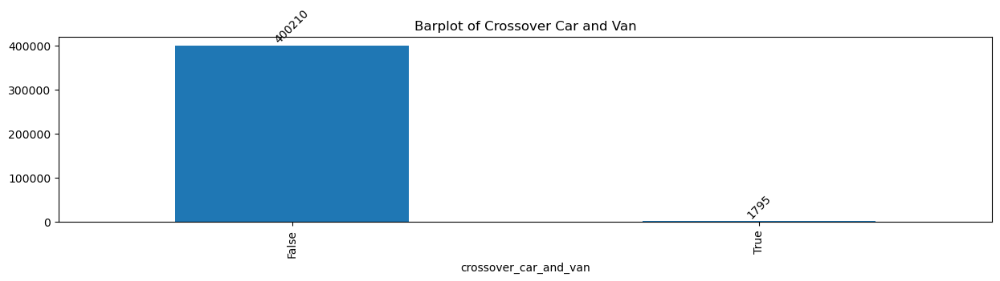

In [174]:
# Detailed Visualization the dispersion measures of crossover_car_and_van column via bar plot
plt.figure(figsize=(15, 3))
plt.ticklabel_format(style='plain')
ax = df['crossover_car_and_van'].value_counts().plot(kind='bar')

# Labelling bars in the barplot
for i in ax.containers:
    ax.bar_label(i, rotation= 45, label_type="edge")
plt.title("Barplot of Crossover Car and Van")
plt.show()

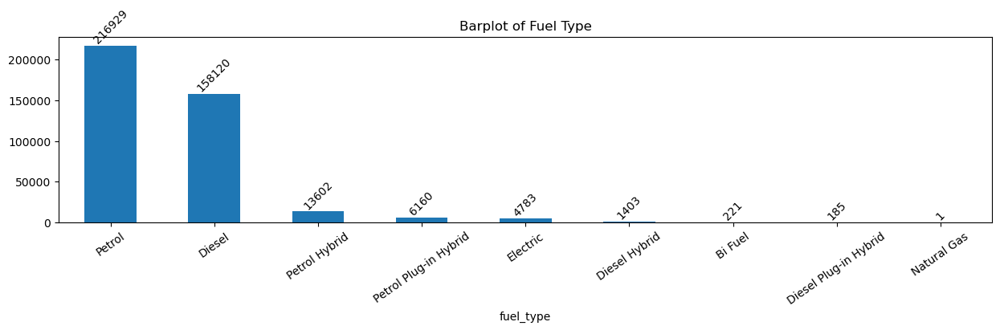

In [175]:
# Detailed Visualization the dispersion measures of fuel_type column via bar plot
plt.figure(figsize=(15, 3))
plt.ticklabel_format(style='plain')
ax = df['fuel_type'].value_counts().plot(kind='bar')
plt.xticks(rotation=35)

# Labelling bars in the barplot
for i in ax.containers:
    ax.bar_label(i, rotation= 45, label_type="edge")
plt.title("Barplot of Fuel Type")
plt.show()

<b> Observation(s): </b>

* `reg_code` seems to have more registeration code which have numbers instead of single letters. This piece of information helps in assuming that most of the cars were registered in the era of 2000's.
* `standard_colour` shows that black, white, and gray are the popular colour choices of people when they buy a car.
* `standard_make` reveals another interesting insight that BMW, Vaukhwagen, Nissan, Toyota, and similar brands are prevalent in numbers which are known to be the ones which people from every class and budget can afford. This information coincides with the `price` column's earlier findings which showed that most of the cars in the inventory are cheaper cars.
* `standard_model` does not reveal any trend because it is simply composed of models which are most assosciated with cheaper and luxuy cars like Volkswagen Golf, Vauxhall Corsa, Mercedes-Benz C-Class, and BMW 3 Series.
* `vehicle_condition` tells that as AutoTrader deals with majorly of used cars, they are higher in number than the newer cars.
* `body_type` reveals that majority of the cars on display are hatchbacks, which are cheaper to buy than SUV because of the smaller size, being lightweight and have one of the best fuel economy. This synchronize with the other earlier analysis that common people are more interested in AutoTrader for buying or selling cars.
* `fuel_type` gives a very common insight that generally in the UK and around the world, cheaper cars' fuel type consist of Petrol & Diesel and these are the cars which are also commonly found on the roads as well. As the other technologies are not an prevailent in the world, the number of users are also lesser than the other fuel types as well.

### <b>k. Outlier Detection of Qualitative Columns</b>

In [176]:
# Saving the list of the categorical columns in a variable
categorical_columns = df.select_dtypes(include='object').columns.tolist()

# Setting the threshold for the least number of values in all the categorical columns which might be outliers
threshold = 5  

# Executing the code for the least number of values in all the categorical columns which might be outliers
for i in categorical_columns:
    print("Column Name:", i)
    less_numbers = df[i].value_counts()[df[i].value_counts() < threshold].index.tolist()
    print("Rare Categories:", less_numbers)

Column Name: reg_code
Rare Categories: ['95', '94', '37', 'k', '38', 's', 'CA', '723xuu', 'FW', 'm', '85', 'p']
Column Name: standard_colour
Rare Categories: ['Indigo']
Column Name: standard_make
Rare Categories: ['Maybach', 'Lancia', 'Holden', 'Opel', 'Jensen', 'Ariel', 'AC', 'Tiger', 'Aixam', 'Beauford', 'Noble', 'Plymouth', 'BAC', 'Pilgrim', 'Dax', 'Zenos', 'Sebring', 'Datsun', 'Gentry', 'Radical', 'Pontiac', 'Buick', 'Mitsuoka', 'AK', 'Carbodies', 'Mev', 'Ultima', 'Panther', 'Leyland', 'Reliant', 'Bristol', 'Wolseley', 'Pagani', 'International', 'Custom Vehicle']
Column Name: standard_model
Rare Categories: ['560', 'Talento', 'Kyron', 'Relay', 'Frontera', 'Alpina B3', 'Tamora', 'Odyssey', 'Charger', 'Boxer', 'P1', '918', 'Tribeca', 'RV8', 'Alpina XD3 Bi-Turbo', 'Commander', 'Seicento', 'T Series', 'Exiga', 'GTO', 'Cygnet', 'Escalade', 'Series I', 'Silver Spur', 'NV250', 'Sienta', 'Stream', 'Epica', 'Lightweight', '4200', '380', '11', 'Z8', 'DB5', 'Pajero', 'Countach', 'CTS', 'Alpin

<b> Observation(s): </b>

As outliers in categorical column cannot be viewed as a boxplot, a different technique <a href="https://www.geeksforgeeks.org/wand-threshold-function-python/" target="_blank">threshold() </a> was used to get some insights on the them.

* `reg_code` reveals that cars having older number plates are lesser in numbers.
* `standard_colour` does not reveal much as they are just colour of cars which are not much in quantity
* `standard_make` & `standard_model` does not reveal much except that it has names of manufacturers like Bugatti which are not that much known to customers.
* `body_type` shows us that commercial automobile like Chassis Cab are lesser in numbers because it is a known website for primarily private customers.
* `fuel_Type` reveals that natural gas is the least fuel type of cars on display

### <b>l. Identify Good Predictors</b>

There are quite a number of predictors which are considered for being good enough for predicting price of a vehicle based on the understanding of the problem, domain, and related research:

* `mileage` - Generally prices are highly dependent on the mileage of the vehicle because if a vehicle has a high mileage, then it is considered that it has gone through a significant detoriation and that decreases the price of the car significantly.

* `standard_make` - Although it may seem that the name of the manufacturer might not be a feature that will help in predicting the price of the car; but it does play a key role because generally a reputation attached to the name does have an influence on not only the price of the vehicle, but also it helps in retaining a vehicle's value for a significant amount of time.

* `standard_model` - There are numerous vehicle manufacturers which launch models of the cars with different price points just to attract customers of different price segments. For instance, recently <a hred="https://www.carwale.com/new/best-maruti-suzuki-cars-under-10-lakh/" target="_blank">Suzuki</a> launched Maruti Suzuki K10 which targeted customers with low price point, and on the other hand, it also launched Maruti Suzuki Grand Vitara for customers with high budget.

* `standard_colour` - With almost all of the vehicle brands, some of the colour are more popular than others, and it significantly contributes to the price of the car. For instance, <a href="https://www.freecarmag.com/the-classic-valuer-are-ferraris-really-worth-more-in-red#:~:text=Resale%20red%20is%20certainly%20the,blue%2C%20both%20at%2011%25." target="_blank">Ferrari</a> is a renowned brand where almost 54 percent of their vehicles are sold in red. The second and third most famous colours were black and gray, both at 11 percent.

* `vehicle_condition` - As per AutoTrader, two vehicle conditions are mentioned in the dataset and it is comprised of NEW and USED. So, this must be a good predictor based on the assumption that used cars are priced lower than the newer ones.

* `year_of_registration` - The year on which a vehcile is registered is selected to be a good estimator because the more recent a car is registered, the smaller difference in the retail and present price of that same vehicle will be. That is why, generally all the cars are priced according to the year in which they were first registered.

* `body_type` - In the market, there are vehicles with several body types available, based on the number of features included in them. That is why different body types are priced higher or lower according to their features and demand. For instance, <a href="https://www.gbvehicleleasing.co.uk/news/car-body-types#:~:text=Hatchbacks%20tend%20to%20have%20lower,contribute%20to%20lower%20insurance%20rates." target="_blank">Hatchbacks</a> are not only priced lower, but they also does not hold their price for a longer period of time when it comes with other types like convertible.

* `crossover_car_and_van` - Around the world, <a href="https://www.autotrader.co.uk/content/advice/what-is-a-crossover-car" target="_blank">crossovers</a> are priced higher because they they offer more space than a car, offer better visibility to the drivers, more suited for difficult terrain, usually come with available AWD, and offer other features. 

* `fuel_type` - Due to technological advances in the automobile industry, new and efficient fuel systems are installed in the vehicles. However, due to the different type of costs associated with newer technologies, vehicles with those systems are generally priced higher than old and conventional systems of petrol and diesel.

On the other hand, there are a couple of features that will not be considered for being a good predictor because they do not play any part in predicting price of any vehicle within this dataset due to the nature of these two features:

* `public_reference` - This feature is only used as a unique identifier for an advertisement of a vehicle on the website and it does not depend on the other feature to formulate a value in this column. As it is only an identifier that is why it is not considered a predictor for predicting price of the vehicle.

* `reg_code` - Just like an other country, the values in this features are used for registration of the vehicle for primarily identification, record keepiing, and taxation purposes by the relevant fovernment department.

### <b>m. Data Processing for Exploration and Visualization</b>

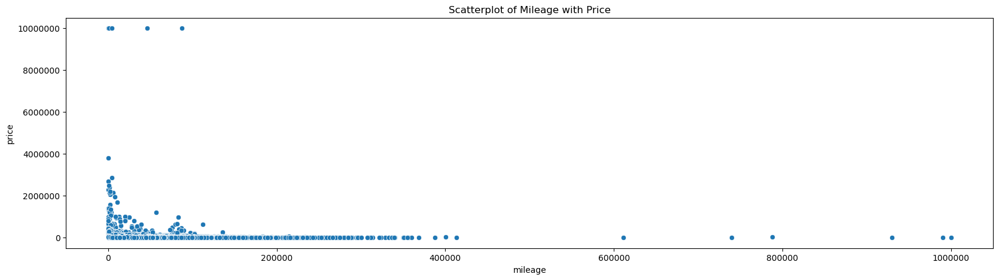

In [177]:
# Scatterplot of mileage with price
plt.figure(figsize=(20, 5))
plt.ticklabel_format(style='plain')
sns.scatterplot(data=df, x='mileage', y='price')
plt.title("Scatterplot of Mileage with Price")
plt.show()

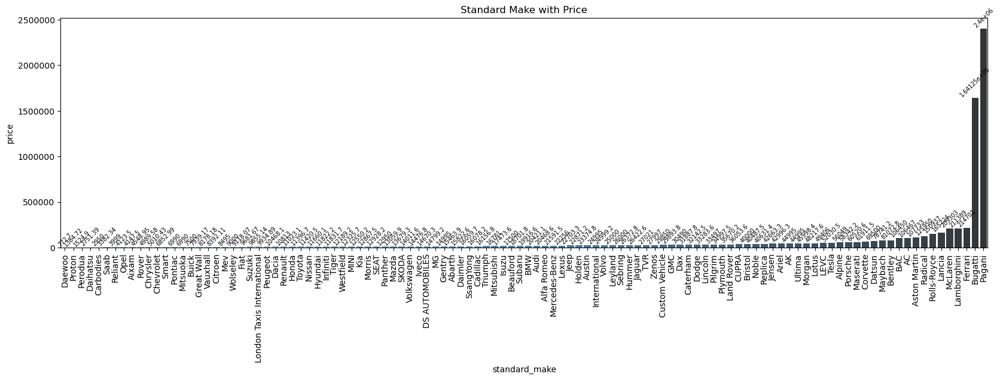

In [178]:
# Bar plot of standard_make with price 
plt.figure(figsize=(20, 5))
plt.ticklabel_format(style='plain')
ax = sns.barplot(data=df.groupby('standard_make')['price'].mean().reset_index().sort_values(by='price', ascending=True), x='standard_make', y='price', errorbar=None, palette='Blues_d')
plt.xticks(rotation=90)
for i in ax.containers:
    ax.bar_label(i, rotation=45 ,label_type="edge", size=7)
plt.title("Standard Make with Price")
plt.show()

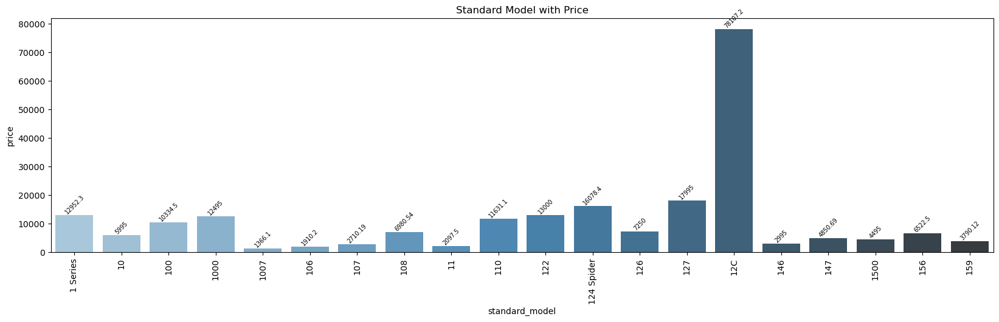

In [179]:
# Bar plot of standard_make with price 
plt.figure(figsize=(20, 5))
plt.ticklabel_format(style='plain')
ax = sns.barplot(data=df.groupby('standard_model')['price'].mean().reset_index().sort_values(by='standard_model', ascending=True).head(20), x='standard_model', y='price', errorbar=None, palette='Blues_d')
plt.xticks(rotation=90)
for i in ax.containers:
    ax.bar_label(i, rotation=45 ,label_type="edge", size=7)
plt.title("Standard Model with Price")
plt.show()

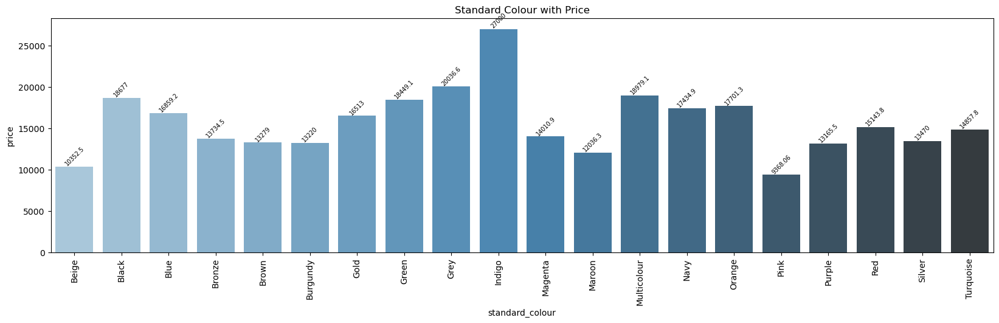

In [180]:
# Bar plot of standard_colour with price
plt.figure(figsize=(20, 5))
plt.ticklabel_format(style='plain')
ax = sns.barplot(data=df.groupby('standard_colour')['price'].mean().reset_index().sort_values(by='standard_colour', ascending=True).head(20), x='standard_colour', y='price', errorbar=None, palette='Blues_d')
plt.xticks(rotation=90)
for i in ax.containers:
    ax.bar_label(i, rotation=45 ,label_type="edge", size=7)
plt.title("Standard Colour with Price")
plt.show()

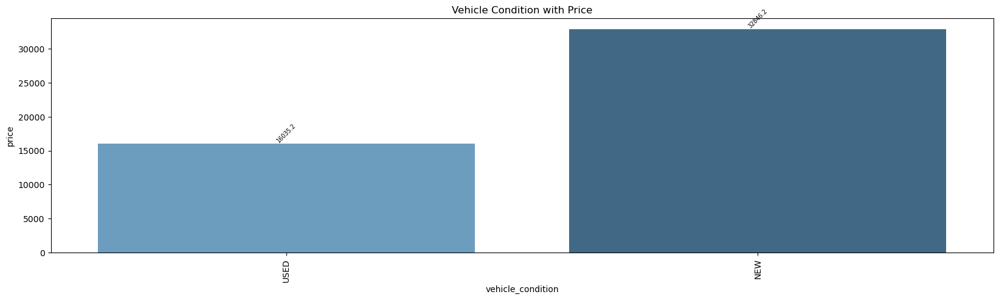

In [181]:
# Bar plot of vehicle_condition with price
plt.figure(figsize=(20, 5))
plt.ticklabel_format(style='plain')
ax = sns.barplot(data=df.groupby('vehicle_condition')['price'].mean().reset_index().sort_values(by='price', ascending=True).head(20), x='vehicle_condition', y='price', errorbar=None, palette='Blues_d')
plt.xticks(rotation=90)
for i in ax.containers:
    ax.bar_label(i, rotation=45 ,label_type="edge", size=7)
plt.title("Vehicle Condition with Price")
plt.show()

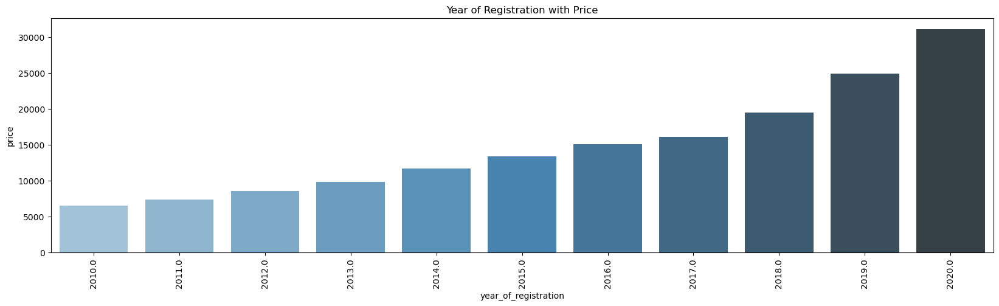

In [182]:
# Bar plot of year_of_registration with price
plt.figure(figsize=(20, 5))
plt.ticklabel_format(style='plain')
ax = sns.barplot(data=df.query("year_of_registration >= 2010.0").groupby('year_of_registration')['price'].mean().reset_index().sort_values(by='year_of_registration', ascending=True), x='year_of_registration', y='price', errorbar=None, palette='Blues_d')
plt.xticks(rotation=90)
plt.title("Year of Registration with Price")
plt.show()

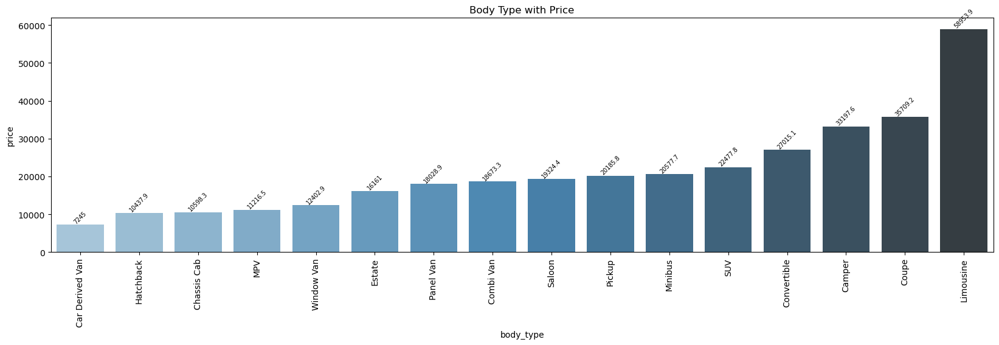

In [183]:
# Bar plot of body_type with price
plt.figure(figsize=(20, 5))
plt.ticklabel_format(style='plain')
ax = sns.barplot(data=df.groupby('body_type')['price'].mean().reset_index().sort_values(by='price', ascending=True).head(20), x='body_type', y='price', errorbar=None, palette='Blues_d')
plt.xticks(rotation=90)
for i in ax.containers:
    ax.bar_label(i, rotation=45 ,label_type="edge", size=7)
plt.title("Body Type with Price")
plt.show()

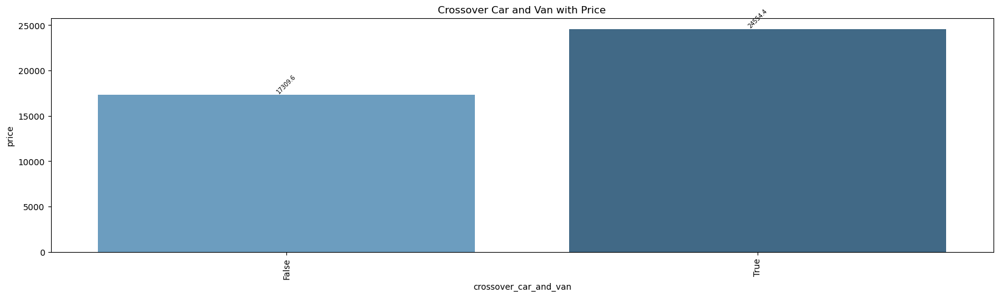

In [184]:
# Bar plot of crossover_car_and_van with price
plt.figure(figsize=(20, 5))
plt.ticklabel_format(style='plain')
ax = sns.barplot(data=df.groupby('crossover_car_and_van')['price'].mean().reset_index().sort_values(by='price', ascending=True).head(20), x='crossover_car_and_van', y='price', errorbar=None, palette='Blues_d')
plt.xticks(rotation=90)
for i in ax.containers:
    ax.bar_label(i, rotation=45 ,label_type="edge", size=7)
plt.title("Crossover Car and Van with Price")
plt.show()

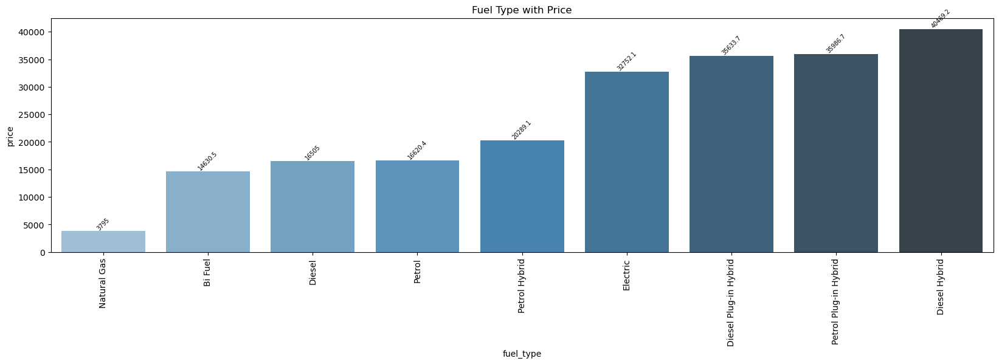

In [185]:
# Bar plot of fuel_type with price
plt.figure(figsize=(20, 5))
plt.ticklabel_format(style='plain')
ax = sns.barplot(data=df.groupby('fuel_type')['price'].mean().reset_index().sort_values(by='price', ascending=True).head(20), x='fuel_type', y='price', errorbar=None, palette='Blues_d')
plt.xticks(rotation=90)
for i in ax.containers:
    ax.bar_label(i, rotation=45 ,label_type="edge", size=7)
plt.title("Fuel Type with Price")
plt.show()

<b>Observation(s):</b>
* According to the first bar plot, it can be easily observed that as `mileage` increase, then `price` of the vehicle decreases. It means that there is a negative but strong association in between them.

* In the second plot in between `standard_make` and `price`, it is observed that the mean price of expensive brands like Bugatti, Ferrari, Lamborgini are priced higher than other cheaper ones like Toyota, Honda, etc.

* Third bar plot which is in between `standard_model` and `price` gives a clear indication that different models of cars being launched by their respective manufacturers have a strong impact on the price of the car.

* Next plot in between `standard_colour` and `price` shows a clear indication that different colours of vehicles are prices differently in the world and it is based on the popularity and demand from the customers.

* `Vehicle_condition` association with `price` is extremely strong because as per the plot, new cars are priced higher than the cheaper ones, irrespective of the make of model of the vehicle.

* Another interesting plot in between `year_of_registration` with `price` reveals that the mean value of cars decreased with longer periods of time and it shows the strong relevance in predicting the price of a car.

* `body_type` association with `price` in terms of a bar plot confirms that the body type of a car is highly related to the price of a vehicle. For instance, Hutchback is priced much lower than Limousine, Coupe, and others.

* As mentioned earlier, crossover cars are priced higher due to a number of features which were mentioned earlier and are not found in vehicles which are not crossover. Bar plot in between `crossover_car_and_van` and `price` confirms it.

* Last bar plot in between `fuel_type` and `price` confirms that vehicles which have fuel systems like petrol and diesel fitted priced lower than the latest and expensive ones like Diesel Hybrid, Electric, etc.



## <b>2. Data Processing for Machine Learning</b>

### <b>a. Detecting & Dealing with Possible Duplicates</b>

In [186]:
# Checking for duplicate rows in the dataset
duplicate_rows = df[df.duplicated()]
print("Number of duplicate rows: ", duplicate_rows.shape)

Number of duplicate rows:  (0, 12)


<b>Observation(s):</b>

* No duplicates were found in the dataset

### <b>b. Checking for Possible Outliers and Deleting Them</b>

In [187]:
# Detecting any possible outliers in the mileage in a series and deleting them
mileage_counts = df['mileage'].value_counts().to_frame().reset_index().sort_values(by='mileage', ascending=True)
mileage_counts.columns = ['mileage', 'count']
pd.set_option('display.max_rows', None)
print(mileage_counts)

        mileage  count
0           0.0  16207
87          1.0    724
177         2.0    139
178         3.0    137
165         4.0    164
2           5.0   2434
136         6.0    298
157         7.0    180
122         8.0    397
140         9.0    241
1          10.0  12873
142        11.0    237
144        12.0    224
219        13.0     84
209        14.0     98
72         15.0    795
235        16.0     70
370        17.0     42
321        18.0     47
283        19.0     54
92         20.0    658
352        21.0     43
375        22.0     41
755        23.0     21
724        24.0     22
104        25.0    592
679        26.0     24
855        27.0     18
1286       28.0     12
791        29.0     20
232        30.0     72
1190       31.0     13
928        32.0     17
2657       33.0      9
3968       34.0      8
837        35.0     19
1763       36.0     10
1798       37.0     10
1406       38.0     11
2493       39.0      9
468        40.0     34
7590       41.0      6
441        

In [188]:
df.query('mileage == 999999.0')

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
43974,202008122406434,999999.0,63,White,Vauxhall,Astra,USED,2013.0,9999,Hatchback,False,Diesel


In [189]:
df.drop(df[df['mileage'] == 999999.0].index, inplace=True)

In [190]:
df.query('mileage == 999999.0')

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type


In [191]:
# Detecting any possible outliers in the reg_code column in a series and deleting them
regcode_counts = df['reg_code'].value_counts().to_frame().reset_index().sort_values(by='reg_code', ascending=True)
regcode_counts.columns = ['reg_code', 'count']
pd.set_option('display.max_rows', None)

print(regcode_counts)

   reg_code  count
37       02    559
35       03    880
32       04   1307
31       05   1728
29       06   2373
25       07   3438
24       08   4028
23       09   4076
21       10   5390
19       11   6233
17       12   7375
15       13   9041
12       14  11470
9        15  14010
5        16  19998
0        17  36738
4        18  21613
6        19  18407
10       20  12785
62       37      1
64       38      1
38       51    381
36       52    576
34       53    890
33       54   1279
30       55   1789
28       56   2509
26       57   3415
27       58   3266
22       59   5233
20       60   5551
18       61   6657
16       62   8251
13       63  10428
11       64  12729
7        65  15635
2        66  25227
1        67  32230
8        68  15621
3        69  23825
14       70  10284
67   723xuu      1
70       85      1
61       94      2
60       95      2
59        A     28
58        B     43
57        C     47
66       CA      1
56        D     48
55        E     66
54        F 

In [192]:
# Detecting any possible outliers in the year_of_registration column in a series and deleting them
yreg_counts = df['year_of_registration'].value_counts().to_frame().reset_index().sort_values(by='year_of_registration', ascending=True)
yreg_counts.columns = ['year_of_registration', 'count']
pd.set_option('display.max_rows', None)

print(yreg_counts)

    year_of_registration  count
68                 999.0      3
74                1006.0      1
63                1007.0      3
73                1008.0      1
69                1009.0      2
79                1010.0      1
83                1015.0      1
81                1016.0      1
75                1017.0      1
76                1018.0      1
82                1063.0      1
72                1515.0      1
77                1909.0      1
71                1933.0      2
80                1934.0      1
78                1950.0      1
70                1952.0      2
62                1954.0      4
64                1955.0      3
65                1956.0      3
61                1957.0      5
67                1958.0      3
66                1959.0      3
60                1960.0      5
58                1961.0      7
53                1962.0     10
57                1963.0      7
49                1964.0     14
48                1965.0     14
56                1966.0      8
55      

In [193]:
df.query('year_of_registration <= 1909.0')

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
59010,202006270588110,14000.0,07,Blue,Toyota,Prius,USED,1007.0,7000,Hatchback,False,Petrol Hybrid
69516,202010155035879,96659.0,65,Black,Audi,A4 Avant,USED,1515.0,10385,Estate,False,Diesel
84501,202009163810376,37771.0,63,Black,Smart,fortwo,USED,1063.0,4785,Coupe,False,Petrol
114737,202008102305925,30000.0,59,Red,Toyota,AYGO,USED,1009.0,4695,Hatchback,False,Petrol
120858,202010064654489,27200.0,66,Black,MINI,Clubman,USED,1016.0,18990,Estate,False,Diesel
148003,202010104836987,31172.0,09,Black,Hyundai,i10,USED,1909.0,3950,Hatchback,False,Petrol
190556,202010205206488,58470.0,10,Black,Fiat,Punto Evo,USED,1010.0,3785,Hatchback,False,Petrol
199830,202009013167637,23000.0,59,Silver,MINI,Hatch,USED,1009.0,5995,Hatchback,False,Petrol
199987,202010225311657,104000.0,08,Silver,BMW,1 Series,USED,1008.0,4395,Convertible,False,Petrol
201616,202010134937656,8600.0,68,Silver,BMW,M2,USED,1018.0,41990,Coupe,False,Petrol


In [194]:
# Dropping the rows of the column having values less than 1909.0
df.drop(df[df['year_of_registration'] <= 1909.0].index, inplace=True)
df.query('year_of_registration <= 1909.0')

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type


In [195]:
# Detecting any possible outliers in the price in a series and deleting them
price_counts = df['price'].value_counts().to_frame().reset_index().sort_values(by='price', ascending=True)
price_counts.columns = ['price', 'count']
pd.set_option('display.max_rows', None)

print(price_counts)

         price  count
22050      120      1
21144      122      1
20904      150      1
24059      180      1
8480       200      3
18193      225      1
17251      240      1
3789       250     10
21960      258      1
26698      279      1
11555      290      2
5064       295      7
21008      298      1
25431      299      1
2615       300     15
23952      310      1
11310      325      2
20733      345      1
1968       350     22
24128      354      1
30484      375      1
24425      380      1
23154      389      1
3240       390     12
2442       395     16
13384      399      2
3255       400     11
30478      420      1
6323       425      5
25554      449      1
1772       450     26
18604      460      1
5993       475      5
10432      480      3
6357       489      5
1765       490     26
14225      491      2
1148       495     54
19726      498      1
1415       499     37
766        500     94
16644      501      1
30078      508      1
30337      520      1
7358      

In [196]:
df.query('price == 9999999')

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
141833,202007050883898,87450.0,NaN,Red,Ferrari,250,USED,NaN,9999999,Coupe,False,Petrol
147188,202009103539048,100.0,NaN,Grey,Maserati,3500,USED,NaN,9999999,Convertible,False,Petrol
252505,202008112331147,46300.0,NaN,Blue,Ferrari,275,USED,NaN,9999999,Coupe,False,Petrol
305436,201812223434109,3600.0,NaN,Grey,Lamborghini,Miura,USED,NaN,9999999,Coupe,False,Petrol
336202,202001226429470,950.0,NaN,Black,Ferrari,LaFerrari,USED,NaN,9999999,Coupe,False,Petrol
336536,202006180262926,4400.0,NaN,White,Porsche,959,USED,NaN,9999999,Coupe,False,Petrol


In [197]:
df.drop(df[df['price'] == 9999999].index, inplace=True)
df.query('price == 9999999')

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type


<b>Observation(s):</b>

* `Mileage` value of 999999.0 was removed because it is assumed that it was a typing error.

* `year_of_registration` values less than and equal to 1909.0 were removed because either the car models were launched after their registration values or automobiles were not invented by then. So, obviously the values were forged / erroranous and since the values are lesser in numbers, they are dropped.

* `price` value of 9999999 was dropped because of it being entered as either by mistake or deliberately by the seller.

### <b>c. Handling Missing Values & Dealing with Them</b>

In [198]:
# Checking for missing values in the dataset
df.isnull().sum()

public_reference             0
mileage                    127
reg_code                 31851
standard_colour           5378
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration     33305
price                        0
body_type                  837
crossover_car_and_van        0
fuel_type                  601
dtype: int64

In [199]:
# Taking a mode of standard_colour for each standard_make and standard_model combination
standard_model_mode_series = df.groupby(['standard_make', 'standard_model'])['standard_colour'].transform(lambda x: x.mode().iloc[0] if not x.mode().empty else pd.NA)
df['standard_colour'] = df['standard_colour'].fillna(standard_model_mode_series)

In [200]:
# 24 missing values in standard_colour remains which does not have any standard_make and standard_model combination
df.isna().sum()

public_reference             0
mileage                    127
reg_code                 31851
standard_colour             24
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration     33305
price                        0
body_type                  837
crossover_car_and_van        0
fuel_type                  601
dtype: int64

In [201]:
# Taking a mode of body_type for each standard_make and standard_model combination
body_type_mode_series = df.groupby(['standard_make', 'standard_model'])['body_type'].transform(lambda x: x.mode().iloc[0] if not x.mode().empty else pd.NA)
df['body_type'] = df['body_type'].fillna(body_type_mode_series)

In [202]:
# 35 missing values in body_type remains which does not have any standard_make and standard_model combination
df.isna().sum()

public_reference             0
mileage                    127
reg_code                 31851
standard_colour             24
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration     33305
price                        0
body_type                   35
crossover_car_and_van        0
fuel_type                  601
dtype: int64

In [203]:
# Taking a mode of fuel_type for each standard_make and standard_model combination
fuel_type_mode_series = df.groupby(['standard_make', 'standard_model'])['fuel_type'].transform(lambda x: x.mode().iloc[0] if not x.mode().empty else pd.NA)
df['fuel_type'] = df['fuel_type'].fillna(fuel_type_mode_series)

In [204]:
# 16 missing values in body_type remains which does not have any standard_make and standard_model combination
df.isna().sum()

public_reference             0
mileage                    127
reg_code                 31851
standard_colour             24
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration     33305
price                        0
body_type                   35
crossover_car_and_van        0
fuel_type                   16
dtype: int64

In [205]:
# Taking a mean of mileage for each standard_make and standard_model combination
mileage_mean_series = df.groupby(['standard_make', 'standard_model'])['mileage'].transform('mean')
df['mileage'] = df['mileage'].fillna(mileage_mean_series)

In [206]:
df.isna().sum()

public_reference             0
mileage                      0
reg_code                 31851
standard_colour             24
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration     33305
price                        0
body_type                   35
crossover_car_and_van        0
fuel_type                   16
dtype: int64

In [207]:
# Although Registraton Codes are unique for every vehicle registered, however we will assume that specific cars have specific registration codes and will take a mode of registration code for each standard_make and standard_model combination
df.groupby(['standard_make','standard_model','reg_code']).size().reset_index().rename(columns={0:'Count'}).sort_values(by='Count', ascending=False).nlargest(3, 'Count')

,standard_make,standard_model,reg_code,Count
8249,Nissan,Qashqai,17,1005
12219,Volkswagen,Golf,17,945
8264,Nissan,Qashqai,67,930


In [208]:
# Taking a mode of reg_code for each standard_make and standard_model combination
reg_code_mode_series = df.groupby(['standard_make', 'standard_model'])['reg_code'].transform(lambda x: x.mode().iloc[0] if not x.mode().empty else pd.NA)
df['reg_code'] = df['reg_code'].fillna(reg_code_mode_series)

In [209]:
# 52 missing values in reg_code remains which does not have any standard_make and standard_model combination
df.isnull().sum()

public_reference             0
mileage                      0
reg_code                    52
standard_colour             24
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration     33305
price                        0
body_type                   35
crossover_car_and_van        0
fuel_type                   16
dtype: int64

In [210]:
# Although the values in year_of_registration should b unique irrespective of the release, but for the sake of filling the missing data, we assume that cars were registered
# in the same year of the release of a vehicle.
df.groupby(['standard_make','standard_model','year_of_registration']).size().reset_index().rename(columns={0:'Count'}).sort_values(by='Count', ascending=False).nlargest(5, 'Count')

,standard_make,standard_model,year_of_registration,Count
5087,Nissan,Qashqai,2017.0,1915
7534,Volkswagen,Golf,2017.0,1802
4329,Mercedes-Benz,C Class,2019.0,1620
7636,Volkswagen,Polo,2017.0,1583
4949,Nissan,Juke,2017.0,1582


In [211]:
# Taking a mode of year_of_registration for each standard_make and standard_model combination
year_of_registration_mode_series = df.groupby(['standard_make', 'standard_model'])['year_of_registration'].transform(lambda x: x.mode().iloc[0] if not x.mode().empty else pd.NA)
df['year_of_registration'] = df['year_of_registration'].fillna(year_of_registration_mode_series)

In [212]:
# 28 missing values in year_of_registration remains which does not have any standard_make and standard_model combination
df.isna().sum()

public_reference          0
mileage                   0
reg_code                 52
standard_colour          24
standard_make             0
standard_model            0
vehicle_condition         0
year_of_registration     28
price                     0
body_type                35
crossover_car_and_van     0
fuel_type                16
dtype: int64

In [213]:
# Deleting all the remaining missing values in the dataset 
df.dropna(inplace=True)

In [214]:
#Rechecking whether all the missing values have been handled
df.isna().sum()

public_reference         0
mileage                  0
reg_code                 0
standard_colour          0
standard_make            0
standard_model           0
vehicle_condition        0
year_of_registration     0
price                    0
body_type                0
crossover_car_and_van    0
fuel_type                0
dtype: int64

In [215]:
# Checking out the shape of the dataset after handling missing values
df.shape

(401872, 12)

<b>Observation(s):</b>

* For `standard_colour`, `standard_make` & `standard_model` were grouped by and value of it's relevant mode was taken & updated in the relevant observations with NaN values.
* For `body_type`, `standard_make` & `standard_model` were grouped by and value of it's relevant mode was taken & updated in the relevant observations with NaN values.
* For `fuel_type`, `standard_make` & `standard_model` were grouped by and value of it's relevant mode was taken & updated in the relevant observations with NaN values.
* For `mileage`, `standard_make` & `standard_model` were grouped by and value of it's relevant mean was taken & updated in the relevant observations with NaN values.
* For `reg_code`, `standard_make` & `standard_model` were grouped by and value of it's relevant mode was taken & updated in the relevant observations with NaN values.
* For `year_of_registration`, `standard_make` & `standard_model` were grouped by and value of it's relevant mode was taken & updated in the relevant observations with NaN values.
* The rest of the 155 NaN values were dropped as it did not have any way to be resolved.
</n>

* Out of the `402,005` observations in the original dataset with erroneous / missing values, `99.97` percent of the values were wrangled based on the patterns / extractions for the existing related values, and because of that `401,872` observations are ready to for the next phase of modelling / reshaping in the EDA.

### <b>d. Engineering Features for Improved Analysis</b>

In [216]:
# Changing year_of_registration data type in columns from float64 to int64
df['year_of_registration'] = df['year_of_registration'].astype('int64')

In [217]:
# Checking whether the data types of year_of_registration has been changed
df['year_of_registration'].dtypes

dtype('int64')

In [218]:
# According to assumptional research, mileage up to 100 miles is considered as new car, so we will replace status with `NEW` for mileage less than or equals to 100 miles
mask = (df['vehicle_condition'] == 'USED') & (df['mileage'] <= 100)
x = df[mask].sort_values(by='mileage', ascending=False)['vehicle_condition'].replace('USED', 'NEW')
df.update(x)

In [219]:
# Checking whether the vehicle_condition has been updated
df.query('vehicle_condition == "USED" and mileage <= 100')

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type


<b>Observation(s):</b>
* The datatype of `year_of_registration` was changed from `float64` to `int64` because it will be easier to visualize in the next step.
* Some of the research was done regarding the status of vehicle and in relation to that it is assumed that cars having `mileage` value till 100 miles is considered as 'NEW' in the `vehicle_condition` column and the rest will be considered as 'OLD' cars.

### <b>e. Modeling the Dataset</b>

In [220]:
# Declaring price bins and it's related labels for the used cars
price_bins = [0, 13999, 17999, 21999, 25999, 29999, 33999, 37999, float('inf')]
price_labels = ['Very Low', 'Low', 'Medium-Low', 'Medium', 'Medium-High', 'High', 'Very High', 'Luxury']

# Executing the query to select used car condition & inseting the price category in the dataset
df['price_category'] = pd.cut(df.query('vehicle_condition == "USED"')['price'], bins=price_bins, labels=price_labels, right=True)

In [221]:
# Extracting sample of the dataset
df.query('vehicle_condition == "USED"').head(5)

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,price_category
1,202007020778260,108230.0,61,Blue,Jaguar,XF,USED,2011,7000,Saloon,False,Diesel,Very Low
2,202007020778474,7800.0,17,Grey,SKODA,Yeti,USED,2017,14000,SUV,False,Petrol,Low
3,202007080986776,45000.0,16,Brown,Vauxhall,Mokka,USED,2016,7995,Hatchback,False,Diesel,Very Low
4,202007161321269,64000.0,64,Grey,Land Rover,Range Rover Sport,USED,2015,26995,SUV,False,Diesel,Medium-High
5,202009304412074,16000.0,17,Blue,Audi,S5,USED,2017,29000,Convertible,False,Petrol,Medium-High


In [222]:
# Declaring price bins and it's related labels for new cars
price_bins = [0, 11999, 16999, 21999, 35999, 49999, 69999, 99999, float('inf')]
price_labels = ['Very Low', 'Low', 'Medium-Low', 'Medium', 'Medium-High', 'High', 'Very High', 'Luxury']

df.loc[df['vehicle_condition'] == 'NEW', 'price_category'] = pd.cut(df.loc[df['vehicle_condition'] == "NEW", 'price'], bins=price_bins, labels=price_labels, right=True)

In [223]:
# Extracting sample of the dataset with new cars
df.query('vehicle_condition == "NEW"').head(5)

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,price_category
0,202006039777689,0.0,69,Grey,Volvo,XC90,NEW,2019,73970,SUV,False,Petrol Plug-in Hybrid,Very High
17,201911043995897,5.0,17,Black,Nissan,X-Trail,NEW,2017,27595,SUV,False,Diesel,Medium
19,202008272998331,0.0,20,White,Volkswagen,T-Cross,NEW,2020,25000,SUV,False,Petrol,Medium
37,202001306737473,0.0,70,White,Fiat,Panda,NEW,2014,13999,Hatchback,False,Petrol,Low
44,202003178531910,0.0,67,Silver,Honda,Civic,NEW,2017,19495,Hatchback,False,Petrol,Medium-Low


In [224]:
# Checking if there are NaN values in the dataset
df.isna().sum()

public_reference         0
mileage                  0
reg_code                 0
standard_colour          0
standard_make            0
standard_model           0
vehicle_condition        0
year_of_registration     0
price                    0
body_type                0
crossover_car_and_van    0
fuel_type                0
price_category           0
dtype: int64

<b>Observation(s):</b>

* As the dataset is four years old and data regarding to inflation rate, depreciation rate, market demand & trends, regional price differences, and model-specific factors were not available so it is assumed that the age of the vehicle is being calculated & assumed by subtracting 2021 from `year_of_registration` to help with association.
* A new `price_category` column was created using a new function <a href="https://pandas.pydata.org/docs/reference/api/pandas.cut.html" target="blank">pd.cut</a> after distributing and labelling the `price` values into almost equal-sized quantiles / bins. All those categories are assumed after getting the price ranges from <a href="https://www.honestjohn.co.uk/used-prices/2020/" target="blank">Honest John</a> for meaningful categories for analysis or visualization for old car price ranges. Furthermore, similar code was executed for cars where `vehicle_condition` is NEW and data was researched and assumed from different websites like <a href="https://www.motors.co.uk/car-price-guide/" target="blank">Motors CO UK</a>.

In [225]:
# Checking the shape of the dataset
df.head(1)

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,price_category
0,202006039777689,0.0,69,Grey,Volvo,XC90,NEW,2019,73970,SUV,False,Petrol Plug-in Hybrid,Very High


#### <b>f. Dropping Irrelevant Features</b>

In [226]:
# Dropping the public_reference and reg_code columns from the dataset
df = df.drop(['public_reference', 'reg_code'], axis=1)
df = df[['standard_make', 'standard_model', 'standard_colour', 'body_type', 'vehicle_condition', 'crossover_car_and_van', 'fuel_type', 'mileage', 'year_of_registration', 'price_category', 'price']]

df.head(1)

,standard_make,standard_model,standard_colour,body_type,vehicle_condition,crossover_car_and_van,fuel_type,mileage,year_of_registration,price_category,price
0,Volvo,XC90,Grey,SUV,NEW,False,Petrol Plug-in Hybrid,0.0,2019,Very High,73970


#### <b>g. Sampling / Subsetting of the Whole Dataset</b>

Whole dataset of more than 400k rows was processed for the majority of the time. Even though the accuracy scores of all the models with such a large dataset were still good, but it was taking more than five hours to process the whole notebook. So, a small sample / subset of the whole dataset will be utilized for the last section of visualization:

* To reduce the computational time and cognitive load.
* To view and interpret trends more clearly and precisely.
* To fine-tune and improve overall process of the assessment.
* To remove bias and also to generate a representative sample for ‘every year’ so that both old and new cars, irrespective of when they were registered and how many data points they have will be included. In this way, whole timeline will have equal representation without elimination of a specific car or year.

In [227]:
# Initiating variables of target variable and random state value
predictor = 'price'
rs = 5

# Taking a sample of the dataset
df = df.groupby('year_of_registration').sample(frac=0.02, random_state= rs).reset_index().copy()
df.shape

# Dropping the index column
df.drop(['index'], axis=1, inplace=True)


#### <b>h. Splitting Data into Predictors and Target</b>

Initially, an X variable will be created after dropping the price column and another variable y will be created which will have only the target variable. Additionally, the sampled dataset will be split into X_train, y_train, X_test, and y_test datasets so that it can be encoded and scaled as per the needs.

In [228]:
# Splitting the target from the dataset & obtaining the train-test split
X = df.drop(columns=predictor)
y = df[predictor]
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state= rs, test_size=0.25) # Test Size of 25% is selected

# Checking the shape of the train and test datasets
X_train.shape, X_test.shape

((6027, 10), (2009, 10))

#### <b>i. Categorically-encode the Relevant Columns</b>

One-Hot Encoding will not be used here because it created a lot of columns and made the dataset very sparse. Label Encoding also did not give good scores. So, Target Encodingg will be applied which is more closer and relevant to the categorical features in the dataset and it will not output any issues like overfitting or unfitting of data.

In [229]:
# Creating a list of the categorical variables
te_cols = ['standard_make', 'standard_model', 'standard_colour', 'body_type', 'fuel_type', 'crossover_car_and_van', 'vehicle_condition', 'price_category']

# Applying the target_encoder function to the categorical variables
encoder = ce.TargetEncoder(cols=te_cols)

# Fitting the encoder to the training data
encoder.fit(X_train, y_train)

# Transforming the training and testing data
X_train_encoded = encoder.transform(X_train)
X_test_encoded = encoder.transform(X_test)

# Checking the shape of the training and testing data
X_train_encoded.shape, X_test_encoded.shape

((6027, 10), (2009, 10))

#### <b>i. Polynomial/basis Functions and Interaction Features</b>

Polynomial functions are those features created by raising existing features to an exponent.These features can help to fit more complex patterns in the data by adding higher order terms to the model. The are a type of basis function, which is a function that is used as a building block to represent a set of functions. Moreover, Interaction features are created by multiplying two or more features together in the dataset. They capture the effect that the combined values of features have on the target variable. They help to improve the performance the performance of a model if the effect of two features together on the target variable is not simple the sum of their indivudal effects.

To apply these functions, a pipeline was created to compare the results of a normal linear regression and the same model with polynomial features to see whether there is an improvement or not. 

In [230]:
# Creating a pipeline for the linear regression model
normal_reg = Pipeline(
    steps=[
        ('est', LinearRegression())
    ]
)

# Creating a pipeline for the polynomial regression model
poly_reg = Pipeline(
    steps=[
        ('poly', PolynomialFeatures(
            interaction_only=True, include_bias=False)
        ),
        ('est', LinearRegression())
    ]
)

In [231]:
# Fitting the linear regression model
normal_reg.fit(X_train_encoded, y_train)

Pipeline(steps=[('est', LinearRegression())])

In [232]:
# Cross validating the linear regression model
eval_results = cross_validate(
    normal_reg, X_train_encoded, y_train, cv=5,
    scoring='neg_mean_absolute_error',
    return_train_score=True
)

In [233]:
# Coefficients of the linear regression model
normal_reg['est'].coef_

array([ 6.14552034e-01,  7.00297376e-01,  3.80487639e-02, -1.19335106e-01,
        4.29063250e-01, -6.97114749e-02, -4.76894660e-02, -7.45283409e-02,
        2.31422468e+02,  5.60130473e-01])

In [234]:
# Score of train and test data
-eval_results['train_score'].mean(), eval_results['train_score'].std(), -eval_results['test_score'].mean(), eval_results['test_score'].std()

(4604.438627286474, 325.45312697391836, 4623.459659209018, 179.1303112754205)

In [235]:
# R squared value of the linear regression model
normal_reg.score(X_train_encoded, y_train), normal_reg.score(X_test_encoded, y_test)

(0.7032644308809228, 0.7389247592347405)

In [236]:
# Fitting the polynomial regression model
poly_reg.fit(X_train_encoded, y_train)

Pipeline(steps=[('poly',
                 PolynomialFeatures(include_bias=False, interaction_only=True)),
                ('est', LinearRegression())])

In [237]:
# Cross validating the polynomial regression model
eval_results = cross_validate(
    poly_reg, X_train_encoded, y_train, cv=5,
    scoring='neg_mean_absolute_error',
    return_train_score=True
)

In [238]:
# Coefficients of the polynomial regression model
poly_reg['est'].coef_

array([-3.32862247e+00, -1.85623529e+02,  3.04032256e+01,  6.29236807e+01,
        1.02969300e+01,  2.46703373e+02, -2.42282798e+02,  2.04424496e+00,
        4.59246846e+03,  8.22347020e+01,  7.37028799e-05,  2.23889878e-05,
       -2.11135520e-05,  7.91925424e-06, -1.29573007e-05, -3.21241028e-05,
       -1.94597760e-08,  1.49622632e-03, -2.51793642e-06,  5.23524022e-07,
       -3.03256643e-05, -3.21727809e-05,  8.34506246e-04, -4.65834646e-05,
       -5.79312780e-06,  8.56593445e-02, -2.05932110e-07, -5.51868379e-06,
       -3.31151011e-06,  6.25224086e-05, -2.81232619e-05, -1.09354232e-07,
       -1.54896806e-02,  6.85085095e-06, -2.31605588e-06, -3.26453365e-05,
        9.32877879e-06,  2.38872361e-06, -3.06323920e-02,  1.06513019e-05,
       -1.79622044e-04,  1.71627511e-05,  9.58610829e-05, -4.17004124e-03,
        6.72384479e-05,  1.38424640e-02, -1.51457596e-05, -2.40778478e-01,
       -3.20989913e-05,  1.29866737e-05,  5.22855291e-03,  7.51462676e-06,
       -1.68449070e-03, -

In [239]:
# Evaluating the polynomial regression model
-eval_results['train_score'].mean(), eval_results['train_score'].std(), -eval_results['test_score'].mean(), eval_results['test_score'].std()

(3185.530515417646, 88.61118453856116, 3354.377222726688, 132.41088284789356)

In [240]:
# R squared value of the polynomial regression model
poly_reg.score(X_train_encoded, y_train), poly_reg.score(X_test_encoded, y_test)

(0.8759584001580566, 0.8392491583529963)

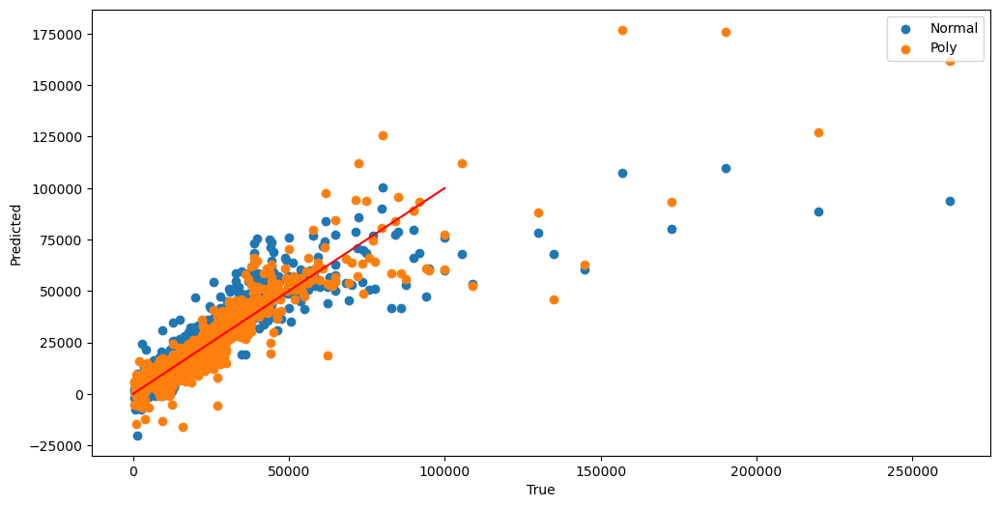

In [241]:
# Comparison of prediction accuracy of the two models
from sklearn.metrics import mean_absolute_error

y_pred_normal = normal_reg.predict(X_test_encoded)
y_pred_poly = poly_reg.predict(X_test_encoded)

mean_absolute_error(y_test, y_pred_normal), mean_absolute_error(y_test, y_pred_poly)

# Plotting the results
plt.figure(figsize=(12, 6))
plt.scatter(y_test, y_pred_normal, label='Normal')
plt.scatter(y_test, y_pred_poly, label='Poly')
plt.plot([0, 100000], [0, 100000], color='red')
plt.xlabel('True')
plt.ylabel('Predicted')
plt.legend()
plt.show()

In [242]:
# Mean Absolute Error of the two models
mean_absolute_error(y_test, y_pred_normal), mean_absolute_error(y_test, y_pred_poly)

(4435.163818091501, 3279.9325942828236)

In [243]:
# Getting the feature names of the polynomial regression model
poly_reg['poly'].get_feature_names_out()

array(['standard_make', 'standard_model', 'standard_colour', 'body_type',
       'vehicle_condition', 'crossover_car_and_van', 'fuel_type',
       'mileage', 'year_of_registration', 'price_category',
       'standard_make standard_model', 'standard_make standard_colour',
       'standard_make body_type', 'standard_make vehicle_condition',
       'standard_make crossover_car_and_van', 'standard_make fuel_type',
       'standard_make mileage', 'standard_make year_of_registration',
       'standard_make price_category', 'standard_model standard_colour',
       'standard_model body_type', 'standard_model vehicle_condition',
       'standard_model crossover_car_and_van', 'standard_model fuel_type',
       'standard_model mileage', 'standard_model year_of_registration',
       'standard_model price_category', 'standard_colour body_type',
       'standard_colour vehicle_condition',
       'standard_colour crossover_car_and_van',
       'standard_colour fuel_type', 'standard_colour mileage',
 

In [244]:
# Most importance features and their coefficients in the polynomial regression model
feature_importance = pd.DataFrame(
    {
        'Feature': poly_reg['poly'].get_feature_names_out(),
        'Coefficient': poly_reg['est'].coef_
    }
)

In [245]:
# Sorting the features by their coefficients
feature_importance.sort_values(by='Coefficient', ascending=False)

,Feature,Coefficient
8,year_of_registration,4.592468e+03
5,crossover_car_and_van,2.467034e+02
9,price_category,8.223470e+01
3,body_type,6.292368e+01
2,standard_colour,3.040323e+01
4,vehicle_condition,1.029693e+01
7,mileage,2.044245e+00
25,standard_model year_of_registration,8.565934e-02
45,crossover_car_and_van fuel_type,1.384246e-02
50,fuel_type year_of_registration,5.228553e-03


In [246]:
# Creating a dataset from the results of polynomial features
X_train_poly = poly_reg['poly'].transform(X_train_encoded)
X_test_poly = poly_reg['poly'].transform(X_test_encoded)

# Checking the shape of the dataset
X_train_poly.shape, X_test_poly.shape

((6027, 55), (2009, 55))

In [247]:
# Convert to DataFrame
X_train_poly = pd.DataFrame(X_train_poly, columns=poly_reg['poly'].get_feature_names_out())
X_test_poly = pd.DataFrame(X_test_poly, columns=poly_reg['poly'].get_feature_names_out())

<b>Observation(s):</b>

*  After applying the polynomial and interaction features, the performance of the model improved by almost 10 percent. Previously, the R squared value for test dataset of the linear regression without those features was 73 percent, which rose to 83 percent after applying those features.

* As a trade off of applying those features, several features were created which increased the dimensionality of the dataset from 10 features to 55 features and made the model more complex and harder to interpret.

* Coefficients were also calculated to discover the top features that impacts the performance of the model. According to the findings, the top most important feature is `year_of_registration` which has the highest coefficient of 4.592468e+03. The rest of the prominent features are `crossover_car_and_van`, `price_category`, `body_type`, and so on.

* A True vs Predicted plot of Normal and Polynomial regression clearly shows that both models displayed a general upward trend, meaning that as the true values increase, the predicted values also tend to increase. Additionally, both normal and polynomial regression generally follow the red line, indicating a reasonable fit for the low and mid-range true values. However, at higher prices, the data points are more scattered, leading to less reliable predictions for higher priced cars.

## <b>3. Feature Selection and Dimensionality Reduction</b>

In the next phase, we will apply feature selection and dimensionality reduction techniques to our dataset. Feature selection involves pinpointing and choosing a subset of input features that have the most significant impact on the target variable. Our goal is to enhance the model's performance, mitigate overfitting, boost interpretability, and reduce the time required to train the model. On the other hand, dimensionality reduction, as implied by its name, is the process of decreasing the number of input features in the dataset. This process also involves transforming features into a lower-dimensional space, thereby creating new combinations of attributes within the dataset.

### <b>a. Select K-Best:</b>

To implement the Select K-Best method, we will establish a pipeline. This pipeline will cycle through all the features, apply the Select K-Best method and linear regression, and store the scores of the training and testing datasets in a 'results' variable. The optimal feature combination is then identified from the 'results' variable and visualized using a line plot. The names of the best features will be determined, and the optimal results will be used to fit a linear regression model. This process will result in a transformed dataset that should exhibit enhanced performance.

In [248]:
# Iterate over k to find the best value of score
results = []
for k in range(1, 55):
    regr_bestk = Pipeline(
        steps=[
            ("featsel", SelectKBest(f_regression, k=k)),
            ("regr", LinearRegression())
        ]
    )
    regr_bestk.fit(X_train_poly, y_train)
    results.append({
        'k': k,
        'train_score': regr_bestk.score(X_train_poly, y_train),
        'test_score': regr_bestk.score(X_test_poly, y_test)
    })


In [249]:
# Convert to DataFrame
results = pd.DataFrame(results)
results.sort_values(by='test_score', ascending=False).head(5)


,k,train_score,test_score
44,45,0.867894,0.842779
45,46,0.867914,0.842769
46,47,0.868313,0.842720
51,52,0.868442,0.842603
49,50,0.868372,0.842349


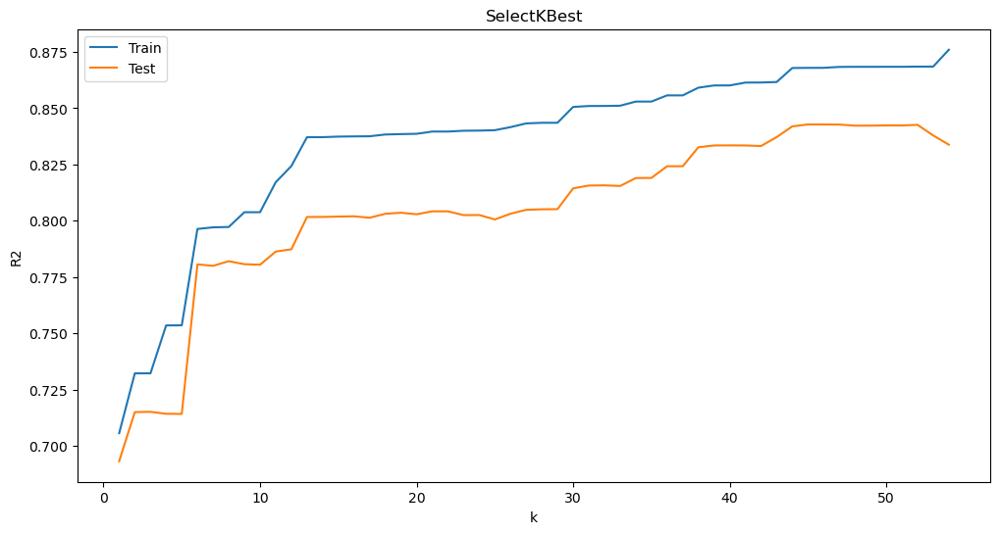

In [250]:
# Plotting the results
plt.figure(figsize=(12, 6))
plt.plot(results['k'], results['train_score'], label='Train')
plt.plot(results['k'], results['test_score'], label='Test')
plt.xlabel('k')
plt.ylabel('R2')
plt.title('SelectKBest')
plt.legend()
plt.show()

In [251]:
# Compare all the test values to find the best value of k and store it in a variable
best_k = results.loc[results['test_score'].idxmax(), 'k']
best_k

45

In [252]:
# Creating a pipeline for the best k value
regr_bestk = Pipeline(
    steps=[
        ("featsel", SelectKBest(f_regression, k=best_k)),
        ("regr", LinearRegression())
    ]
)

In [253]:
# Fitting the best k value pipeline
regr_bestk.fit(X_train_poly, y_train)

Pipeline(steps=[('featsel',
                 SelectKBest(k=45,
                             score_func=<function f_regression at 0x000002324EAC20C0>)),
                ('regr', LinearRegression())])

In [254]:
# Cross validating the best k value pipeline
regr_bestk['featsel'].get_feature_names_out()

array(['standard_make', 'standard_model', 'body_type',
       'vehicle_condition', 'mileage', 'year_of_registration',
       'price_category', 'standard_make standard_model',
       'standard_make standard_colour', 'standard_make body_type',
       'standard_make vehicle_condition',
       'standard_make crossover_car_and_van', 'standard_make fuel_type',
       'standard_make year_of_registration',
       'standard_make price_category', 'standard_model standard_colour',
       'standard_model body_type', 'standard_model vehicle_condition',
       'standard_model crossover_car_and_van', 'standard_model fuel_type',
       'standard_model mileage', 'standard_model year_of_registration',
       'standard_model price_category', 'standard_colour body_type',
       'standard_colour vehicle_condition', 'standard_colour fuel_type',
       'standard_colour mileage', 'standard_colour price_category',
       'body_type vehicle_condition', 'body_type crossover_car_and_van',
       'body_type fuel_t

In [255]:
# Scores assigned to each selected feature by the selectkbest algorthm and name of the features of the top 10 features
feature_importance = pd.DataFrame(
    {
        'Feature': X_train_poly.columns,
        'Score': regr_bestk['featsel'].scores_
    }
)

In [256]:
# Sorting the features by their scores
feature_importance.sort_values(by='Score', ascending=False).head(10)

,Feature,Score
26,standard_model price_category,14449.297962
18,standard_make price_category,14062.101117
54,year_of_registration price_category,9192.996732
9,price_category,9191.247344
48,crossover_car_and_van price_category,9141.002248
44,vehicle_condition price_category,9061.788979
33,standard_colour price_category,9014.674050
39,body_type price_category,8741.142722
10,standard_make standard_model,8457.948041
51,fuel_type price_category,6629.571939


In [257]:
# Number of features selected by the selectkbest algorithm
len(regr_bestk['featsel'].get_feature_names_out())

45

In [258]:
# R squared value of the best k value pipeline
regr_bestk.score(X_train_poly, y_train), regr_bestk.score(X_test_poly, y_test)

(0.8678938514941965, 0.8427793301911557)

In [259]:
# Mean Absolute Error
mean_absolute_error(y_train, regr_bestk.predict(X_train_poly)), mean_absolute_error(y_test, regr_bestk.predict(X_test_poly))

(3213.692630481679, 3224.8081290375944)

In [260]:
# Create the same dataset with the selected features
X_train_bestk = regr_bestk['featsel'].transform(X_train_poly)
X_test_bestk = regr_bestk['featsel'].transform(X_test_poly)

X_train_bestk.shape, X_test_bestk.shape

((6027, 45), (2009, 45))

<b>Observation(s):</b>

* Before the method was applied, the dataset consisted of 55 features. The algorithm, however, narrowed down these features to the 45 most pertinent to the target variable.

* In terms of dataset performance, the training and testing datasets scored approximately 87% and 84% respectively. This indicates that the datasets continue to perform well, even with the reduced and transformed set of features.

* As per the feature importance scores, it's noteworthy that many of the significant features were interactions between other features and `price_category`. This strongly suggests that the price category of the vehicle is a crucial factor in predicting the car's price.

### <b>b. Recursive Feature Elimination</b>

To implement Recursive Feature Elimination, a pipeline will be created which RECV will use Linear Regression model to evaluate feature importance, removes one feature at a time (step=1) and uses 5-fold cross-validation to select the optimal number of features for the target variable. After feature selection, Linear Regression will be fitted on the selected features. 

In [261]:
# Create a pipeline with RFECV
regr_rfecv = Pipeline(
    steps=[
        ("featsel", RFECV(LinearRegression(), step=1, cv=5)),
        ("regr", LinearRegression())
    ]
)

In [262]:
# Fit the pipeline
regr_rfecv.fit(X_train_poly, y_train)

Pipeline(steps=[('featsel', RFECV(cv=5, estimator=LinearRegression())),
                ('regr', LinearRegression())])

In [263]:
# Name of the features selected by the RFECV algorithm
regr_rfecv['featsel'].get_feature_names_out()

array(['standard_make', 'standard_model', 'standard_colour', 'body_type',
       'vehicle_condition', 'crossover_car_and_van', 'fuel_type',
       'mileage', 'year_of_registration', 'price_category',
       'standard_make standard_model', 'standard_make standard_colour',
       'standard_make crossover_car_and_van',
       'standard_make year_of_registration', 'standard_model body_type',
       'standard_model crossover_car_and_van', 'standard_model fuel_type',
       'standard_model year_of_registration',
       'standard_colour crossover_car_and_van',
       'standard_colour year_of_registration',
       'body_type crossover_car_and_van',
       'body_type year_of_registration',
       'vehicle_condition crossover_car_and_van',
       'vehicle_condition mileage',
       'vehicle_condition year_of_registration',
       'vehicle_condition price_category',
       'crossover_car_and_van fuel_type',
       'crossover_car_and_van year_of_registration',
       'crossover_car_and_van price_c

In [264]:
# Number of features selected by the RFECV algorithm
len(regr_rfecv['featsel'].get_feature_names_out())

32

In [265]:
# Scores of the features
feature_importance = pd.DataFrame(
    {
        'Feature': X_train_poly.columns,
        'Score': regr_rfecv['featsel'].ranking_
    }
)

In [266]:
# Sorting the features by their scores
feature_importance.sort_values(by='Score', ascending=False).head(10).head(5)

,Feature,Score
16,standard_make mileage,24
31,standard_colour mileage,23
26,standard_model price_category,22
19,standard_model standard_colour,21
34,body_type vehicle_condition,20


In [267]:
# Get Feature Names Out and replace with original names
regr_rfecv['featsel'].get_support()

# Get the names of the features
X_train_poly.columns[regr_rfecv['featsel'].get_support()]

# Score
regr_rfecv.score(X_train_poly, y_train), regr_rfecv.score(X_test_poly, y_test)

(0.8589295884286212, 0.8282427214840238)

In [319]:
# Mean Absolute Error
mean_absolute_error(y_train, regr_rfecv.predict(X_train_poly)), mean_absolute_error(y_test, regr_rfecv.predict(X_test_poly))

(3226.4253289222543, 3241.312018251868)

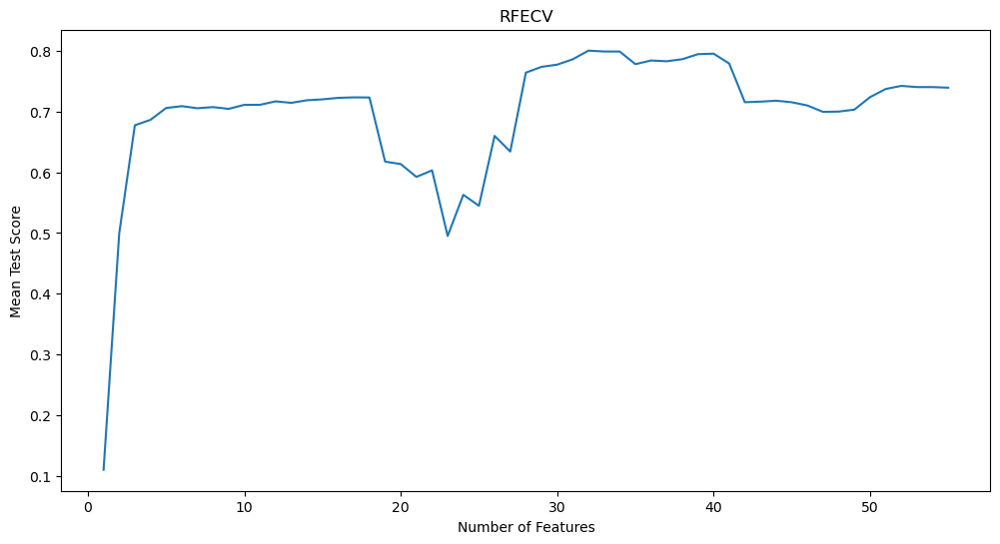

In [268]:
# Plot the number of features vs. mean test score and mean train score
plt.figure(figsize=(12, 6))
plt.plot(range(1, len(regr_rfecv['featsel'].cv_results_['mean_test_score']) + 1), regr_rfecv['featsel'].cv_results_['mean_test_score'])
plt.xlabel('Number of Features')
plt.ylabel('Mean Test Score')
plt.title('RFECV')
plt.show()

In [269]:
# Create the same dataset with the selected features
X_train_rfecv = regr_rfecv['featsel'].transform(X_train_poly)
X_test_rfecv = regr_rfecv['featsel'].transform(X_test_poly)

# Checking the shape of the dataset
X_train_rfecv.shape, X_test_rfecv.shape

((6027, 32), (2009, 32))

In [270]:
# Convert to DataFrame
X_train_rfecv = pd.DataFrame(X_train_rfecv, columns=X_train_poly.columns[regr_rfecv['featsel'].get_support()])
X_test_rfecv = pd.DataFrame(X_test_rfecv, columns=X_test_poly.columns[regr_rfecv['featsel'].get_support()])
X_train_rfecv.shape, X_test_rfecv.shape

((6027, 32), (2009, 32))

<b> Observation(s):</b>

* Implementation of RFECV reduced 55 features to 32 features only. This reduction can potentially lead to a much more simpler, more easier to interpret model, that's less prone to overfitting.

* The top three featues selected based on their scores were `standard_make mileage`, `standard_colour mileage`, and `standard_model price category`. Interesting to note is that most of the important featurres ae interactions between other features. This suggests that combination of different factor display a significant role in predicting the target variable.

* The model's performance on the training dataset is approximately 85.9% and on the test set is approximately 82.8%. These scores indicate that the model is performing reasonable well on the unseen data.



### <b>c. Sequential Feature Selection (SFS) (Forward/Backward)</b>

In the process of Sequential Feature Selection (SFS), a pipeline will be established that will include two stages: feature selection via SFS and the application of a linear regression model. 

In the initial stage, the 'Sequential Feature Selector' function will carry out a sequential feature selection, recognized as a type of greedy search algorithm for feature selection. It will start with no features and will progressively add them one by one (direction = 'forward') until a predetermined stopping condition is met. In this scenario, Linear Regression will be utilized to assess the importance of features, and a 5-fold cross-validation will be employed to determine the optimal number of features. Furthermore, the n_features_to_select parameter will be set to 'auto', enabling the automatic selection of the number of features that yield the highest cross-validation scores.

Once the feature selection stage is completed, a linear regression model will be fitted to the selected features. This represents a linear method for modeling the relationship between a dependent variable and one or more independent variables.

In [272]:
# Create a pipeline with Sequential Feature Selector
regr_sfs = Pipeline(
    steps=[
        ("featsel", SequentialFeatureSelector(LinearRegression(), n_features_to_select="auto", direction="forward", cv=5)),
        ("regr", LinearRegression())
    ]
)

In [273]:
# Get Feature Names Out and replace with original names
regr_sfs.fit(X_train_poly, y_train)

Pipeline(steps=[('featsel',
                 SequentialFeatureSelector(estimator=LinearRegression(),
                                           n_features_to_select='auto')),
                ('regr', LinearRegression())])

In [275]:
# Number of Features
len(X_train_poly.columns[regr_sfs['featsel'].get_support()])

27

In [276]:
# Names of the features selected by the SFS algorithm
regr_sfs['featsel'].get_support()
X_train_poly.columns[regr_sfs['featsel'].get_support()]
X_test_poly.columns[regr_sfs['featsel'].get_support()]

Index(['standard_make', 'standard_model', 'vehicle_condition', 'fuel_type',
       'price_category', 'standard_make standard_model',
       'standard_make standard_colour', 'standard_make body_type',
       'standard_make vehicle_condition', 'standard_make fuel_type',
       'standard_make price_category', 'standard_model body_type',
       'standard_model vehicle_condition', 'standard_model mileage',
       'standard_model year_of_registration', 'standard_model price_category',
       'standard_colour body_type', 'standard_colour vehicle_condition',
       'standard_colour crossover_car_and_van',
       'body_type crossover_car_and_van', 'body_type mileage',
       'body_type price_category', 'vehicle_condition price_category',
       'fuel_type mileage', 'mileage year_of_registration',
       'mileage price_category', 'year_of_registration price_category'],
      dtype='object')

In [277]:
# Create the same dataset with the selected features
X_train_sfs = regr_sfs['featsel'].transform(X_train_poly)
X_test_sfs = regr_sfs['featsel'].transform(X_test_poly)

# Convert to DataFrame
X_train_sfs = pd.DataFrame(X_train_sfs, columns=X_train_poly.columns[regr_sfs['featsel'].get_support()])
X_test_sfs = pd.DataFrame(X_test_sfs, columns=X_test_poly.columns[regr_sfs['featsel'].get_support()])

# Shape of the dataset
X_train_sfs.shape, X_test_sfs.shape

((6027, 27), (2009, 27))

In [278]:
# Mean Train and Test Score
regr_sfs.score(X_train_poly, y_train), regr_sfs.score(X_test_poly, y_test)

(0.8743768532061805, 0.8402731845536953)

In [279]:
# Mean Absolute Error
mean_absolute_error(y_train, regr_sfs.predict(X_train_poly)), mean_absolute_error(y_test, regr_sfs.predict(X_test_poly))

(3207.2551124989354, 3291.26308926624)

<b>Observation(s):</b>

* The Sequential Feature Selector (SFS) algorithm reduced the features from 55 to 27 features out of the original dataset. This reduction in feature count can potentially lead to a simpler, more interpretable model that is less prone to overfitting.

* The algorithm does not have built-in feature to provide feature important scores like other methods mentioned above as it is a wrapper method that evaluates subsets of features based on the specified ML algortihm. However, it is interesting to note that many of the selected important features are interactions between other features. This suggests that it plays a vital role in predicting the target variable.

* The model's performance ont the transformed training and testing dataset are 87.4% and 84.0% respectively. These scores suggest that the model is performing reasonable well when it comes to unseen data.

In [280]:
# Train and Test scores of SelectKBest, RFECV, Sequential Feature Selector with their names and number of features selected in each case
results = {
    'SelectKBest': {
        'Train Score': regr_bestk.score(X_train_poly, y_train),
        'Test Score': regr_bestk.score(X_test_poly, y_test),
        'Number of Features': 45
    },
    'RFECV': {
        'Train Score': regr_rfecv.score(X_train_poly, y_train),
        'Test Score': regr_rfecv.score(X_test_poly, y_test),
        'Number of Features': len(X_train_poly.columns[regr_rfecv['featsel'].get_support()])
    },
    'Sequential Feature Selector': {
        'Train Score': regr_sfs.score(X_train_poly, y_train),
        'Test Score': regr_sfs.score(X_test_poly, y_test),
        'Number of Features': len(X_train_poly.columns[regr_sfs['featsel'].get_support()])
    }
}

results

{'SelectKBest': {'Train Score': 0.8678938514941965,
  'Test Score': 0.8427793301911557,
  'Number of Features': 45},
 'RFECV': {'Train Score': 0.8589295884286212,
  'Test Score': 0.8282427214840238,
  'Number of Features': 32},
 'Sequential Feature Selector': {'Train Score': 0.8743768532061805,
  'Test Score': 0.8402731845536953,
  'Number of Features': 27}}

In [281]:
# Mean Absolute Error of SelectKBest, RFECV, Sequential Feature Selector
mae = {
    'SelectKBest': {
        'Train': mean_absolute_error(y_train, regr_bestk.predict(X_train_poly)),
        'Test': mean_absolute_error(y_test, regr_bestk.predict(X_test_poly))
    },
    'RFECV': {
        'Train': mean_absolute_error(y_train, regr_rfecv.predict(X_train_poly)),
        'Test': mean_absolute_error(y_test, regr_rfecv.predict(X_test_poly))
    },
    'Sequential Feature Selector': {
        'Train': mean_absolute_error(y_train, regr_sfs.predict(X_train_poly)),
        'Test': mean_absolute_error(y_test, regr_sfs.predict(X_test_poly))
    }
}

mae

{'SelectKBest': {'Train': 3213.692630481679, 'Test': 3224.8081290375944},
 'RFECV': {'Train': 3226.4253289222543, 'Test': 3241.312018251868},
 'Sequential Feature Selector': {'Train': 3207.2551124989354,
  'Test': 3291.26308926624}}

<b>Selection of Appropriate Automatic Feature Selection Algorithm:</b>

1. <b>SelectKBest:</b> This algorithm has the highest training score (0.867) and uses the most features (45). However, its test score (0.842) is lower than that of Sequential Feature Selector. Moreover, Mean Absolute Error (3294.04) is the highest among the three methods.

2. <b>RFECV:</b> This method has the lowest traning score (0.859) with a moderate number of features (32). Its test score (0.828) is the lowest among the three methods, but its test MAE (3241.31) is the lowest when we compared with the other two methods, indicating the best generalizatoin performance on unseen data.

3. <b>SFS:</b> This method has a slightly lower training score (0.874) than SelectKBest but uses fewer features (27). Its test score (0.840) is the highest among the three methods, indicating the best performance when it comes to predicting unseen data. Its test MAE (3291.26) is slightly lower than of SelectkBest but higher than that of RFECV.

Based on these results, Sequential Feature Selection (SFS) was chosen because the primary purpose was to target a method with higher test score. Moreover, it achieves this score with the least number of features, indicating a good balance between model complexity and performance.

### <b>c. Dimensionality Reduction Using PCA</b>

To implement PCA, a loop iterates over all the features in the dataset. For each iteration, a PCA model will be created and fitted to the training data, and the total variance explained by that number of components will also be calculated. This information will be printed, and if the explained variance is the highest encountered so far, it will be updated as the best number of components and highest explained variance. After the loop, the explained variance for each number of components will be plotted, aiding in visualizing how the total variance is explained as more components are added.

The objective of this step is to select a number of components that explain the majority of the variance without overly complicating the model.

n_components=1, explained variance=0.49022348023830353, train score=0.10793074305719874, test score=0.12710263149048096, train MAE=9468.765012307396, test MAE=9382.764619200223
n_components=2, explained variance=0.86462201473101, train score=0.7602156647778884, test score=0.7708955798077177, train MAE=3909.1198064954615, test MAE=3841.352818218742
n_components=3, explained variance=0.9053663323008574, train score=0.7795188879780623, test score=0.7792184425444391, train MAE=4184.288399392927, test MAE=4146.810914042529
n_components=4, explained variance=0.9348274374867909, train score=0.7925003938892395, test score=0.7676585759953106, train MAE=4148.20363532728, test MAE=4154.317877027217
n_components=5, explained variance=0.9548723624123588, train score=0.8079011893573967, test score=0.7942580898747257, train MAE=3838.852307494164, test MAE=3877.695221132844
n_components=6, explained variance=0.9713751610049249, train score=0.8094513462582174, test score=0.8007429153317301, train MAE=3

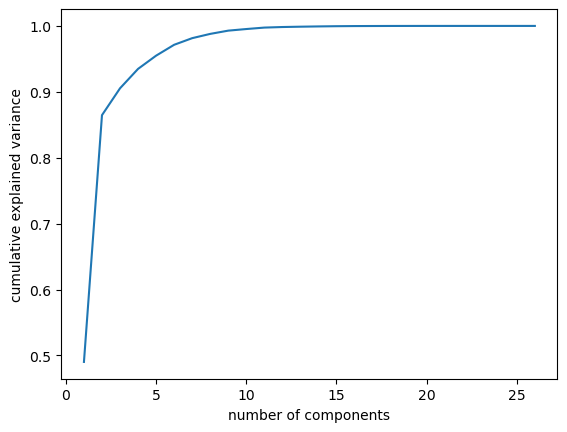

In [282]:
from sklearn.metrics import mean_absolute_error

# Initiating the PCA
n_comp = 27
best_n = None
best_explained_variance = 0
explained_variances = []
best_train_score = 0
best_test_score = 0
best_train_mae = float('inf')
best_test_mae = float('inf')

# Looping through the number of components
for n in range(1, n_comp):
    pca = PCA(n_components=n)
    pca.fit(X_train_sfs)
    
    # Transforming the data
    X_train_transformed = pca.transform(X_train_sfs)
    X_test_transformed = pca.transform(X_test_sfs)
    
    # Fitting the linear regression model
    lr = LinearRegression()
    lr.fit(X_train_transformed, y_train)
    
    # Scores
    train_score = lr.score(X_train_transformed, y_train)
    test_score = lr.score(X_test_transformed, y_test)
    
    # Mean Absolute Errors
    train_mae = mean_absolute_error(y_train, lr.predict(X_train_transformed))
    test_mae = mean_absolute_error(y_test, lr.predict(X_test_transformed))
    
    # Explained variance
    explained_variance = sum(pca.explained_variance_ratio_)
    explained_variances.append(explained_variance)
    
    # Print the results
    print(f'n_components={n}, explained variance={explained_variance}, train score={train_score}, test score={test_score}, train MAE={train_mae}, test MAE={test_mae}')
    
    # Update the best values
    if explained_variance > best_explained_variance:
        best_explained_variance = explained_variance
        best_n = n
        best_train_score = train_score
        best_test_score = test_score
        best_train_mae = train_mae
        best_test_mae = test_mae

# Best n_components and explained variance
print(f'Best n_components={best_n}, with explained variance={best_explained_variance}, best train score={best_train_score}, best test score={best_test_score}, best train MAE={best_train_mae}, best test MAE={best_test_mae}')

# Plot the cumulative explained variances
plt.plot(range(1, n_comp), explained_variances)
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

In [283]:
# Declaring the number of components
n_c = 15

# Fit PCA on the training set
pca = PCA(n_components=n_c)
pca.fit(X_train_sfs)

# Transform both the training and test sets
X_train_pca = pca.transform(X_train_sfs)
X_test_pca = pca.transform(X_test_sfs)

# Convert the transformed data back to dataframes
X_train_pca_df = pd.DataFrame(X_train_pca, columns=[f'PC{i+1}' for i in range(n_c)])
X_test_pca_df = pd.DataFrame(X_test_pca, columns=[f'PC{i+1}' for i in range(n_c)])

In [284]:
# Include feature names and values in the table
loadings = pca.components_
loadings_df = pd.DataFrame(loadings, columns=X_train_sfs.columns)
loadings_df.index = [f'PC{i+1}' for i in range(n_c)]
loadings_df

,standard_make,standard_model,vehicle_condition,fuel_type,price_category,standard_make standard_model,standard_make standard_colour,standard_make body_type,standard_make vehicle_condition,standard_make fuel_type,...,standard_colour vehicle_condition,standard_colour crossover_car_and_van,body_type crossover_car_and_van,body_type mileage,body_type price_category,vehicle_condition price_category,fuel_type mileage,mileage year_of_registration,mileage price_category,year_of_registration price_category
PC1,8.804879e-07,4.585119e-07,-1.399755e-06,-1.830510e-07,-4.224627e-06,0.018996,0.013583,0.032437,-0.008132,0.011527,...,-0.025737,-0.001667,0.016967,0.586731,-0.071756,-0.101432,0.504553,0.061006,0.302398,-0.008556
PC2,6.527678e-06,5.134591e-06,2.566534e-07,3.151582e-07,1.388763e-05,0.279649,0.119222,0.205757,0.112115,0.112543,...,0.009684,0.005546,0.057648,0.039502,0.371110,0.231661,-0.055539,-0.007510,0.250403,0.028004
PC3,-5.517866e-06,-2.771869e-06,-2.345446e-06,2.944507e-07,5.967583e-06,-0.176707,-0.097333,-0.282476,-0.136559,-0.084796,...,-0.046195,-0.005292,-0.181963,-0.475277,0.018782,0.017073,0.166002,0.016229,0.679167,0.011993
PC4,9.757657e-06,7.321446e-07,-1.677845e-06,-3.174203e-07,-1.145200e-05,0.392905,0.164396,0.040155,0.143746,0.152556,...,-0.034720,-0.006331,-0.218642,-0.345234,-0.398353,-0.216779,0.278532,0.033133,-0.272915,-0.023105
PC5,8.653417e-06,4.233952e-06,-4.003393e-06,-2.107625e-06,-1.310787e-05,0.259703,0.162819,0.252348,0.063921,0.103950,...,-0.057800,0.012226,0.083939,-0.051963,-0.229404,-0.340331,-0.545979,-0.062081,0.462864,-0.026538
PC6,-1.410710e-06,1.041415e-05,1.097672e-05,1.845219e-06,3.796100e-06,0.074572,-0.006122,-0.126122,0.160768,0.009478,...,0.209839,0.020128,-0.022527,-0.268262,-0.018731,0.368593,-0.135705,-0.016992,-0.125256,0.007703
PC7,9.729450e-06,-6.543825e-06,1.531127e-05,3.378605e-06,1.463701e-06,-0.096996,0.194947,0.141783,0.415454,0.227471,...,0.303237,0.037832,-0.030629,0.042412,-0.091517,0.440967,0.148416,0.009209,0.233662,0.002911
PC8,-4.836143e-06,-2.021590e-06,7.425070e-06,-3.330344e-06,1.791917e-07,0.055220,-0.110901,-0.295545,0.030824,-0.144354,...,0.097337,-0.031281,-0.223351,0.448390,-0.443323,0.164793,-0.402835,-0.028234,0.058151,0.000339
PC9,-3.350760e-06,7.938175e-06,1.694849e-06,3.207984e-06,-1.464072e-05,0.339801,-0.028700,-0.013810,0.046633,0.005474,...,0.044493,0.011771,0.070137,0.007452,-0.277616,-0.118770,0.341386,0.022934,0.132488,-0.029545
PC10,-1.963567e-05,-3.217482e-06,1.285534e-05,-9.833107e-06,-1.916668e-05,0.028508,-0.090002,-0.098065,-0.170020,-0.520678,...,0.470625,0.246963,0.134231,-0.104308,-0.174698,-0.062884,0.059635,0.022982,0.035320,-0.038808


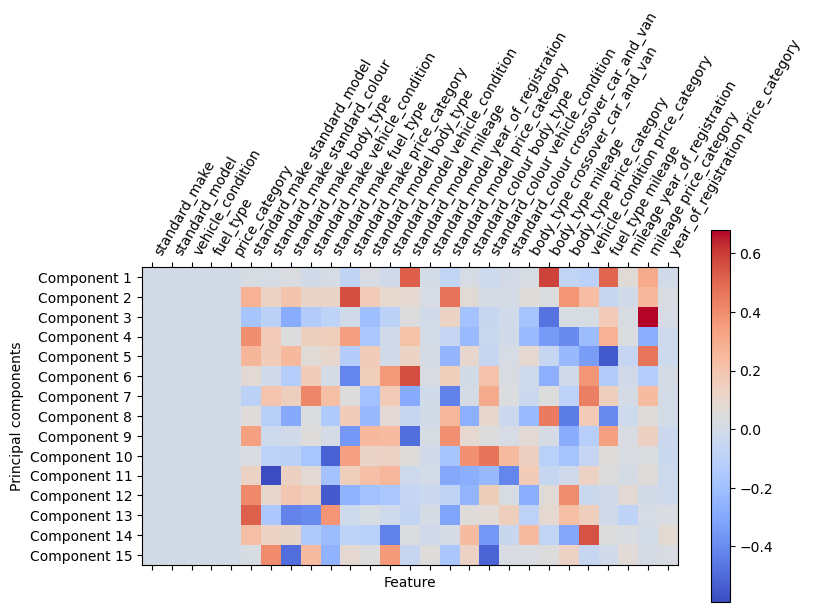

In [285]:
# Plot the components and the features in a heatmap
plt.matshow(pca.components_, cmap='coolwarm')
plt.yticks([i for i in range(n_c)], [f"Component {i+1}" for i in range(n_c)])
plt.colorbar()
plt.xticks(range(len(X_train_sfs.columns)), 
           X_train_sfs.columns, rotation=60, ha='left')
plt.xlabel("Feature")
plt.ylabel("Principal components")
plt.show()

In [286]:
# Create a pipeline with Linear Regression for x_train_pca_df, y_train, x_test_pca_df, y_test
regr_pca_test = Pipeline(
    steps=[
        ("regr", LinearRegression())
    ]
)

In [287]:
# Fit the pipeline
regr_pca_test.fit(X_train_pca_df, y_train)

Pipeline(steps=[('regr', LinearRegression())])

In [288]:
# Score
regr_pca_test.score(X_train_pca_df, y_train), regr_pca_test.score(X_test_pca_df, y_test)

(0.8604967078028182, 0.8252878458097381)

In [289]:
# Mean Absolute Error
mean_absolute_error(y_train, regr_pca_test.predict(X_train_pca_df)), mean_absolute_error(y_test, regr_pca_test.predict(X_test_pca_df))

(3589.0313324931685, 3667.8586383559596)

<b>Observation(s):</b>

After having observed the models with different numbers of components, the model of 15 components is chosen because this model had provided a good balance between simplicity and accuracy. There were 3 major reasons behind this decision:

* Although this model was more complex than a simpler model with fewer components, it had captured almost all of the variance in the dataset (99.9%). This meant that the model with 15 components had been able to represent the data more accurately with only a moderate increase in complexity.

* The model with 15 components had achieved a much higher test score of around 83%. Above that number of components, a higher level of accuracy was not observed. In fact, it just increased gradually.

* In terms of absolute error values, this model had also performed better than the other ones because the error values had not improved much after increasing the number of components to more than 15, but also the error values had increased much quicker and higher if the number of components were decreased. This further supported the choice of the model with 15 components, as it suggested that the model's predictions were much closer to the actual values.

<b>Contributions of Features on Principal Components:</b>

<b>Component 1: 'Mileage and Vehicle Condition Impact':</b> 

* <b>Positive Loadings (High Impact):</b> body_type mileage: 0.586731, vehicle_condition mileage: 0.504553, standard_make standard_model: 0.018996
* <b>Negative Loadings (High Impact):</b> standard_make price_category: -0.4, body_type price_category: -0.101432, mileage: -0.071756
* This component emphasizes the noteworthy positive impact of mileage when combined with body type and vehicle condition. This suggests that specific body types and well-maintained vehicles with higher mileage can still fetch a higher price. On the other hand, certain price categories and mileage alone can negatively impact the price.

<b>Component 2: 'Fuel Type and Price Category Influence':</b> 

* <b>Positive Loadings (High Impact):</b> vehicle_condition price_category: 0.371110, fuel_type mileage: 0.231661, standard_make standard_model: 0.279649
* <b>Negative Loadings (High Impact):</b> body_type mileage: -0.4, body_type price_category: -0.055539, mileage: -0.007510
* This component highlights the positive correlation of fuel type and vehicle condition with price categories, indicating that well-maintained vehicles and effecient fuel types positive impact the price of the car. However, higher mileage and certain body types tend to have a negative effect on price.

<b>Component 3: 'Negative Vehicle Condition and Mileage Effect':</b> 
* <b>Positive Loadings (High Impact):</b> standard_make standard_model: 0.136559, mileage price_category: 0.679167
* <b>Negative Loadings (High Impact):</b> standard_make body_type: -0.282476, vehicle_condition: -0.475277, body_type: -0.181963
* This component captures the negative impact of poor vehicle condition and less desirable body type on the car's price. High mileage within certain price categories can still maintain value, but poor vehicle condition significantly detracts from the price.

<b>Component 4: 'Body Type and Fuel Type Interactions':</b> 

* <b>Positive Loadings (High Impact):</b> body_type mileage: 0.345234, standard_make standard_model: 0.392905
* <b>Negative Loadings (High Impact):</b> body_type price_category: -0.398353, vehicle_condition: -0.216779
* This component shows the positive relationship between specific body types with mileage and desirable makes/models. On the other hand, certain price categories and poor vehicle conditions negative effect the car's price.

<b>Component 5: 'Mileage and Vehicle Condition Trade-offs':</b> 

* <b>Positive Loadings (High Impact):</b> body_type mileage: 0.462864, standard_make standard_model: 0.259703
* <b>Negative Loadings (High Impact):</b> mileage: -0.340331, body_type price_category: -0.545979, vehicle_condition: -0.22940
* This component highlights the positive effect of mileage when joined with certain body types, makes, and models, but higher mileage and less favorable body type/price category combinations reduce car's value significantly.

<b>Component 6: 'Positive Mileage and Fuel Type Effects':</b> 

* <b>Positive Loadings (High Impact):</b> body_type price_category: 0.368593, standard_make standard_model: 0.074572
* <b>Negative Loadings (High Impact):</b> mileage: -0.268262, body_type: -0.022527
* Positive impacts of certain body types and price categories are evident, while high mileage less favourable body type negative effect from the overall price.

<b>Component 7: 'Body Type and Fuel Type Impact':</b> 

* <b>Positive Loadings (High Impact):</b> fuel_type mileage: 0.440967, standard_make vehicle_condition: 0.415454
* <b>Negative Loadings (High Impact):</b> body_type price_category: -0.091517, mileage: -0.042412
* Highlights the importance of fuel type and vehicle condition, mainly in maintaining higher prices despite higher mileage. Certain body type and price category combinations still negatively affect the price.

<b>Component 8: 'Negative Impact of Body Type':</b> 

* <b>Positive Loadings (High Impact):</b> standard_make body_type: 0.055220 
* <b>Negative Loadings (High Impact):</b> body_type price_category: -0.443323, mileage: -0.402835
* This component highlights the negative impact of certain body types on price, with negative correlations evident in certain price categories and higher mileage.

<b>Component 9: 'Positive Impact of Make and Model':</b> 

* <b>Positive Loadings (High Impact):</b> standard_make standard_model: 0.339801
* <b>Negative Loadings (High Impact):</b> mileage: -0.277616, vehicle_condition: -0.118770
* Highlights the positive effect of desirable makes/models, while higher mileage and poorer vehicle conditions negatively effect car prices.

<b>Component 10: 'Complex Interactions in Mileage and Condition':</b> 

* <b>Positive Loadings (High Impact):</b> standard_make standard_model: 0.028508, vehicle_condition mileage: 0.470625
* <b>Negative Loadings (High Impact):</b> standard_make body_type: -0.520678, mileage: -0.174698
* This component captures complex interactions where good vehicle condition significantly decreases negative effect of high mileage, but certain body types detract from the value.

<b>Component 11: 'Negative Fuel Type and Condition Effect':</b> 

* <b>Positive Loadings (High Impact):</b> vehicle_condition mileage: 0.125226
* <b>Negative Loadings (High Impact):</b> fuel_type: -0.589403, body_type price_category: -0.418802
* Highlights the negative impact of certain fuel types and body type/price category combinations, with vehicle conditon/mileage combination having a less pronounced effect.

<b>Component 12: 'Negative Impact of Mileage and Condition':</b> 

* <b>Positive Loadings (High Impact):</b> standard_make standard_model: 0.409837
* <b>Negative Loadings (High Impact):</b> body_type price_category: -0.399276, vehicle_condition: -0.039174
* Emphasizes the positive effect that make/model combinations have on price, with significant negative effects from certain body types/price category combinations and vehicle conditions.

<b>Component 13: 'Positive Mileage Effect':</b> 

* <b>Positive Loadings (High Impact):</b> mileage price_category: 0.518363
* <b>Negative Loadings (High Impact):</b> standard_make body_type: -0.422089, vehicle_condition: -0.092849
* This component shows a strong positive effect of mileage within specific price categories, while certain body types and poor vehicle conditions have negative impacts.

<b>Component 14: 'Positive Impact of Price Category':</b> 

* <b>Positive Loadings (High Impact):</b> mileage price_category: 0.551034, vehicle_condition price_category: 0.240526, standard_make: 0.225425
* <b>Negative Loadings (High Impact):</b> body_type price_category: -0.354648, standard_make body_type: -0.214221
* Highlights the positive effect of mileage in certain price categories, with negative effects from specific body type/price category combinations and vehicle condition.

<b>Component 15: 'Mixed Mileage and Condition Effects':</b> 

* <b>Positive Loadings (High Impact):</b> mileage price_category: 0.551034
* <b>Negative Loadings (High Impact):</b> body_type price_category: -0.303485, vehicle_condition: -0.071383
* This component gives emphasis on the mixes effects of mileage and vehicle condition on price, with strong positive impacts from desirable makes/models and negative effects from certain body type/price category combinations.

<b>Summary of Findings:</b> 

* <b>Mileage and vehicle condition</b> are critical factors when it comes to predicting price of the car, especially when interacting with body types and price categories to influence car prices.
* <b>Desirable makes and models</b> consistently show positive impacts on car prices.
* <b>Fuel type and specific body types</b> can both positively and negatively effect prices, depending on the combination with other factors.
* <b>Price categories</b> have varying effects, with certain categories maintaining their value despite high mileage and less favorable body types.


## <b>4. Model Building</b>

In the next step, a number of models is fitted and tuned, grid-search, ranking,and evaluation metrics is applied for choosing the most suitable algorithm for prediction of the vehicle's price.  

### <b>a. A Linear Model:</b>

A linear model is a statistical tool used in machine learning and data science for predicting a dependent variable based on the values of one or more independent variables. This model assumes a linear relationship between these variables. The objective of this model is to find the line that best fits the data points. For it's implitation, a pipeline is constructed using the Pipeline class to outline the steps for implementing the linear regression model. A parameter grid is also constructed to evaluate the impact of the `fit_intercept` parameter, which determines whether or not to compute the intercept for this model, on the model's performance. Finally, a 5-fold Grid Search CV is performed to identify the optimal model based on the parameters of training and testing scores, as well as mean absolute error values.

In [290]:
# Create a pipeline with Linear Regression
regr_pca = Pipeline(
    steps=[
        ("regr", LinearRegression())
    ]
)

# Create a parameter grid
param_grid = {
    "regr__fit_intercept": [True, False],
}

# Create a GridSearchCV object
grid_search = GridSearchCV(regr_pca, param_grid, cv=5, scoring='neg_mean_absolute_error')

# Fit the GridSearchCV object
grid_search.fit(X_train_pca_df, y_train)

# Get the best parameters
best_params = grid_search.best_params_
print("Best parameters: ", best_params)

# Get the best estimator
best_estimator = grid_search.best_estimator_

# Evaluate the model on the training data
train_score = best_estimator.score(X_train_pca_df, y_train)
print("Training score: ", train_score)

# Evaluate the model on the test data
test_score = best_estimator.score(X_test_pca_df, y_test)
print("Test score: ", test_score)

# Calculate the mean absolute error on the training data
train_mae = mean_absolute_error(y_train, best_estimator.predict(X_train_pca_df))
print("Training Mean Absolute Error: ", train_mae)

# Calculate the mean absolute error on the test data
test_mae = mean_absolute_error(y_test, best_estimator.predict(X_test_pca_df))
print("Test Mean Absolute Error: ", test_mae)

Best parameters:  {'regr__fit_intercept': True}
Training score:  0.8604967078028182
Test score:  0.8252878458097381
Training Mean Absolute Error:  3589.0313324931685
Test Mean Absolute Error:  3667.8586383559596


<b>Observation(s):</b>

Overall, the model seems to be working well because of the following three reasons:

* The best parameter for the `fit_intercept` for the model is True. This means that the model performs better when it calculates the intercept for the line of best fit.

* The training and testing scores (R^2) of 86% and 83% respectively suggests that the model fits the training data well, and also majority of the vaiance in the target variable can be explained by the features in the test set. The test score is slightly lower than the train score, but it is expected as models tend to perform slightly lower than the training datasets.

* The Mean Absolute Error (MAE) for the training and testing set is on average around 3589 and 3668 units away from the actual values in the test and training sets. 


### <b>b. Random Forest Regressor:</b>

A Random Forest model will be generated as part of this analysis. This is a supervised learning algorithm that can be used for both classification and regression tasks. As an ensemble method, it combines multiple machine learning models to make predictions. Specifically, it is a collection of decision trees, with each tree being slightly different from the others. When predicting target variables based on independent features, the model takes the average prediction from each individual tree to form its final prediction, thereby arriving at the most suitable outcome.

In [291]:
# Create a pipeline with Random Forest Regressor
rfr = Pipeline(
    steps=[
        ("regr", RandomForestRegressor())
    ]
)

# Create a parameter grid
param_grid = {
    "regr__n_estimators": [10, 50, 100],
    "regr__max_depth": [None, 10, 20],
}

# Create a GridSearchCV object
grid_search = GridSearchCV(rfr, param_grid, cv=5, scoring='neg_mean_absolute_error')

# Fit the GridSearchCV object
grid_search.fit(X_train_pca_df, y_train)

# Get the best parameters
best_params = grid_search.best_params_

# Get the best estimator
best_estimator = grid_search.best_estimator_

# Evaluate the model on the training data
train_score = best_estimator.score(X_train_pca_df, y_train)

# Evaluate the model on the test data
test_score = best_estimator.score(X_test_pca_df, y_test)

# Calculate the mean absolute error on the training data
train_mae = mean_absolute_error(y_train, best_estimator.predict(X_train_pca_df))

# Calculate the mean absolute error on the test data
test_mae = mean_absolute_error(y_test, best_estimator.predict(X_test_pca_df))

# Print the results
print("Best parameters: ", best_params)

print("Training score: ", train_score)

print("Test score: ", test_score)

print("Training Mean Absolute Error: ", train_mae)

print("Test Mean Absolute Error: ", test_mae)

Best parameters:  {'regr__max_depth': 20, 'regr__n_estimators': 50}
Training score:  0.9836697074444636
Test score:  0.8776077526418427
Training Mean Absolute Error:  897.9965988051356
Test Mean Absolute Error:  2379.1043940122486


<b>Observation(s):</b>

Overall, the Random Forest Regressor model demonstrated strong performance, as evidenced by the following results:

* The optimal parameters for the Random Forest Regressor model were determined to be max_depth=20 and n_estimators=50. This indicates that the trees within the model were permitted to grow at 20 levels, and that the ensemble was composed of 50 trees.

* The model achieved training and testing scores of 98% and 87%, respectively. These scores suggest that the model was highly effective in predicting vehicle prices within the given dataset.

* The Mean Absolute Errors (MAE) for the training and testing data were approximately 897.99 and 2379.10, respectively. The higher MAE on the testing data, compared to the training data, implies that the model's predictions were slightly less accurate when applied to unseen test data. However, the overall performance remains acceptable.

### <b>c. Boosted Tree Regressor:</b>

Another machine learning technique, Boosted Trees, or Gradient Boosting calculates which involves building multiple decision trees in a sequential manner. Each tree is trained to correct the mistakes by the previous tree, hence it is referred to as 'boosting'. The basic working of the algorithm is to add new models to the ensemble sequentially. After each round of training, the errors of the ensemble are computed, and the next model is trained to predict those errors which were calcukated previously. This process is repeated until a set number of trees are created, or no further improvements to the results can be made.



In [292]:
# Create a pipeline with Gradient Boosting Regressor
gb = Pipeline(
    steps=[
        ("gb", GradientBoostingRegressor())
    ]
)

# Create a parameter grid
param_grid = {
    "gb__n_estimators": [10, 50, 100],
    "gb__max_depth": [None, 10, 20],
}

# Create a GridSearchCV object
grid_search = GridSearchCV(gb, param_grid, cv=5, scoring='neg_mean_absolute_error')

# Fit the GridSearchCV object
grid_search.fit(X_train_pca_df, y_train)

# Get the best parameters
best_params = grid_search.best_params_

# Get the best estimator
best_estimator = grid_search.best_estimator_

# Evaluate the model on the training data
train_score = best_estimator.score(X_train_pca_df, y_train)

# Evaluate the model on the test data
test_score = best_estimator.score(X_test_pca_df, y_test)

# Calculate the mean absolute error on the training data
train_mae = mean_absolute_error(y_train, best_estimator.predict(X_train_pca_df))

# Calculate the mean absolute error on the test data
test_mae = mean_absolute_error(y_test, best_estimator.predict(X_test_pca_df))

# Print the results
print("Best parameters: ", best_params)

print("Training score: ", train_score)

print("Test score: ", test_score)

print("Training Mean Absolute Error: ", train_mae)

print("Test Mean Absolute Error: ", test_mae)



Best parameters:  {'gb__max_depth': 10, 'gb__n_estimators': 100}
Training score:  0.9990020769630863
Test score:  0.7279875771402702
Training Mean Absolute Error:  431.9350385746765
Test Mean Absolute Error:  2606.3758804515514


<b>Observation(s):</b>

Regarding the performance of the gradient boosting model, following observations were analysed:

* The optimal parameters for the model were determined to be gb__max_depth = 10 and gb__n_estimators = 100. This indicates that the trees within the model were sllowed to grow up to a depth of 10, and ensemble was composed of 100 trees.

* The model achieved an exceptionally high training score of 99.8%, suggesting that it was able to capture almost all of the variance in the training data. However, the test score was approximately 74%, which was significantly lower than the score of training data. This suggests that the model may be overfitting the training data, as its performance dropped on the unseen test data.

* The Mean Absolute Error for the training and testing data were 431.93 and 2606.37 respectively. This further suggests the observatio that the model's predictions on the test data were less accurate on the unseen data compared to the training data. Despite this, the model's overall performance is still relatively strong.

Random Forest Regressor emerged as the top single model, showcasing balanced accuracy, lower overfitting, and superior performance on unseen data compared to other models, based on train, test and MAE scores.

### <b>d. Average/Voter/Stacker Ensemble:</b>

Within the domain of Data Science and Machine Learning, an ensemble refers to the combination of several models, used collectively to enhance the precision of target variable predictions. The fundamental concept for ensemble methods is the assembly of several weaker models to construct a more well-performing learner. The aim behind the use of three models is to find out whether they can positively influence the prediction scores of both the training and testing data or not.

<b>ii) Average Regressor Ensemble:</b> This isn't a standard term in machine learning, but it typically refers to an ensemble method that averages the predictions of multiple models. This approach can help decrease prediction variance, as errors from one model may be offset by another model that performs better. In summary, it uses the predictive power of multiple models to enhance overall performance. Regarding the model's execution steps, a pipeline is constructed that includes the same models which were calculated differently. The weights parameter is set to [1,1,1], signifying that each model's prediction is equally weighted when calculating average to generate the final prediction. The following steps are similar to those of the voting regressor ensemble, where a 5-fold cross-validation is conducted, the results are fitted to the training data, and finally, the scores, mean absolute error, and predictions of each base model and the ensemble are plotted against the actual values for visual comparison.

Training score:  0.9609374683939869
Test score:  0.8852113310740002
Training Mean Absolute Error:  2025.9790101961771
Test Mean Absolute Error:  2575.785901371833


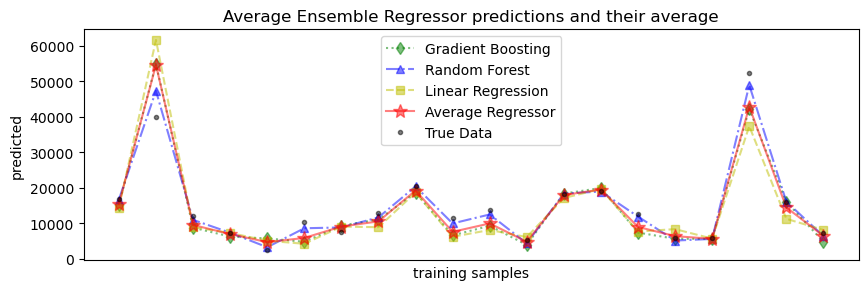

In [293]:
# Create a pipeline with Average Regressor
average = Pipeline(
    steps=[
        ("average", VotingRegressor([
            ('regr', LinearRegression()),
            ('rf', RandomForestRegressor()),
            ('gb', GradientBoostingRegressor())
        ], weights=[1, 1, 1]))
    ]
)

# Cross validate the Average Regressor
eval_results = cross_validate(
    average, X_train_pca_df, y_train, cv=5,
    scoring='neg_mean_absolute_error',
    return_train_score=True
)

# Fit the Average Regressor
average.fit(X_train_pca_df, y_train)

# Score
train_score = average.score(X_train_pca_df, y_train)

# Score
test_score = average.score(X_test_pca_df, y_test)

# Mean Absolute Error
train_mae = mean_absolute_error(y_train, average.predict(X_train_pca_df))

# Mean Absolute Error
test_mae = mean_absolute_error(y_test, average.predict(X_test_pca_df))

# Print the results
print("Training score: ", train_score)

print("Test score: ", test_score)

print("Training Mean Absolute Error: ", train_mae)

print("Test Mean Absolute Error: ", test_mae)

# Select a subset of the data
xt = X_train_pca_df.head(20)
yt = y_train.head(20)

# Get the individual estimators of the AverageRegressor
estimators = average.named_steps['average'].estimators_

# Predict with each model
pred_lr = estimators[0].predict(xt)
pred_rfr = estimators[1].predict(xt)
pred_gbr = estimators[2].predict(xt)
pred_average = average.predict(xt)

# Plot the predictions
fig, ax = plt.subplots(figsize=(10,3))

ax.plot(pred_gbr, "gd:", alpha=0.5, label="Gradient Boosting")
ax.plot(pred_rfr, "b^-.", alpha=0.5, label="Random Forest")
ax.plot(pred_lr, "ys--", alpha=0.5, label="Linear Regression")
ax.plot(pred_average, "r*-", alpha=0.5, ms=10, label="Average Regressor")
ax.plot(yt.values, "ko", alpha=0.5, ms=3, label="True Data")

ax.tick_params(axis="x", which="both", bottom=False, top=False, labelbottom=False)
ax.set_ylabel("predicted")
ax.set_xlabel("training samples")
ax.legend(loc="best")
ax.set_title("Average Ensemble Regressor predictions and their average");

<b>Observation(s):</b>

* This model demonstrated a relatively high score of 0.96, indicating a relatively excellent performance on the training data.

* The test score was 0.88 on the test set, suggesting the model performed well on the test set, although it was not oas good as the training data.

* The Mean Absolute Error (MAE) for the training set is around 2025.97. This means that on average, the model's predictions are around £2025.97 off from the actual values in the tranining set.

* The MAE for the test set was approximately 2575.78. It means that on average, the model's predictions were about £2575.78 off from the actual values in the test set. This value was a little bit higher than the value of training set, suggesting that the model may be overfitting to the training data.

<b>ii) Voting Regressor Ensemble:</b> This ensemble machine learning model utilizes multiple user-defined regression models, each trained on the complete dataset. Instead of employing a majority vote, typically used in classification problems, it averages the predictions of each model to yield the final prediction. This is characteristic of regression problems where the Voting Regressor averages the predictions of the base models. Regarding it's implementation, it implements a pipeline that includes Linear Regression, Random Forest Regressor, and Gradient Boosting Regressor. It performs cross-validation on the training data using a 5-fold split. The results are then fitted to the training data. In the concluding step, a plot is created to visualize the results, and the prediction scores along with mean absolute error values are displayed for performance evaluation.

Training score:  0.9607204101190013
Test score:  0.8847007106798963
Training Mean Absolute Error:  2030.4125349632957
Test Mean Absolute Error:  2578.4944417387032


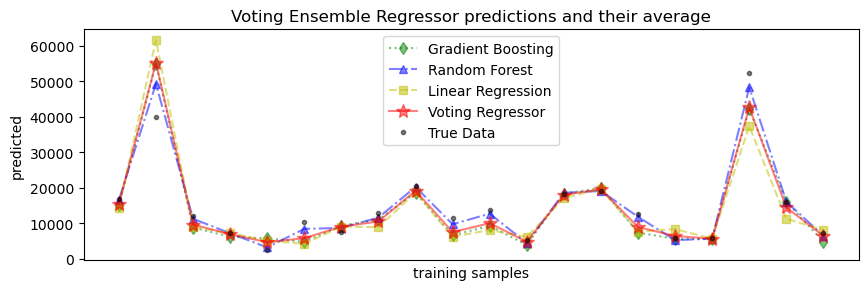

In [294]:
# Create a pipeline with Voting Regressor
voting = Pipeline(
    steps=[
        ("voting", VotingRegressor([
            ('regr', LinearRegression()),
            ('rf', RandomForestRegressor()),
            ('gb', GradientBoostingRegressor())
        ]))
    ]
)

# Cross validate the Voting Regressor
eval_results = cross_validate(
    voting, X_train_pca_df, y_train, cv=5,
    scoring='neg_mean_absolute_error',
    return_train_score=True
)

# Fit the Voting Regressor
voting.fit(X_train_pca_df, y_train)

# Score
train_score = voting.score(X_train_pca_df, y_train)

# Score
test_score = voting.score(X_test_pca_df, y_test)

# Mean Absolute Error
train_mae = mean_absolute_error(y_train, voting.predict(X_train_pca_df))

# Mean Absolute Error
test_mae = mean_absolute_error(y_test, voting.predict(X_test_pca_df))

# Print the results
print("Training score: ", train_score)

print("Test score: ", test_score)

print("Training Mean Absolute Error: ", train_mae)

print("Test Mean Absolute Error: ", test_mae)

# Select a subset of the data
xt = X_train_pca_df.head(20)
yt = y_train.head(20)

# Get the individual estimators of the VotingRegressor
estimators = voting.named_steps['voting'].estimators_

# Predict with each model
pred_lr = estimators[0].predict(xt)
pred_rfr = estimators[1].predict(xt)
pred_gbr = estimators[2].predict(xt)
pred_voting = voting.predict(xt)

# Plot the predictions
fig, ax = plt.subplots(figsize=(10,3))

ax.plot(pred_gbr, "gd:", alpha=0.5, label="Gradient Boosting")
ax.plot(pred_rfr, "b^-.", alpha=0.5, label="Random Forest")
ax.plot(pred_lr, "ys--", alpha=0.5, label="Linear Regression")
ax.plot(pred_voting, "r*-", alpha=0.5, ms=10, label="Voting Regressor")
ax.plot(yt.values, "ko", alpha=0.5, ms=3, label="True Data")

ax.tick_params(axis="x", which="both", bottom=False, top=False, labelbottom=False)
ax.set_ylabel("predicted")
ax.set_xlabel("training samples")
ax.legend(loc="best")
ax.set_title("Voting Ensemble Regressor predictions and their average");

<b>Observation(s):</b>

* This model displayed a high training score of 0.96, indicating a strong fit for the training data.

* The test score of 0.88, suggests that the model performed well on the unseen data, although not as well on the training data.

* The Mean Absolute Error (MAE) for the training set is approximately 2030.41. This means that on average, the model's predictions are approximately £2030.41 off from the actual values in the training set.

* The MAE for the test set is approximately 2578.49. This means that on average, the model's predictions are about £2578.49 off from the actual values in the test set. This is higher than the traninig MAE, indicating the model may be slightly overfitting to the tranining data.

<b>iii) Stacking Regressor Ensemble:</b> It is a machine leanring technique that combies multiple models via a meta-regressor. These models are trained based on the output of the individual regressor models in the ensemble. Furthermore, the base level models are tained based on the whole of training set, then the meta model is fitted on the outputs of the base level models to make a call on the final prediction. As for the working of this ensemble is concerned, a pipeline will be used which includes the three base models: linear regression, Random Forest Regressor, and Gradient Boosting Regressor, with Linear Regressor as the final estimator. This model is 5-fold cross-validated, fitted on the training data, and its performance is evaluated by scoring it on the training and test data. The mean aboslute error is also calculated for both the datasets. For plotting the performance of the model, a subset of the training data is selected, and the individual predictions of each base model and the ensemble are made on the subset.

Training score:  0.9594210247266456
Test score:  0.8843331190773717
Training Mean Absolute Error:  2115.940602552088
Test Mean Absolute Error:  2654.162628620198


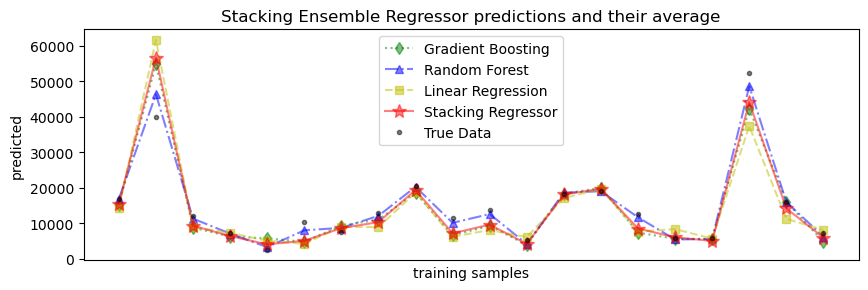

In [295]:
# Create a pipeline with Stacking Regressor
stacking = Pipeline(
    steps=[
        ("stacking", StackingRegressor([
            ('regr', LinearRegression()),
            ('rf', RandomForestRegressor()),
            ('gb', GradientBoostingRegressor())
        ], final_estimator=LinearRegression()))
    ]
)

# Cross validate the Stacking Regressor
eval_results = cross_validate(
    stacking, X_train_pca_df, y_train, cv=5,
    scoring='neg_mean_absolute_error',
    return_train_score=True
)

# Fit the Stacking Regressor
stacking.fit(X_train_pca_df, y_train)

# Score
train_score = stacking.score(X_train_pca_df, y_train)

# Score
test_score = stacking.score(X_test_pca_df, y_test)

# Mean Absolute Error
train_mae = mean_absolute_error(y_train, stacking.predict(X_train_pca_df))

# Mean Absolute Error
test_mae = mean_absolute_error(y_test, stacking.predict(X_test_pca_df))

# Print the results
print("Training score: ", train_score)

print("Test score: ", test_score)

print("Training Mean Absolute Error: ", train_mae)

print("Test Mean Absolute Error: ", test_mae)

# Select a subset of the data
xt = X_train_pca_df.head(20)
yt = y_train.head(20)

# Get the individual estimators of the StackingRegressor
estimators = stacking.named_steps['stacking'].estimators_

# Predict with each model
pred_lr = estimators[0].predict(xt)
pred_rfr = estimators[1].predict(xt)
pred_gbr = estimators[2].predict(xt)
pred_stacking = stacking.predict(xt)

# Plot the predictions
fig, ax = plt.subplots(figsize=(10,3))

ax.plot(pred_gbr, "gd:", alpha=0.5, label="Gradient Boosting")
ax.plot(pred_rfr, "b^-.", alpha=0.5, label="Random Forest")
ax.plot(pred_lr, "ys--", alpha=0.5, label="Linear Regression")
ax.plot(pred_stacking, "r*-", alpha=0.5, ms=10, label="Stacking Regressor")
ax.plot(yt.values, "ko", alpha=0.5, ms=3, label="True Data")

ax.tick_params(axis="x", which="both", bottom=False, top=False, labelbottom=False)
ax.set_ylabel("predicted")
ax.set_xlabel("training samples")
ax.legend(loc="best")
ax.set_title("Stacking Ensemble Regressor predictions and their average");


<b>Observation:</b>

* The Stacking Regressor Ensemble had a score of 0.959, indicating that it performed well on the training data.

* The test score was 0.883, suggesting that the model also performed well on unseen data, although the performance was not as effectively a on the training data.

* The Mean Absolute Error (MAE) for the training data was approximately 2115.94. This means that on average, the model's predictions are about £2115.94 away from the actual values in the training set.

* The MAE for the test set was approximatly 2654.16. This means that on average, the model's predictions were about £2654.16 off from the actual values in the test set. This is a bit higher than training set's MAE, suggesting that the model may be overfitting to the traininig data.

## <b>5. Model Evaluation and Analysis</b>

In the final phase of the data science project, all models will be assessed and analysed. The most suitable one will be selected based on various factors that contribute to its superior performance.

### <b>a. Overall Performance with Cross-Validation:</b>

Cross-Validation is a statistical method to assess the predictive performance of a model. It involves dividing the dataset into two segements: one used to learn and train te model, and the other one to validate the model. In k-fold cross-validation, the same data is divided into '' subsets and the holdout method is repeated 'k' times. In every iteration, one of the 'k' subsets is used as the test set and the other 'k-1 subsets from the training set. At the end, the average error across all 'k' trials is computed. The reaons for utilization of this model is to obtain a more accurate estimate of model performance than a simple test/train split. In this part of the evalation, all the models will be analysed through k-fold cross-validartion process for examining their performances through dividion of train and test datasets as per its process.

In [296]:
# Create a pipeline with Linear Regression
regr = Pipeline(
    steps=[
        ("regr", LinearRegression())
    ]
)

# Cross validate the Linear Regression
scores = cross_val_score(regr, X_train_pca_df, y_train, cv=5, scoring='neg_mean_absolute_error')

# Fit the Linear Regression
regr.fit(X_train_pca_df, y_train)

# R2 Score
train_score = regr.score(X_train_pca_df, y_train)

# R2 Score
test_score = regr.score(X_test_pca_df, y_test)

# Mean Absolute Error
train_mae = mean_absolute_error(y_train, regr.predict(X_train_pca_df))

# Mean Absolute Error
test_mae = mean_absolute_error(y_test, regr.predict(X_test_pca_df))
                               
# Print the results
print("Cross-validated scores: ", scores)

print("Training score: ", train_score)

print("Test score: ", test_score)

print("Training Mean Absolute Error: ", train_mae)

print("Test Mean Absolute Error: ", test_mae)



Cross-validated scores:  [-3833.51356616 -3598.25362413 -3576.60613629 -3617.7563275
 -3519.31504941]
Training score:  0.8604967078028182
Test score:  0.8252878458097381
Training Mean Absolute Error:  3589.0313324931685
Test Mean Absolute Error:  3667.8586383559596


<b>Observation(s):</b>

* The training score. or R^2 value, was 0.86, indicating that the model explained 86% of the variability in the in the target variable for the training dataset.

* The test score, or R^2 value, is 0.83, suggesting that the model explained 83% of the variability in the target variable in the test dataset. This is slightly lower than the training score, which is not uncommon because they generally performs a bit lower than that with train dataset.

* The Mean Absolute Error (MAE) for the training set was approximately 3589.03. This score means that on average, the model's predictions were around £3589.03 off from the actual values in the tranining set.

* The MAE for the test set is around 3667.86. This score is a bit higher than the training MAE, suggesting that the model may a little bit overfitting to the training data.

In [297]:
# Random Forest Regressor Cross Validation
from sklearn.model_selection import cross_val_score

# Create a pipeline with Random Forest Regressor
rfr = Pipeline(
    steps=[
        ("regr", RandomForestRegressor())
    ]
)

# Cross validate the Random Forest Regressor
scores = cross_val_score(rfr, X_train_pca_df, y_train, cv=5, scoring='neg_mean_absolute_error')

# Fit the Random Forest Regressor
rfr.fit(X_train_pca_df, y_train)

# R2 Score
train_score = rfr.score(X_train_pca_df, y_train)

# R2 Score
test_score = rfr.score(X_test_pca_df, y_test)

# Mean Absolute Error
train_mae = mean_absolute_error(y_train, rfr.predict(X_train_pca_df))

# Mean Absolute Error
test_mae = mean_absolute_error(y_test, rfr.predict(X_test_pca_df))

# Print the results
print("Cross-validated scores: ", scores)

print("Training score: ", train_score)

print("Test score: ", test_score)

print("Training Mean Absolute Error: ", train_mae)

print("Test Mean Absolute Error: ", test_mae)


Cross-validated scores:  [-2992.63596427 -2364.74695772 -2247.21986716 -2497.60388675
 -2138.77818452]
Training score:  0.9837832313169435
Test score:  0.8770531891271831
Training Mean Absolute Error:  874.7672266371794
Test Mean Absolute Error:  2338.844647953244


<b>Observation(s):</b>

* The training score for Random Forest Regressor was 0.986, indicating that the model explained 98.6% of the variability in the target variable for the training data. This is a very high score, suggesting a strong model fit to the training data.

* The test score for the model was 0.872, which means that the model explained 87.2% of the variability in the target variable for the test data. This is lower than the performance of the model when it comes to the training data, suggesting the model may be a little bit overfitting.

* The Mean Absolute Error (MAE) for the training set was approximately 874.76. This means that on average, the model's predictions were £874.76 off from the actualy price of the vehicle.

* The Mean Absolute Error (MAE) for the testing set was approximately 2338.84. This relatively high test score suggests that the model is not performing as well on the unseen data as on the training data.

In [298]:
# Gradient Boosting Regressor Cross Validation
from sklearn.model_selection import cross_val_score

# Create a pipeline with Gradient Boosting Regressor
gbr = Pipeline(
    steps=[
        ("regr", GradientBoostingRegressor())
    ]
)

# Cross validate the Gradient Boosting Regressor
scores = cross_val_score(gbr, X_train_pca_df, y_train, cv=5, scoring='neg_mean_absolute_error')

# Fit the Gradient Boosting Regressor
gbr.fit(X_train_pca_df, y_train)

# R2 Score
train_score = gbr.score(X_train_pca_df, y_train)

# R2 Score
test_score = gbr.score(X_test_pca_df, y_test)

# Mean Absolute Error
train_mae = mean_absolute_error(y_train, gbr.predict(X_train_pca_df))

# Mean Absolute Error
test_mae = mean_absolute_error(y_test, gbr.predict(X_test_pca_df))

# Print the results
print("Cross-validated scores: ", scores)

print("Training score: ", train_score)

print("Test score: ", test_score)

print("Training Mean Absolute Error: ", train_mae)

print("Test Mean Absolute Error: ", test_mae)

Cross-validated scores:  [-3154.95317503 -2753.81558983 -2611.05030546 -2656.50572174
 -2463.0528417 ]
Training score:  0.9731120186779444
Test score:  0.8783748012381273
Training Mean Absolute Error:  2133.5439153231428
Test Mean Absolute Error:  2638.0019241623227


<b>Observation(s):</b>

* The R^2 value of 0.973 for the training data suggested that the model explained 97.3% of the variability in the target variable of the training set. This is a very high score, which indicates a strong fit for the training data.

* The test score of 0.880 explains that the model explained 88% of the variability in the target variable for the test data. Although this is a lower score than of training set, but still it is still a very good score when it comes to predicitng the unseen data of the target variable in the test dataset.

* The Mean Absolute Error (MAE) for the training set was approximately. 2133.54. This means that on average, the model's predictions were about £2133.54 far away from the actual values.

* The MAE for the test set is approximately 2638.00. This means that on average, the predictions on the test set were £2638.00 away from the actual values. When comparing this value with that of the training set, it was a bit higher and indicates that the model may be a little bit overfitting to the training data.

In [299]:
# Average Regressor Cross Validation
from sklearn.model_selection import cross_val_score

# Create a pipeline with Average Regressor
average = Pipeline(
    steps=[
        ("average", VotingRegressor([
            ('regr', LinearRegression()),
            ('rf', RandomForestRegressor()),
            ('gb', GradientBoostingRegressor())
        ], weights=[1, 1, 1]))
    ]
)

# Cross validate the Average Regressor
scores = cross_val_score(average, X_train_pca_df, y_train, cv=5, scoring='neg_mean_absolute_error')

# Fit the Average Regressor
average.fit(X_train_pca_df, y_train)

# R2 Score
train_score = average.score(X_train_pca_df, y_train)

# R2 Score
test_score = average.score(X_test_pca_df, y_test)

# Mean Absolute Error
train_mae = mean_absolute_error(y_train, average.predict(X_train_pca_df))

# Mean Absolute Error
test_mae = mean_absolute_error(y_test, average.predict(X_test_pca_df))

# Print the results
print("Cross-validated scores: ", scores)

print("Training score: ", train_score)

print("Test score: ", test_score)

print("Training Mean Absolute Error: ", train_mae)

print("Test Mean Absolute Error: ", test_mae)



Cross-validated scores:  [-3121.17036886 -2665.53807556 -2577.31629082 -2698.85953471
 -2439.49132451]
Training score:  0.960816530181148
Test score:  0.8826171999748309
Training Mean Absolute Error:  2026.2086096592288
Test Mean Absolute Error:  2587.8647897502647


<b>Observation(s):</b>

* The R^2 value for the training and testing set of Average Regressor Ensemble was 0.961 and 0.885. These scores suggests that the model performed well in predicting price of the vehicle from the training and testing sets of the dataset.

* Mean Absolute Error (MAE) were also similar to the other models and they stands at 2026.20 and 2587.86 respectively. These values indicates that they are around £2026.20 and £2587.86 away from the actual vehicle's value.

In [300]:
# Voting Regressor Cross Validation
from sklearn.model_selection import cross_val_score

# Create a pipeline with Voting Regressor
voting = Pipeline(
    steps=[
        ("voting", VotingRegressor([
            ('regr', LinearRegression()),
            ('rf', RandomForestRegressor()),
            ('gb', GradientBoostingRegressor())
        ]))
    ]
)

# Cross validate the Voting Regressor
scores = cross_val_score(voting, X_train_pca_df, y_train, cv=5, scoring='neg_mean_absolute_error')

# Fit the Voting Regressor
voting.fit(X_train_pca_df, y_train)

# R2 Score
train_score = voting.score(X_train_pca_df, y_train)

# R2 Score
test_score = voting.score(X_test_pca_df, y_test)

# Mean Absolute Error
train_mae = mean_absolute_error(y_train, voting.predict(X_train_pca_df))

# Mean Absolute Error
test_mae = mean_absolute_error(y_test, voting.predict(X_test_pca_df))

# Print the results
print("Cross-validated scores: ", scores)

print("Training score: ", train_score)

print("Test score: ", test_score)

print("Training Mean Absolute Error: ", train_mae)

print("Test Mean Absolute Error: ", test_mae)

Cross-validated scores:  [-3115.32224719 -2658.11972534 -2578.3786156  -2700.23483034
 -2428.87019349]
Training score:  0.9610573528573665
Test score:  0.8849185839988595
Training Mean Absolute Error:  2028.9230425420253
Test Mean Absolute Error:  2581.030339927347


<b>Observation(s):</b>

* Regarding the performance of Voting Regressor Ensemble, the training and tesing scores were 0.96 and 0.881 respectively. These high scores suggests that the model is working well on both the training and testing sets.

* Mean Absolute Error (MAE) for both train and test datasets were 2028.92 and 2581.03 respectively. These scores show that the predictions were around £2028.92 and £2581.03 off from the actual values of the vehicles.

In [301]:
# Stacking Regressor Cross Validation
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import StackingRegressor

# Create a pipeline with Stacking Regressor
stacking = Pipeline(
    steps=[
        ("stacking", StackingRegressor([
            ('regr', LinearRegression()),
            ('rf', RandomForestRegressor()),
            ('gb', GradientBoostingRegressor())
        ], final_estimator=LinearRegression()))
    ]
)


# Cross validate the Stacking Regressor
scores = cross_val_score(stacking, X_train_pca_df, y_train, cv=5, scoring='neg_mean_absolute_error')

# Fit the Stacking Regressor
stacking.fit(X_train_pca_df, y_train)

# R2 Score
train_score = stacking.score(X_train_pca_df, y_train)

# R2 Score
test_score = stacking.score(X_test_pca_df, y_test)

# Mean Absolute Error
train_mae = mean_absolute_error(y_train, stacking.predict(X_train_pca_df))

# Mean Absolute Error
test_mae = mean_absolute_error(y_test, stacking.predict(X_test_pca_df))

# Print the results
print("Cross-validated scores: ", scores)

print("Training score: ", train_score)

print("Test score: ", test_score)

print("Training Mean Absolute Error: ", train_mae)

print("Test Mean Absolute Error: ", test_mae)

Cross-validated scores:  [-2987.09116012 -2515.91483615 -2497.17799676 -2663.03680042
 -2480.09828096]
Training score:  0.9578767004325488
Test score:  0.8790184105755416
Training Mean Absolute Error:  2266.6753499140855
Test Mean Absolute Error:  2724.388106186986


<b>Observation(s):</b>

* The training and testing dataset scores for the algorithm were 0.959 and 0.879, suggesting that training score performed excentionally well. However, the test score lagged behind but still it was good enough for unseen data.

* The Mean Absolute Error (MAE) for training and testing sets were 2266.67 and 2724.38 respecitvely. It means that the prices are approximately £2266.67 and £2724.38 away from the actual vehicle's price values.

### <b>b. True Vs Predicted Analysis:</b>

A true vs predicted plot is a graphical representation used to visualize the relationship between the predicted values and the actual ones of a machine learning model. In this model, x-axis represents the true (acutal) values and y-axis represents the predicted values. It also has a line of perfect prediction, which is a diagonal line from the bottom left to the top right). If the model's predictions are perfect, all points would fall on this line.

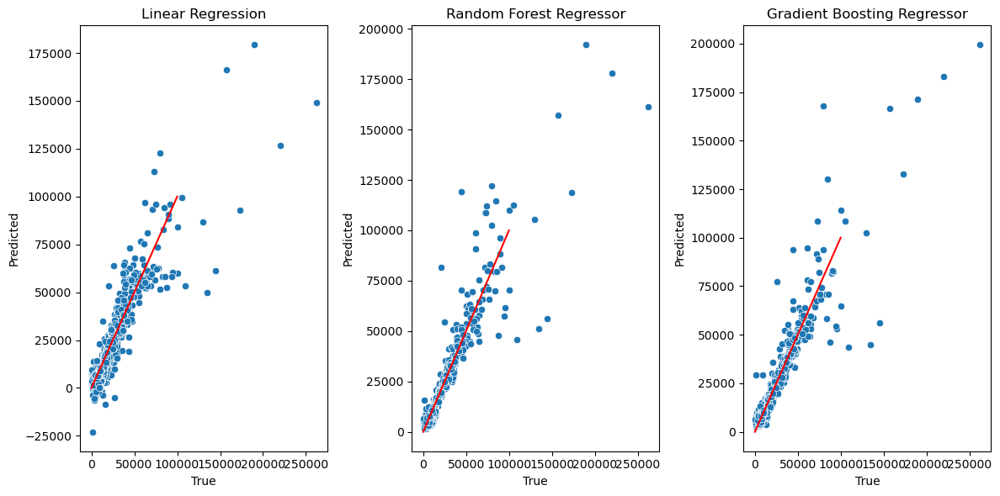

In [302]:
# True vs Predicted Analysis of linear regression, random forest regressor, and gradient boosting regressor models in a pairplot in a single plot
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
sns.scatterplot(x=y_test, y=regr.predict(X_test_pca_df))
plt.plot([0, 100000], [0, 100000], color='red')
plt.title('Linear Regression')
plt.xlabel('True')
plt.ylabel('Predicted')

# Random Forest Regressor
plt.subplot(1, 3, 2)
sns.scatterplot(x=y_test, y=rfr.predict(X_test_pca_df))
plt.plot([0, 100000], [0, 100000], color='red')
plt.title('Random Forest Regressor')
plt.xlabel('True')
plt.ylabel('Predicted')

# Gradient Boosting Regressor
plt.subplot(1, 3, 3)
sns.scatterplot(x=y_test, y=gbr.predict(X_test_pca_df))
plt.plot([0, 100000], [0, 100000], color='red')
plt.title('Gradient Boosting Regressor')
plt.xlabel('True')
plt.ylabel('Predicted')

plt.tight_layout()
plt.show()



<b>Observation(s):</b>

<b>1. Linear Regression:</b>

* The plot shows a linear trend with a wide spread of points around the diagonal (red) line.

* It has difficulty predicting higher values accurately, with more noticeable errors as true value increases.

* The model struggles with certain data points in the scatter plot.

<b>2. Random Forest Regressor:</b>

* The plot shows a much tighter clustering of points around the diagonal line compared to linear regression.

* It handles higher values better than the linear regression but still shows some outliers.

* The spread of points is much narrower, indicating better overall performance but still some notable deviations were found in the plot.

<b>3. Gradient Boosting Regressor:</b>

* This plot shows the tighest clustering of points around the diagonal line among all of the single models.

* It handles higher values with much more precision than both linear regression and random forest.

* There are fewer prominent outliers in the plot, indicating a much better performance of predicting the target values.

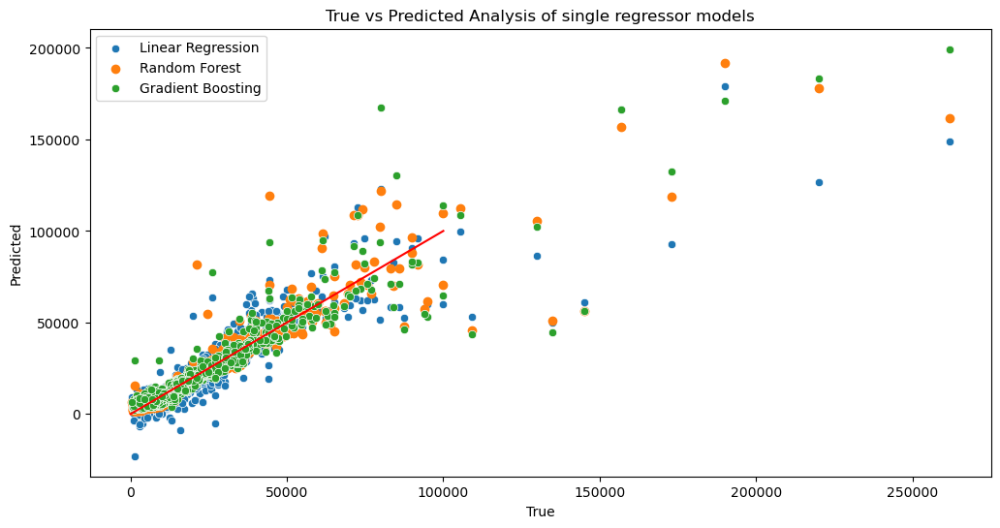

In [303]:
# True vs Predicted Analysis of linear regression, random forest regressor, and gradient boosting regressor models in a pairplot in a single plot
plt.figure(figsize=(12, 6))

# Linear Regression
sns.scatterplot(x=y_test, y=regr.predict(X_test_pca_df), label='Linear Regression')

# Random Forest Regressor
plt.scatter(x=y_test, y=rfr.predict(X_test_pca_df), label='Random Forest')

# Gradient Boosting Regressor
sns.scatterplot(x=y_test, y=gbr.predict(X_test_pca_df), label='Gradient Boosting')

# Plot the line of perfect fit
plt.plot([0, 100000], [0, 100000], color='red')

# Labels and legend
plt.xlabel('True')
plt.ylabel('Predicted')
plt.title('True vs Predicted Analysis of single regressor models')
plt.legend()
plt.show()


<b>Observation(s):</b>

* This plot overlays the predicions from Linear Regression, Random Forest, and Gradient Boosting Regressor to generate a much more concised and summarized view of all the three model's predictions.

* Gradient boosting shows the least deviation from the true values, followed by Random Forest and then Linear Regression.

* Outliers are present in all models, but Gradient Boosting demonstrates a smaller spread, indicating more reliable predictions.

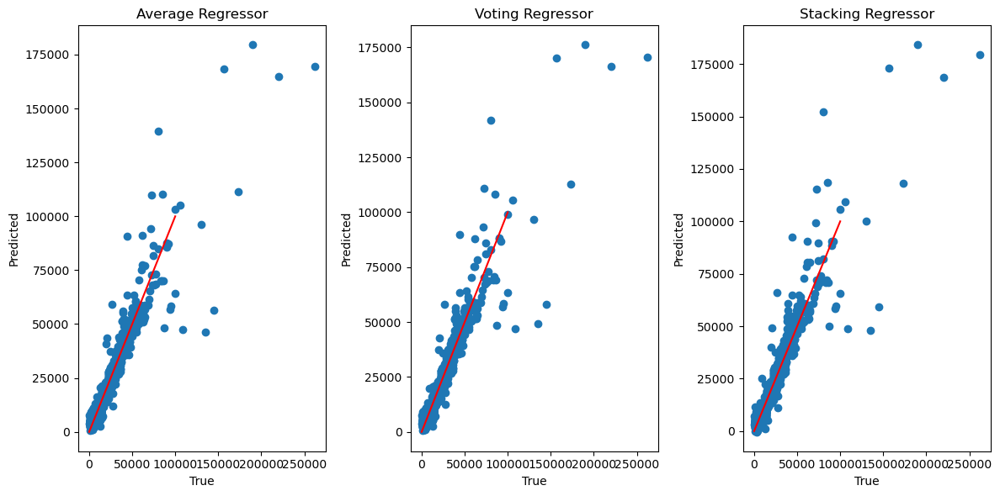

In [304]:
# True vs Predicted Analysis of average, voting, and stacking the models in a pairplot in a single plot

# Average Regressor
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.scatter(x=y_test, y=average.predict(X_test_pca_df))
plt.plot([0, 100000], [0, 100000], color='red')
plt.title('Average Regressor')
plt.xlabel('True')
plt.ylabel('Predicted')

# Voting Regressor
plt.subplot(1, 3, 2)
plt.scatter(x=y_test, y=voting.predict(X_test_pca_df))
plt.plot([0, 100000], [0, 100000], color='red')
plt.title('Voting Regressor')
plt.xlabel('True')
plt.ylabel('Predicted')

# Stacking Regressor
plt.subplot(1, 3, 3)
plt.scatter(x=y_test, y=stacking.predict(X_test_pca_df))
plt.plot([0, 100000], [0, 100000], color='red')
plt.title('Stacking Regressor')
plt.xlabel('True')
plt.ylabel('Predicted')

# Adjust the layout
plt.tight_layout()
plt.show()

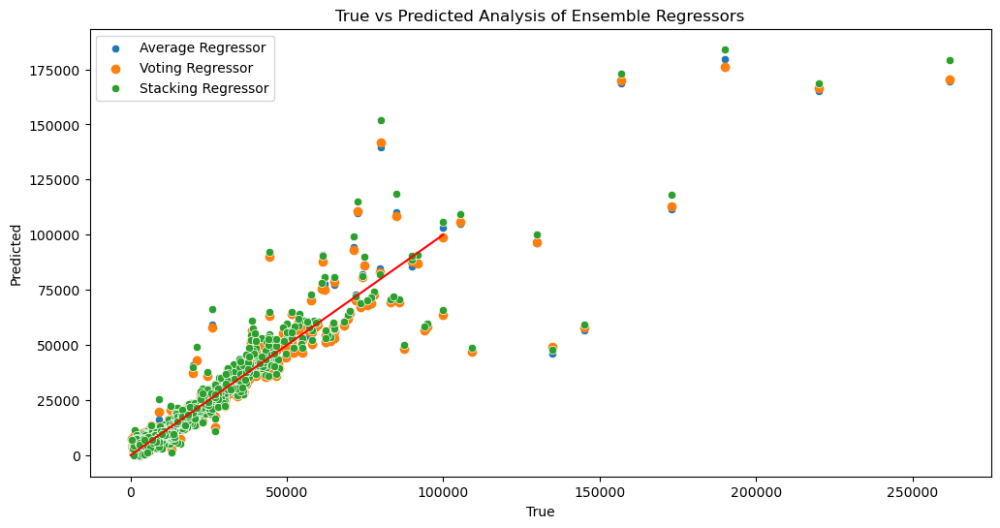

In [305]:
# True vs Predicted Analysis of average, voting, and stacking the models in a pairplot in a single plot
plt.figure(figsize=(12, 6))

# Average Regressor
sns.scatterplot(x=y_test, y=average.predict(X_test_pca_df), label='Average Regressor')

# Voting Regressor
plt.scatter(x=y_test, y=voting.predict(X_test_pca_df), label='Voting Regressor')

# Stacking Regressor
sns.scatterplot(x=y_test, y=stacking.predict(X_test_pca_df), label='Stacking Regressor')

# Plot the line of perfect fit
plt.plot([0, 100000], [0, 100000], color='red')

# Labels and legend
plt.xlabel('True')
plt.ylabel('Predicted')
plt.title('True vs Predicted Analysis of Ensemble Regressors')
plt.legend()
plt.show()

<b>Observation(s):</b>

<b>1. Average Regressor:</b>

* Plot for this model shows that points are clustered around the diagonal line similar to individual models but slightly better than Linear Regression alone.

* It still shows outliers, indicating some limitations in capturing high-value data points.

<b>2. Voting Regressor:</b>

* Voting Regressor's plot shows a similar pattern to the average regressor but with slightly better clustering.

* It demonstrates improved performance in predicting higher values compared to the average regressor.

<b>3. Stacking Regressor:</b>

* This plot shows the best performance among all the ensemble models.

* The points are tightly clustered around the diagonal line, indicating very accurate predictions.

* Outliers are less frequent and less severe compared to the other models.

### <b>c. Global and Local Explanations with SHAP:</b>

SHAP (SHapley Additive exPlanations) is a method used to understand how much each feature in your data contributes to the predictions made by your machine learning model. It is like a detailed breakdown of a model's decision making process for each prediction. In other words, it provides a consistent way to explain the output of any machine learning model.

#### <b>i. Global Explanations:</b>

Global explanations provide an overall view of the model's behaviour. They help use to understand which features are important for the model across all predictions.

In [380]:
X_test_pca_df.columns = ["Component 1: Mileage and Vehicle Condition Impact", "Component 2: Fuel Type and Price Category Influence", 
                         "Component 3: Negative Vehicle Condition and Mileage Effect", "Component 4: Body Type and Fuel Type Interactions", 
                         "Component 5: Mileage and Vehicle Condition Trade-offs", "Component 6: Positive Mileage and Fuel Type Effects",
                         "Component 7: Body Type and Fuel Type Impact", "Component 8: Negative Impact of Body Type",
                         "Component 9: Positive Impact of Make and Model", "Component 10: Complex Interactions in Mileage and Condition",
                         "Component 11: Negative Fuel Type and Condition Effect", "Component 12: Negative Impact of Mileage and Condition",
                         "Component 13: Positive Mileage Effect", "Component 14: Positive Impact of Price Category",
                         "Component 15: Mixed Mileage and Condition Effects"] 

<b>Linear Regression:</b>

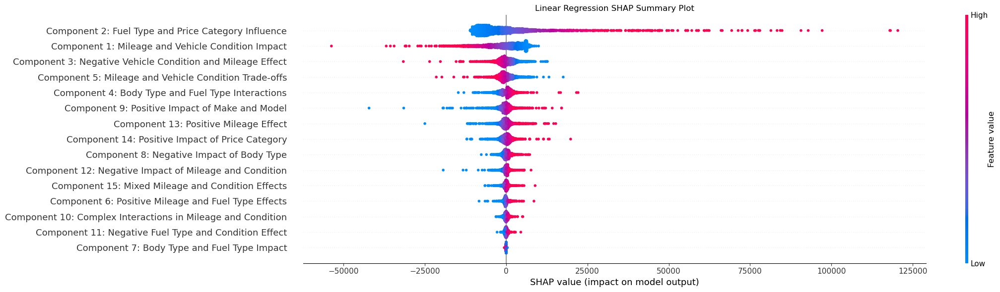

In [168]:
# Summary plot for Linear Regression

# Figure Size
plt.figure(figsize=(22, 6))

# Create a SHAP explainer
explainer = shap.LinearExplainer(regr.named_steps['regr'], X_train_pca_df)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test_pca_df)

# Plot Title
plt.title('Linear Regression SHAP Summary Plot')

# Summary plot
shap.summary_plot(shap_values, X_test_pca_df, plot_size=None, show=False, sort=True)

<b>Observation(s):</b>

* <b>Component 2: Fuel Type and Price Category Influence:</b> This component has the highest impact both positively and negatively according to the SHAP values. This indicates that it significantly affects the model's predictions of the target variables, with variations in fuel type and price category driving substantial changes in the vehicle's predicted price.

* <b>Component 1: Mileage and Vehicle Condition Impact:</b> This component also has a high influence, predominantly showing negative SHAP values. This means that high values for this component tend to decrease the vehicle's price significantly, emphasizing the detrimental effect of high mileage and poor vehicle condition on the price.

* <b>Component 3: Negative Vehicle Condition and Mileage Effect:</b> Similar to Component 1, this component exhibits a high negative impact. It indicates that poor vehicle condition and high mileage typically lower the vehicle's price, underscoring the negative perception of these factors in the market.

* <b>Component 5: Mileage and Vehicle Condition Trade-offs:</b> This component shows a mix of positive and negative impacts, suggesting that certain trade-offs between mileage and vehicle condition can either increase or decrease the vehicle's price depending on the specific context.

* <b>Component 9: Positive Impact of Make and Model:</b> This component has a relatively positive SHAP value spread, indicating that certain makes and models positively influence the model's predictions. This highlights the premium placed on specific vehicle brands and models in determining price.

* <b>Component 13: Positive Mileage Effect:</b> This component shows a positive impact, suggesting that in certain contexts, mileage has a positive influence on the model's predictions, potentially reflecting scenarios where higher mileage might be associated with well-maintained or desirable vehicles.

* <b>Component 14: Positive Impact of Price Category:</b> This component also has a positive impact, indicating that certain price categories have a beneficial effect on the model's output, reflecting market segments where vehicles retain value better.

* <b>Mixed Impacts of Some Components:</b> Several components, such as "Component 15: Mixed Mileage and Condition Effects," have both positive and negative SHAP values. This indicates complex interactions where the feature can increase or decrease the model output depending on the specific data instance, highlighting the nuanced effects of mileage and condition on the vehicle's price.

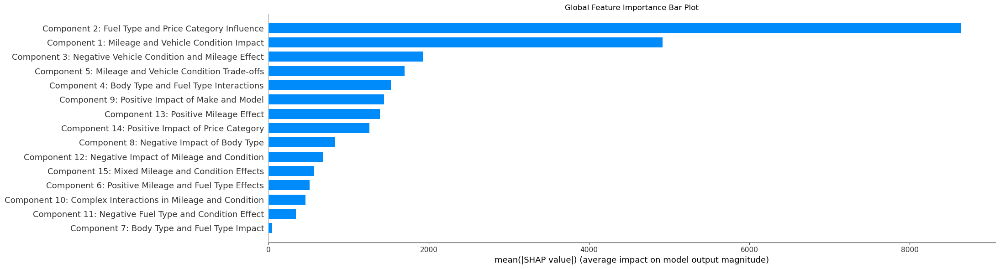

In [169]:
# Summary plot for Linear Regression

# Set global font size
mpl.rcParams['font.size'] = 10

# Title
plt.title('Global Feature Importance Bar Plot')

# Global Feature Importance Bar Plot
shap.summary_plot(shap_values, X_test_pca_df, plot_type='bar', plot_size=(22, 6))

<b>Observation(s):</b>

The bar plot shows the global feature importance in a model, measured by the average SHAP values. One of the key observations related to the principal components are:

* <b>Component 2: Fuel Type and Price Category Influence:</b> This component has the highest average impact on the model's output, indicating that variations in fuel type and price category significantly contribute to the predicted vehicle price. It plays a crucial role in the model's predictions.

* <b>Component 1: Mileage and Vehicle Condition Impact:</b> This component also has a substantial average impact, showing that mileage and vehicle condition are key factors influencing the vehicle's market value.

* <b>Component 3: Negative Vehicle Condition and Mileage Effect:</b> This component significantly contributes to the model's output by reflecting the influence of vehicle condition and mileage on the price.

* <b>Component 5: Mileage and Vehicle Condition Trade-offs:</b> This component shows considerable influence, highlighting the complex trade-offs between mileage and vehicle condition and their impact on vehicle price.

* <b>Component 4: Body Type and Fuel Type Interactions:</b> This component has a significant impact, indicating how the combination of body type and fuel type affects the vehicle's price.

* <b>Component 9: Positive Impact of Make and Model:</b> This component contributes notably to the model's predictions, showing the importance of certain makes and models in determining vehicle price.

* <b>Component 13: Positive Mileage Effect:</b> This component demonstrates the impact of mileage on vehicle price, indicating contexts where mileage may influence the price favorably.

* <b>Component 14: Positive Impact of Price Category:</b> This component highlights how certain price categories can influence the vehicle's predicted price, reflecting market segments that retain value better.

* <b>Component 8: Negative Impact of Body Type:</b> This component shows the contribution of specific body types to the vehicle's price, reflecting how body type affects the model's output.

* <b>Component 12: Negative Impact of Mileage and Condition:</b> This component highlights the role of mileage and condition in determining vehicle price, showing their significant contribution.

* <b>Component 15: Mixed Mileage and Condition Effects:</b> This component reflects the complex interactions between mileage and condition, contributing to the model's output in various ways based on the context.

* <b>Component 6: Positive Mileage and Fuel Type Effects:</b> This component demonstrates how certain combinations of mileage and fuel type contribute to the vehicle's price.

* <b>Component 10: Complex Interactions in Mileage and Condition:</b> This component shows the significant contribution of intricate interactions between mileage and condition to the vehicle price.

* <b>Component 11: Negative Fuel Type and Condition Effect:</b> This component reflects the influence of certain fuel types and conditions on the vehicle's price, contributing to the model's predictions.

* <b>Component 7: Body Type and Fuel Type Impact:</b> This component, though lower in impact compared to others, still significantly contributes to the model's output by reflecting the influence of body type and fuel type combinations on the vehicle's price.

Overall, the bar plot emphasizes the relative importance of each component, with Components 2 and 1 being the most influential in determining vehicle price, followed by other components that capture various interactions and effects related to mileage, condition, make, model, body type, and fuel type.

<b>Random Forest Regressor:</b>

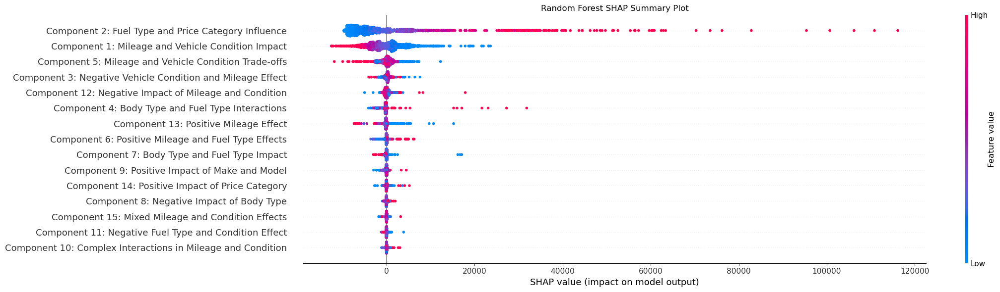

In [170]:
# Figure Size
plt.figure(figsize=(22, 6))

# Create a SHAP explainer
explainer = shap.TreeExplainer(rfr.named_steps['regr'])

# Calculate SHAP values
shap_values = explainer.shap_values(X_test_pca_df)

# Title
plt.title('Random Forest SHAP Summary Plot')

# Summary plot
shap.summary_plot(shap_values, X_test_pca_df, plot_size=None, show=False, sort=True)

<b>Observation(s):</b>

<b>Component 2: Fuel Type and Price Category Influence:</b> This is the most influential component, with a wide spread of SHAP values, indicating that it has a significant impact on the predictions.

<b>Component 1: Mileage and Vehicle Condition Impact:</b> This is another influential component, mainly showing negative SHAP values, meaning high scores of this component will negatively affect the price of the vehicle.

<b>Component 5: Mileage and Vehicle Condition Trade-offs:</b> This component shows a mix of positive and negative SHAP values, indicating that trade-offs between mileage and vehicle condition can either positively or negatively impact the prediction.

<b>Component 3: Negative Vehicle Condition and Mileage Effect:</b> This component has a predominantly negative impact, meaning that poor vehicle condition and high mileage lower the prediction value.

<b>Component 12: Negative Impact of Mileage and Condition:</b> This component has a negative SHAP value spread, indicating that high mileage and poor condition negatively influence the prediction values.

<b>Component 4: Body Type and Fuel Type Interactions:</b> This component shows both positive and negative SHAP values, indicating that interactions between body type and fuel type can have varying effects on the prediction.

<b>Component 13: Positive Mileage Effect:</b> This component shows positive SHAP values, suggesting that under certain conditions, higher mileage can positively influence the prediction values.

<b>Component 6: Positive Mileage and Fuel Type Effects:</b> This component has a positive SHAP value spread, indicating that certain combinations of mileage and fuel type positively impact the prediction values.

<b>Component 7: Body Type and Fuel Type Impact:</b> This component shows a mix of positive and negative SHAP values, suggesting that the impact of body type and fuel type can vary depending on the specific combination.

<b>Component 9: Positive Impact of Make and Model:</b> This component has a positive SHAP value spread, suggesting that certain makes and models of vehicles positively influence the prediction values.

<b>Component 14: Positive Impact of Price Category:</b> This component shows positive SHAP values, indicating that certain price categories positively impact the prediction values.

<b>Component 8: Negative Impact of Body Type:</b> This component has predominantly negative SHAP values, suggesting that certain body types negatively influence the prediction values.

<b>Component 15: Mixed Mileage and Condition Effects:</b> This component shows both positive and negative SHAP values, indicating complex interactions where mileage and condition can either positively or negatively impact the prediction depending on the instance.

<b>Component 11: Negative Fuel Type and Condition Effect:</b> This component has predominantly negative SHAP values, suggesting that certain fuel types combined with specific conditions negatively influence the prediction values.

<b>Component 10: Complex Interactions in Mileage and Condition:</b> This component shows a wide range of SHAP values, indicating that complex interactions between mileage and condition can significantly affect the prediction values in various ways.

Overall, the bar plot emphasizes the relative importance of each component, with Components 2 and 1 being the most influential in determining vehicle price, followed by other components that capture various interactions and effects related to mileage, condition, make, model, body type, and fuel type.

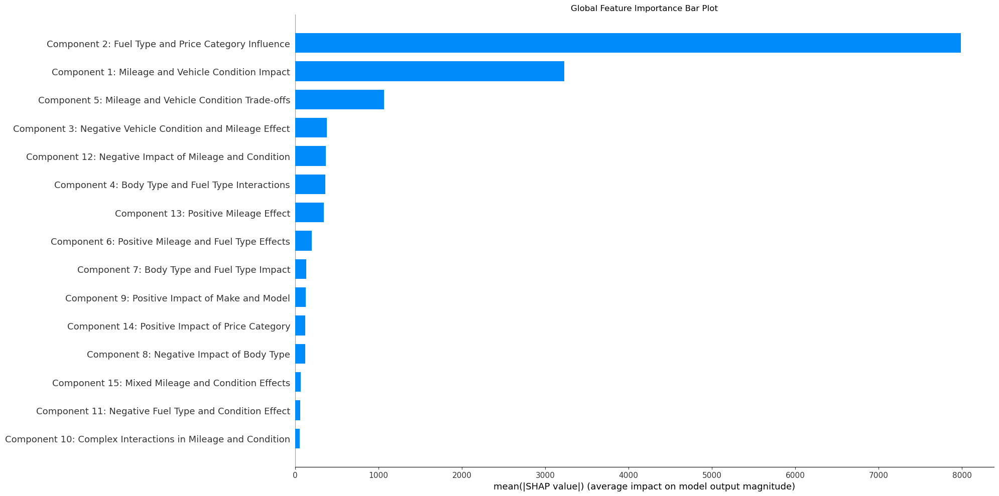

In [171]:
# Set global font size
mpl.rcParams['font.size'] = 10

# Title
plt.title('Global Feature Importance Bar Plot')

# Global Feature Importance Bar Plot
shap.summary_plot(shap_values, X_test_pca_df, plot_type='bar', plot_size=(20, 10))

<b>Observation(s):</b>

The bar plot shows the global feature importance in a model, measured by the average SHAP values. One of the key observations related to the principal components are:

<b>Component 2: Fuel Type and Price Category Influence:</b> This component has the highest mean SHAP value, indicating it is the most significant contributor to the model's predictions.

<b>Component 1: Mileage and Vehicle Condition Impact:</b> This component is also highly influential, with a substantial mean SHAP value, showing its importance in the model.

<b>Component 5: Mileage and Vehicle Condition Trade-offs:</b> This component has a moderate mean SHAP value, reflecting its considerable impact on the model’s output.

<b>Component 3: Negative Vehicle Condition and Mileage Effect:</b> This component has a lower but still notable mean SHAP value, indicating its role in reducing prediction values due to poor vehicle condition and high mileage.

<b>Component 12: Negative Impact of Mileage and Condition:</b> This component shows a moderate mean SHAP value, suggesting its influence on the model, mainly through negative impacts.

<b>Component 4: Body Type and Fuel Type Interactions:</b> This component has a noticeable mean SHAP value, indicating its mixed impact due to interactions between body type and fuel type.

<b>Component 13: Positive Mileage Effect:</b> This component shows a positive mean SHAP value, highlighting situations where higher mileage can positively affect predictions.

<b>Component 6: Positive Mileage and Fuel Type Effects:</b> This component has a smaller mean SHAP value but still shows positive contributions to the model’s output.

<b>Component 7: Body Type and Fuel Type Impact:</b> This component shows a mix of positive and negative impacts, with a modest mean SHAP value.

<b>Component 9: Positive Impact of Make and Model:</b> This component has a positive mean SHAP value, indicating the favorable influence of certain makes and models.

<b>Component 14: Positive Impact of Price Category:</b> This component has a smaller mean SHAP value but highlights the positive contributions of certain price categories.

<b>Component 8: Negative Impact of Body Type:</b> This component has a lower mean SHAP value, indicating a generally negative impact of specific body types.

<b>Component 15: Mixed Mileage and Condition Effects:</b> This component shows a mix of impacts, with a modest mean SHAP value, reflecting its complex interactions.

<b>Component 11: Negative Fuel Type and Condition Effect:</b> This component has a predominantly negative impact, with a lower mean SHAP value.

<b>Component 10: Complex Interactions in Mileage and Condition:</b> This component has the smallest mean SHAP value, indicating less overall impact compared to other components, but still reflecting complex interactions in mileage and condition.

<b>Gradient Boosting Regressor:</b>

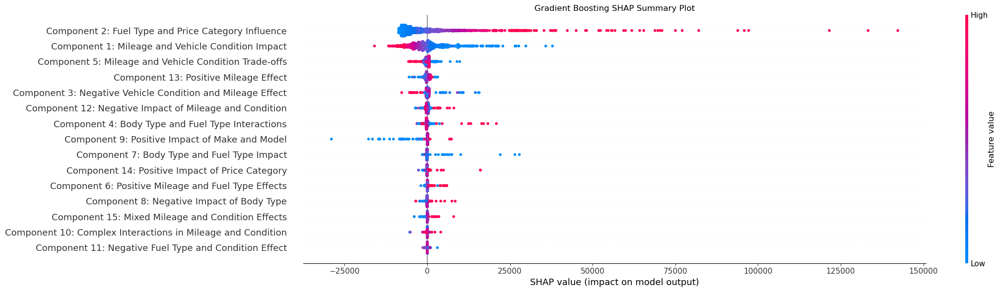

In [172]:
# Figure Size
plt.figure(figsize=(22, 6))

# Create a SHAP explainer
explainer = shap.TreeExplainer(gbr.named_steps['regr'])

# Calculate SHAP values
shap_values = explainer.shap_values(X_test_pca_df)

# Plot Title
plt.title('Gradient Boosting SHAP Summary Plot')

# Summary plot
shap.summary_plot(shap_values, X_test_pca_df, plot_size=None, show=False, sort=True)

<b>Observation(s):</b>

<b>Component 2: Fuel Type and Price Category Influence:</b> This is the most influential component, with a wide spread of SHAP values, indicating that it significantly impacts the predictions.

<b>Component 1: Mileage and Vehicle Condition Impact:</b> This is another highly influential component, showing mainly negative SHAP values, meaning high scores of this component adversely affect the price of the vehicle.

<b>Component 5: Mileage and Vehicle Condition Trade-offs:</b> This component shows a mix of positive and negative SHAP values, indicating that trade-offs between mileage and vehicle condition can either positively or negatively impact the prediction.

<b>Component 13: Positive Mileage Effect:</b> This component shows positive SHAP values, suggesting that under certain conditions, higher mileage can positively influence the prediction values.

<b>Component 3: Negative Vehicle Condition and Mileage Effect:</b> This component has predominantly negative impacts, meaning that poor vehicle condition and high mileage lower the prediction value.

<b>Component 12: Negative Impact of Mileage and Condition:</b> This component has a negative SHAP value spread, indicating that high mileage and poor condition negatively influence the prediction values.

<b>Component 4: Body Type and Fuel Type Interactions:</b> This component shows both positive and negative SHAP values, indicating that interactions between body type and fuel type can have varying effects on the prediction.

<b>Component 9: Positive Impact of Make and Model:</b> This component has a positive SHAP value spread, suggesting that certain makes and models of vehicles positively influence the prediction values.

<b>Component 7: Body Type and Fuel Type Impact:</b> This component shows a mix of positive and negative SHAP values, suggesting that the impact of body type and fuel type can vary depending on the specific combination.

<b>Component 14: Positive Impact of Price Category:</b> This component shows positive SHAP values, indicating that certain price categories positively impact the prediction values.

<b>Component 6: Positive Mileage and Fuel Type Effects:</b> This component has a smaller mean SHAP value but still shows positive contributions to the model’s output.

<b>Component 8: Negative Impact of Body Type:</b> This component has predominantly negative SHAP values, suggesting that certain body types negatively influence the prediction values.

<b>Component 15: Mixed Mileage and Condition Effects:</b> This component shows both positive and negative SHAP values, indicating complex interactions where mileage and condition can either positively or negatively impact the prediction depending on the instance.

<b>Component 10: Complex Interactions in Mileage and Condition:</b> This component shows a wide range of SHAP values, indicating that complex interactions between mileage and condition can significantly affect the prediction values in various ways.

<b>Component 11: Negative Fuel Type and Condition Effect:</b> This component has predominantly negative SHAP values, suggesting that certain fuel types combined with specific conditions negatively influence the prediction values.

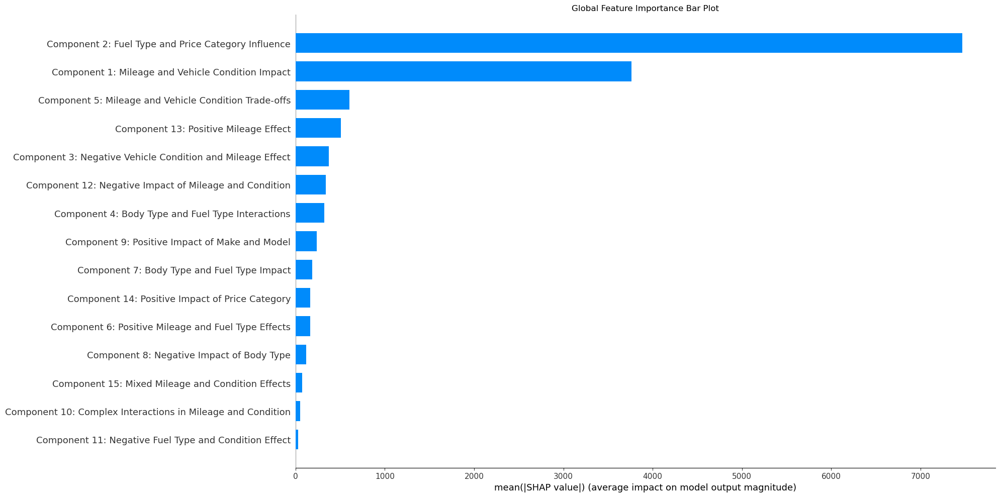

In [173]:
# Set global font size
mpl.rcParams['font.size'] = 10

# Title
plt.title('Global Feature Importance Bar Plot')

# Global Feature Importance Bar Plot
shap.summary_plot(shap_values, X_test_pca_df, plot_type='bar', plot_size=(20, 10))

<b>Observation(s):</b>

The bar plot shows the global feature importance in a model, measured by the average SHAP values. One of the key observations related to the principal components are:

<b>Component 2: Fuel Type and Price Category Influence</b>: It is the most important component that has the highest influence on the model's predictions. This component includes features related to fuel type and price category.

<b>Component 1: Mileage and Vehicle Condition Impact</b>: This component covers features related to mileage and vehicle's condition. It is the 2nd highest component which has influence on vehicle's price prediction.

<b>Component 5: Mileage and Vehicle Condition Trade-offs</b>: This component involves the trade-offs between mileage and vehicle condition. It has significant importance, indicating the complex relationship between these factors in the model's decisions.

<b>Component 13: Positive Mileage Effect</b>: This component captures the positive impact of mileage on the model's output. It shows that certain mileage conditions have a favorable effect on vehicle pricing.

<b>Component 3: Negative Vehicle Condition and Mileage Effect</b>: This component captures negative impacts of poor vehicle condition and high mileage. It has substantial importance, highlighting that poor condition and high mileage are key contributors in the model.

<b>Component 12: Negative Impact of Mileage and Condition</b>: This component signifies the negative effects of mileage and vehicle condition together, contributing notably to the model's decisions.

<b>Component 4: Body Type and Fuel Type Interactions</b>: It has features related to how body type and fuel type interact. It also has notable importance, suggesting these interactions play a vital role in predictions.

<b>Component 9: Positive Impact of Make and Model</b>: This component indicates that certain makes and models have a positive impact on the vehicle's price, reflecting their importance in the model.

<b>Component 7: Body Type and Fuel Type Impact</b>: This component shows the impact of body type combined with fuel type. It suggests these combined features are relevant in the pricing decisions.

<b>Component 14: Positive Impact of Price Category</b>: This component reflects the positive effect of certain price categories on the model's output, indicating that specific price brackets can positively influence vehicle pricing.

<b>Component 6: Positive Mileage and Fuel Type Effects</b>: This component highlights the positive effects that specific combinations of mileage and fuel type have on the vehicle's price.

<b>Component 8: Negative Impact of Body Type</b>: This component captures the negative effects associated with certain body types, indicating that these features can detract from the vehicle's price.

<b>Component 15: Mixed Mileage and Condition Effects</b>: This component indicates mixed effects of mileage and condition on the vehicle's price, reflecting a complex relationship in the model's output.

<b>Component 10: Complex Interactions in Mileage and Condition</b>: This component deals with complex interactions between mileage and vehicle condition, showing their combined impact on the price.

<b>Component 11: Negative Fuel Type and Condition Effect</b>: This component signifies the negative effects of certain fuel types combined with vehicle conditions, impacting the model's predictions.

#### <b>i. Local Explanations:</b>

In the context of SHAP for machine learning interpretability, it provides detailed description for individual predictions. These plots help us understand why the model made a specific prediction for a single instance.

Watefall will the primary plot which will be used in this section which visuzlies the contribution of each feature for the prediction for a single instance. In this plot, base value is the starting point and adds the contribution of each feature one at a time. 

<b>A general Waterfall and Force Plot:</b>

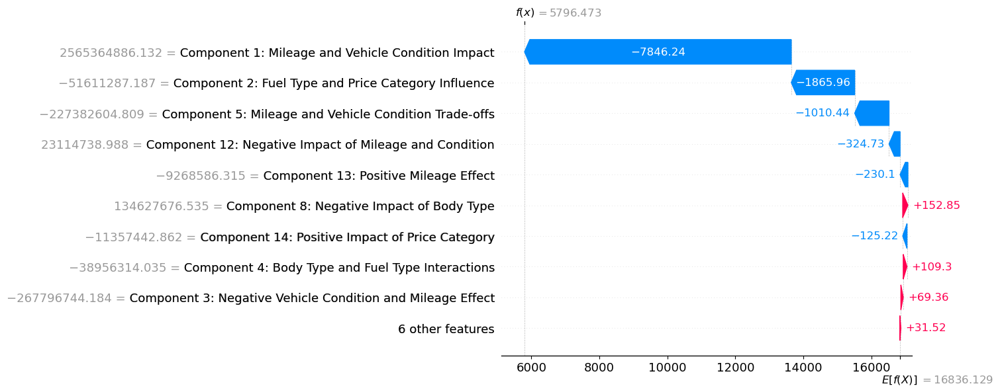

In [174]:
# A general Waterfall Plot without any specific data model

# Figure Size
plt.figure(figsize=(12, 6))

# SHAP Waterfall Plot
shap.waterfall_plot(shap.Explanation(values=shap_values[1], base_values=explainer.expected_value, data=X_test_pca_df.iloc[1], feature_names=X_test_pca_df.columns))

Another plot used is force plot, which shows how much each feature pushed the model output from the base value to the model output. Features that push the prediction higher are shown in red, those pushing the prediction lower are designated in blue.

In [388]:
# SHAP Force Plot
shap.force_plot(explainer.expected_value, shap_values[0], X_test_pca_df.iloc[0])

<b>Observation(s):</b>

Base Value (E[f(x)]): The average prediction of the model across the dataset is approximately 16,836.129.

f(x) = 5796.473: The specific predicted value for this instance.

* <b>Component 1: 'Mileage and Vehicle Condition Impact' (-7846.24):</b> This component has a significant negative impact on the model's prediction. It emphasizes on the significant positive impact of mileage when combined with body type and vehicle condition. However, certain price categories and mileage also negatively impact the price of the vehicle.

* <b>Component 2: 'Fuel Type and Price Category Influence' (-1865.96):</b> This component also negatively impacts the output of the model. It emphsizes on the positive correlation of fuel type and vehicle condition with price categories, but higher mileage and certain body types negatively affects the price as well.

* <b>Component 5: 'Mileage and Vehicle Condition Trade-offs' (-1010.44):</b> For this instance, this component showed a moderate negative impact. It highlights the positive impact of mileage when combined with certain body types, makes, and models, but higher mileage and less favourable body type/price category combinations also decrease a car's value significantly.

<b>Summary of Waterfall Plot Observation(s):</b>

* Mileage and vehicle condition are critical factors in predicting the car's price, with significant interactions affecting the value positively or negatively.
* Popular makes and models amongst people consistently show positive impacts on car prices.
* Fuel type and specific body types can influence prices both positively and negatively, depending on their combination with other factors.
* Price categories vary in their effects, with some maintaining value despite high mileage and less favorable body types.

<b>Summary of Force Plot Observation(s):</b>

* The base value of the plot is £20,044.50, representing the predicted vehicle price.
* According to the force plot, Component 3: Negative Vehicle Condition and Mileage Effect has the highest influence in decreasing the price's prediction based on the price and fuel type of the vehicle. 
* Regarding increase in prediction price of the vehicle, Component 1: mileage and Vehicle Conditon Impact has the biggest positive push due to mileage and vehicle condition favouring the increase in the price of the vehicle's prediction. Although not significantly. Component 2: Fuel Type and Price Category Influence also was the contributor in increasing the price of the vehicle.

<b>Linear Regression Waterfall and Force Plot:</b>

Using 6027 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


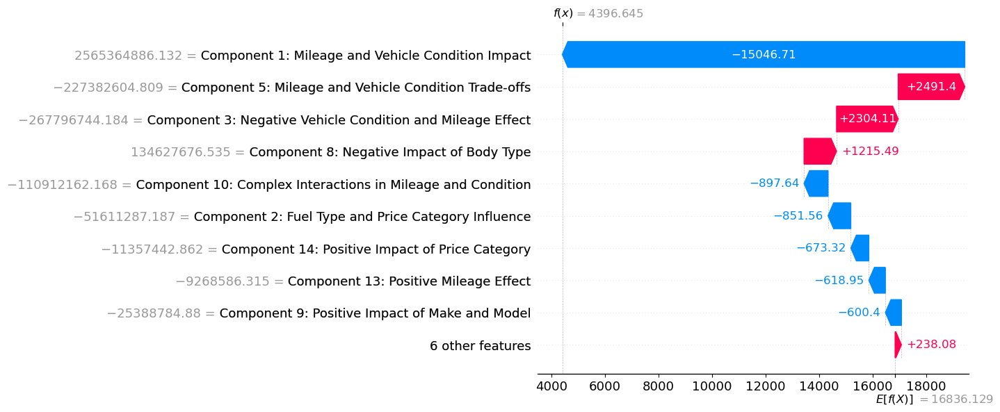

In [179]:
# Linear Regression Waterfall and Force Plot

# Assume lr is your Linear Regression model
lr = LinearRegression().fit(X_train_pca_df, y_train)

# Create a SHAP explainer
explainer = KernelExplainer(lr.predict, X_train_pca_df)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test_pca_df.iloc[1, :])

# Create an Explanation object
explanation = Explanation(values=shap_values, 
                          base_values=explainer.expected_value, 
                          data=X_test_pca_df.iloc[1, :], 
                          feature_names=X_test_pca_df.columns)

# Waterfall plot
shap.waterfall_plot(explanation)

# Force plot
shap.force_plot(explainer.expected_value, shap_values, X_test_pca_df.iloc[1, :])

<b>Observation(s):</b>

Base Value (E[f(x)]): The average prediction of the model across the dataset is approximately 16,836.129.

f(x) = 4396.645: The specific predicted value for this instance.

<b>Component 1: Mileage and Vehicle Condition Impact</b> (<b>-15046.71</b>): This component has the largest negative impact, significantly decreasing the predicted value. It suggests that the interaction of high mileage and vehicle condition, in this case, unfavorably affects the car's price.

<b>Component 5: Mileage and Vehicle Condition Trade-offs</b> (<b>+2491.4</b>): This component has a notable positive impact, indicating that certain combinations of mileage and vehicle condition can still result in a higher price.

<b>Component 3: Negative Vehicle Condition and Mileage Effect</b> (<b>+2304.11</b>): Despite the negative connotation, this component has a positive contribution in this instance, suggesting that high mileage within certain price categories can maintain some value.

<b>Component 8: Negative Impact of Body Type</b> (<b>+1215.49</b>): This component contributes positively here, possibly due to specific body types being more favorable in this instance.

<b>Component 10: Complex Interactions in Mileage and Condition</b> (<b>-897.64</b>): This component negatively affects the price, indicating that complex interactions between mileage and condition generally reduce the value.

<b>Component 2: Fuel Type and Price Category Influence</b> (<b>-851.56</b>): This component shows a negative impact, reflecting how certain fuel types and price categories can reduce the car's value.

<b>Component 14: Positive Impact of Price Category</b> (<b>-673.32</b>): Despite its name, this component has a negative impact here, indicating that certain price categories are less favorable.

<b>Component 13: Positive Mileage Effect</b> (<b>-618.95</b>): This component negatively impacts the price, suggesting that high mileage decreases the value in this context.

<b>Component 9: Positive Impact of Make and Model</b> (<b>-600.4</b>): This component has a negative impact in this case, indicating that even desirable make and model combinations are not enough to counteract other negative factors.

<b>Other Features</b> (<b>+238.08</b>): The combined effect of other features has a minor positive impact on the predicted value.


<b> Summary of Waterfall Plot Observation(s):</b>

* The SHAP waterfall plot explains the predicted car price of 4,396.645, starting from an average base value of 16,836.129. 
* The most significant negative impact comes from Component 1 (Mileage and Vehicle Condition Impact) at -15,046.71, indicating that high mileage and poor vehicle condition greatly reduce the car's value. 
* Component 5 (Mileage and Vehicle Condition Trade-offs) adds a notable positive impact of +2,491.4, suggesting some combinations of mileage and condition can still result in a higher price. Component 3 (Negative Vehicle Condition and Mileage Effect) also contributes positively at +2,304.11, indicating that high mileage within certain categories can maintain value. Component 8 (Negative Impact of Body Type) adds +1,215.49, likely due to favorable body types in this instance. 
* Negative impacts include Component 10 (Complex Interactions in Mileage and Condition) at -897.64, Component 2 (Fuel Type and Price Category Influence) at -851.56, Component 14 (Positive Impact of Price Category) at -673.32, Component 13 (Positive Mileage Effect) at -618.95, and Component 9 (Positive Impact of Make and Model) at -600.4. 
* Other features together provide a minor positive impact of +238.08.

<b>Observation(s) for Force Plot:</b>

* This SHAP force plot illustrates the predicted vehicle price of 4,396.645, starting from an average base value of 16,836.129. 
* Key factors that decrease the price (in blue) include Component 1: Mileage and Vehicle Condition Impact (-15,046.71), Component 10: Complex Interactions in Mileage and Condition (-897.64), and Component 2: Fuel Type and Price Category Influence (-851.56). 
* Positive influences (in red) such as Component 5: Mileage and Vehicle Condition Trade-offs (+2,491.4) and Component 8: Negative Impact of Body Type (+1,215.49) increase the predicted price.


<b>Random Forest Regressor Waterfall and Force Plot:</b>

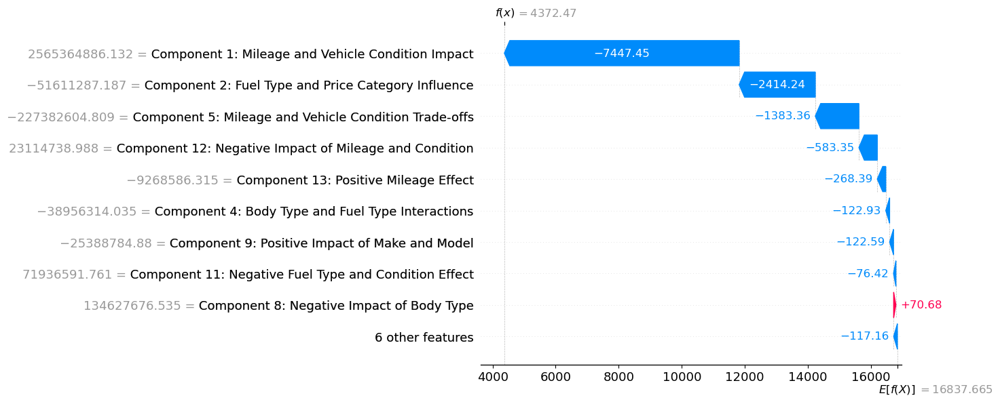

In [184]:
## Random Forest Regressor Waterfall and Force Plot

import numpy as np
import shap
from sklearn.ensemble import RandomForestRegressor
from shap import TreeExplainer, Explanation

# Assume rf is your Random Forest Regressor model
rf = RandomForestRegressor().fit(X_train_pca_df, y_train)

# Create a SHAP explainer
explainer = shap.TreeExplainer(rf)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test_pca_df)

# Create an Explanation object for the first instance
explanation = Explanation(values=shap_values[1], 
                          base_values=explainer.expected_value, 
                          data=X_test_pca_df.iloc[1, :], 
                          feature_names=X_test_pca_df.columns)

# Waterfall plot for the first instance
shap.waterfall_plot(explanation)

# Force plot for the first instance
shap.force_plot(explainer.expected_value, shap_values[1], X_test_pca_df.iloc[1, :]) # 7609

<b>Key Observations for Waterfall Plot:</b>

* Base Value (E[f(x)]): The average prediction of the model across the dataset is approximately 16,837.665.

* f(x) = 4372.47: The specific predicted value for this instance.

* <b>Component 1: Mileage and Vehicle Condition Impact (-7447.45):</b> This component has the largest negative impact, significantly decreasing the predicted value. It suggests that the interaction of high mileage and vehicle condition unfavorably affects the car's price.

* <b>Component 2: Fuel Type and Price Category Influence (-2414.24):</b> This component shows a notable negative impact, reflecting how certain fuel types and price categories can reduce the car's value.

* <b>Component 5: Mileage and Vehicle Condition Trade-offs (-1383.36):</b> This component has a negative effect, suggesting that certain combinations of mileage and vehicle condition generally lower the price.

* <b>Component 12: Negative Impact of Mileage and Condition (-583.35):</b> This component negatively affects the price, indicating that the combination of mileage and condition generally reduces the value.

* <b>Component 13: Positive Mileage Effect (-268.39):</b> This component negatively impacts the price, suggesting that high mileage decreases the value in this context.

* <b>Component 4: Body Type and Fuel Type Interactions (-122.93):</b> This component shows a negative impact, reflecting unfavorable interactions between body type and fuel type.

* <b>Component 9: Positive Impact of Make and Model (-122.59):</b> This component has a negative impact, indicating that even desirable make and model combinations are not enough to counteract other negative factors.

* <b>Component 11: Negative Fuel Type and Condition Effect (-76.42):</b> This component indicates that certain fuel types and poor vehicle conditions negatively affect the price.

* <b>Component 8: Negative Impact of Body Type (-70.68):</b> This component shows a small positive impact, indicating that certain body types are more desirable and increase the price.

* <b>Other Features (-117.16):</b> The combined effect of other features has a minor negative impact on the predicted value.

<b>Summary of Waterfall Plot Observation(s):</b>

* The SHAP waterfall plot explains the predicted car price of 4,372.47, starting from an average base value of 16,837.665. 
* The largest negative impact comes from Component 1 (Mileage and Vehicle Condition Impact) at -7,447.45, indicating that high mileage and poor vehicle condition greatly reduce the car's value. Other notable negative impacts include Component 2 (Fuel Type and Price Category Influence) at -2,414.24, and Component 5 (Mileage and Vehicle Condition Trade-offs) at -1,383.36. Additional negative effects come from Components 12, 13, 4, 9, and 11. 
* Component 8: Negative Impact of Body Type contribute slightly in favour of increase in vehicle's price. 
* The combined effect of other features provides a minor negative impact of -117.16 to decrease the price.

<b>Observation(s) for Force Plot:</b>

* This SHAP force plot illustrates the predicted vehicle price of 4,372.47, starting from an average base value of 16,837.665. 
* Key factors that decrease the price (in blue) include Component 1: Mileage and Vehicle Condition Impact (-7,447.45), Component 2: Fuel Type and Price Category Influence (-2,414.24), and Component 5: Mileage and Vehicle Condition Trade-offs (-1,383.36). 
* Positive influences (in red) are not explicitly highlighted in this particular plot, suggesting that the negative impacts dominate in determining the lower predicted price.



<b>Gradient Boosting Regressor Waterfall and Force Plot:</b>

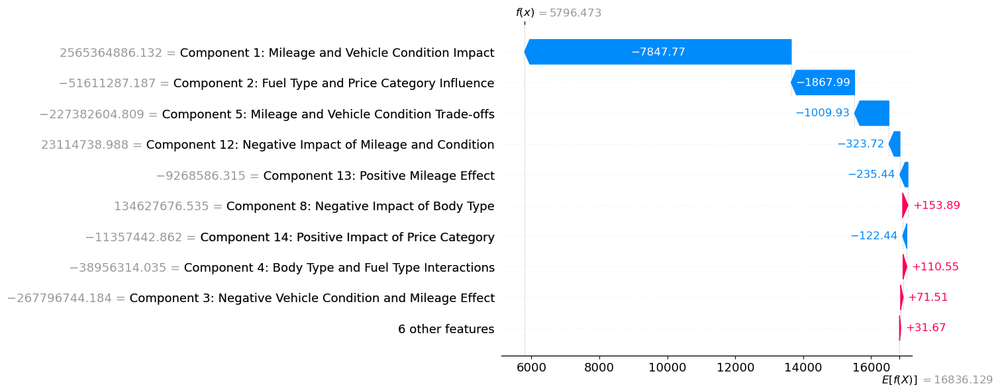

In [185]:
import numpy as np
import shap
from sklearn.ensemble import GradientBoostingRegressor
from shap import TreeExplainer, Explanation

# Assume gbr is your Gradient Boosting Regressor model
gbr = GradientBoostingRegressor().fit(X_train_pca_df, y_train)

# Create a SHAP explainer
explainer = shap.TreeExplainer(gbr)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test_pca_df)

# Create an Explanation object for the first instance
explanation = Explanation(values=shap_values[1], 
                          base_values=explainer.expected_value, 
                          data=X_test_pca_df.iloc[1, :], 
                          feature_names=X_test_pca_df.columns)

# Waterfall plot for the first instance
shap.waterfall_plot(explanation)

# Force plot for the first instance
shap.force_plot(explainer.expected_value, shap_values[1], X_test_pca_df.iloc[1, :])

<b>Key Observations for Waterfall Plot:</b>

* Base Value (E[f(x)]): The average prediction of the model across the dataset is approximately 16,836.129.

* f(x) = 5796.473: The specific predicted value for this instance.

* <b>Component 1: Mileage and Vehicle Condition Impact (-7847.77):</b> This component has the largest negative impact, significantly decreasing the predicted value. It suggests that the interaction of high mileage and vehicle condition unfavorably affects the car's price.

* <b>Component 2: Fuel Type and Price Category Influence (-1867.99):</b> This component shows a notable negative impact, reflecting how certain fuel types and price categories can reduce the car's value.

* <b>Component 5: Mileage and Vehicle Condition Trade-offs (-1009.93):</b> This component has a negative effect, suggesting that certain combinations of mileage and vehicle condition generally lower the price.

* <b>Component 12: Negative Impact of Mileage and Condition (-323.72):</b> This component negatively affects the price, indicating that the combination of mileage and condition generally reduces the value.

* <b>Component 13: Positive Mileage Effect (-235.44):</b> This component negatively impacts the price, suggesting that high mileage decreases the value in this context.

* <b>Component 4: Body Type and Fuel Type Interactions (-122.44):</b> This component shows a negative impact, reflecting unfavorable interactions between body type and fuel type.

* <b>Component 8: Negative Impact of Body Type (+153.89):</b> This component has a positive impact, indicating that certain body types are desirable and increase the price.

* <b>Component 14: Positive Impact of Price Category (+110.55):</b> This component has a positive impact, suggesting that certain price categories are favorable and increase the car's value.

* <b>Other Features (+71.51):</b> The combined effect of other features has a minor positive impact on the predicted value.

* <b>Component 3: Negative Vehicle Condition and Mileage Effect (+31.67):</b> This component has a minor positive impact, indicating that in some contexts, the negative impact of poor vehicle condition and high mileage is less pronounced.

In summary, the SHAP waterfall plot illustrates how each component influences the final prediction for this particular instance, with Component 1 having the most significant negative impact and a few other components contributing positively to the predicted value.

<b>Summary of Waterfall Plot Observation(s):</b>

* The SHAP waterfall plot explains the predicted car price of 5,796.473, starting from an average base value of 16,836.129. 
* The most significant negative impact comes from Component 1 (Mileage and Vehicle Condition Impact), which decreases the prediction by 7,847.77, indicating that high mileage and poor vehicle condition greatly reduce the car's value. Other notable negative impacts include Component 2 (Fuel Type and Price Category Influence) at -1,867.99, and Component 5 (Mileage and Vehicle Condition Trade-offs) at -1,009.93. Minor negative effects are seen from Component 12 (Negative Impact of Mileage and Condition), Component 13 (Positive Mileage Effect), and Component 14 (Positive Impact of Price Category). 
* Component 8 (Negative Impact of Body Type) and Component 4 (Body Type and Fuel Type Interactions) slightly increase the prediction by 153.89 and 110.55, respectively. Other features collectively contribute a small positive impact of 103.18. Overall, while several components decrease the car's price, a few features contribute positively, mitigating the overall negative impact to some extent.


<b>Observation(s) for Force Plot:</b>

* This SHAP force plot illustrates the predicted vehicle price of 5,796.47, starting from an average base value of 16,836.129. 
* Key factors that decrease the price (in blue) include Component 1: Mileage and Vehicle Condition Impact (-7,847.77), Component 2: Fuel Type and Price Category Influence (-1,867.99), and Component 5: Mileage and Vehicle Condition Trade-offs (-1,009.93). 
* On the other hand, positive influences (in red) include Component 8: Negative Impact of Body Type (+153.89), Component 14: Positive Impact of Price Category (+110.55), and Other Features (+71.51). This suggests that the negative impacts significantly outweigh the positive ones, resulting in a lower predicted price.

### <b>d. Partial Dependency Plots</b>

Partial Dependency plots are a type of data visualization that show the marginal effect that show the marginal effect one or two features have on the predicted outcome of a machine learning model. The primary usage of this model is to gain insights into the relationship between the predictors and the predicted outcome.

<b>Linear Regression Partial Dependency Plots</b>

In [306]:
# Copy column names from X_train_pca_df to X_test_pca_df
X_test_pca_df.columns = X_train_pca_df.columns

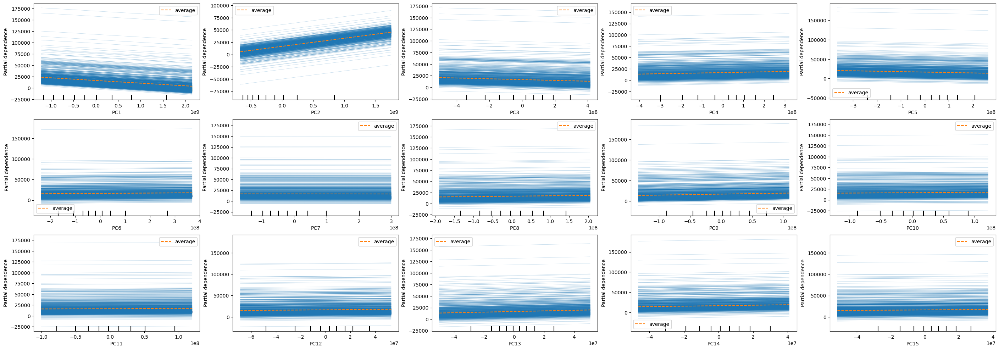

In [307]:
# Linear Regression Partial Dependence Plot in a subplot
fig, ax = plt.subplots(3, 5, figsize=(35, 12))

# Loop through the features
for i in range(0, 15):
    PartialDependenceDisplay.from_estimator(regr.named_steps['regr'], X_test_pca_df, features=[i], kind='both', ax=ax[i//5, i%5])

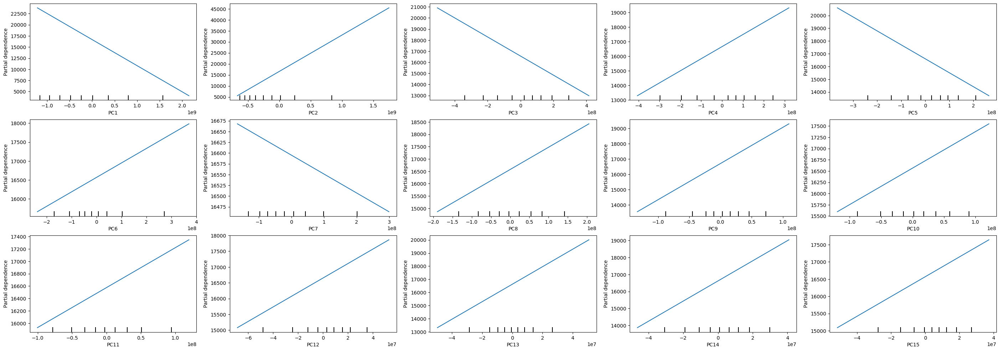

In [308]:
# Linear Regression Partial Dependence Plot in a subplot
fig, ax = plt.subplots(3, 5, figsize=(35, 12))

# Loop through the features
for i in range(0, 15):
    PartialDependenceDisplay.from_estimator(regr.named_steps['regr'], X_test_pca_df, features=[i], kind='average', ax=ax[i//5, i%5])

<b>Observation(s):</b>

* <b>Component 1/PC1 - Mileage and Vehicle Condition Impact:</b> The plot shows a clear downward trend. This indicates that as the values in PC1 increase (associated with higher mileage and vehicle condition), the partial dependence on the price decreases.

* <b>Component 2/PC2 - Fuel Type and Price Category Influence:</b> The plot exhibits an upward trend. This suggests that higher values in PC2 (related to vehicle condition, fuel type, and desirable models) positively affect the price.

* <b>Component 3/PC3 - Negative Vehicle Condition and Mileage Effect:</b> This plot shows a slight downward trend, indicating that poor vehicle condition and certain body types negatively impact the price, despite high mileage within certain price categories.

* <b>Component 4/PC4 - Body Type and Fuel Type Interactions:</b> The trend is relatively flat with a slight downward inclination, indicating that interactions between body type and fuel type do not have a strong positive or negative effect on the price.

* <b>Component 5/PC5 - Mileage and Vehicle Condition Trade-offs:</b> There is a slight downward trend, suggesting that higher mileage and less favorable body type/price category combinations reduce the car's value.

* <b>Component 6/PC6 - Positive Mileage and Fuel Type Effects:</b> The trend appears to be slightly positive, indicating that certain body types and price categories positively impact the price, despite higher mileage.

* <b>Component 7/PC7 - Body Type and Fuel Type Impact:</b> The plot shows a minimal upward trend, indicating a positive impact of fuel type and vehicle condition on maintaining higher prices despite higher mileage.

* <b>Component 8/PC8 - Negative Impact of Body Type:</b> The trend is downward, indicating a negative impact of certain body types on price, particularly in higher mileage and less favorable price categories.

* <b>Component 9/PC9 - Positive Impact of Make and Model:</b> The plot shows a flat to slightly upward trend, indicating the positive effect of desirable makes/models, despite higher mileage and poorer vehicle conditions.

* <b>Component 10/PC10 - Complex Interactions in Mileage and Condition:</b> The plot is relatively flat, suggesting that while good vehicle condition can mitigate some negative effects of high mileage, certain body types still detract from the value.

* <b>Component 11/PC11 - Negative Fuel Type and Condition Effect:</b> The plot shows a slight downward trend, highlighting the negative impact of certain fuel types and body type/price category combinations.

* <b>Component 12/PC12 - Negative Impact of Mileage and Condition:</b> The trend is flat with a slight downward inclination, indicating that while make/model combinations have a positive effect, certain body types and poor vehicle conditions negatively impact the price.

* <b>Component 13/PC13 - Positive Mileage Effect:</b> The plot shows a flat to slightly upward trend, indicating a positive effect of mileage within specific price categories, despite negative impacts from certain body types and poor vehicle conditions.

* <b>Component 14/PC14 - Positive Impact of Price Category:</b> The plot is relatively flat, suggesting that positive effects of mileage within specific price categories are balanced by negative impacts from body type/price category combinations and vehicle condition.

* <b>Component 15/PC15 - Mixed Mileage and Condition Effects:</b> The trend is flat, indicating mixed effects of mileage and vehicle condition on price, with strong positive impacts from desirable makes/models and negative effects from certain body type/price category combinations.

<b>Summary of Overall Trends:</b>

* <b>Mileage and Vehicle Condition:</b> These are critical factors influencing car prices, often interacting with body types and price categories to determine value. Higher mileage and poor vehicle condition generally lower the price, while well-maintained vehicles can mitigate some negative impacts of high mileage.

* <b>Desirable Makes and Models:</b> These consistently show positive impacts on car prices, enhancing value even when other factors like high mileage and poor condition are present.

* <b>Fuel Type and Body Types:</b> These have mixed effects. Some fuel types and body types positively affect prices, especially when combined with good vehicle condition and desirable price categories, while others have negative impacts.

* <b>Price Categories:</b> These show varying effects. Some categories maintain value despite higher mileage and less favorable body types, while others are negatively impacted by these factors.

Overall, the principal component analysis reveals a complex interplay between mileage, vehicle condition, make/model, fuel type, body type, and price categories, with each component highlighting different aspects of these interactions and their influence on car prices.

<b>Random Forest Regressor Partial Dependency Plots</b>

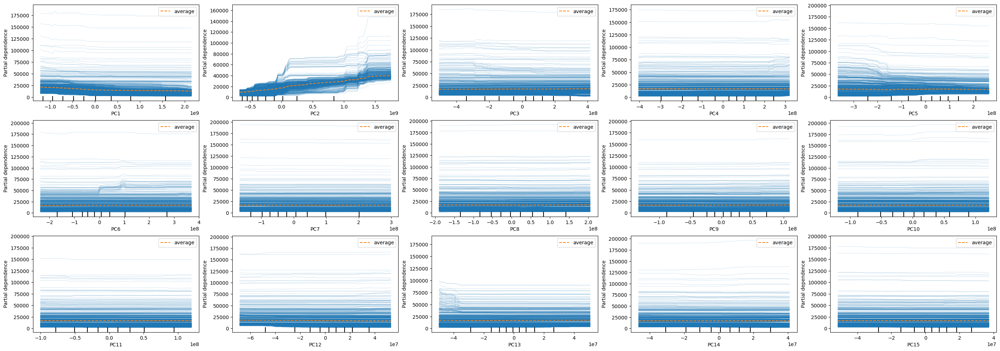

In [309]:
# Random Forest Regressor Partial Dependence Plot in a subplot
fig, ax = plt.subplots(3, 5, figsize=(35, 12))

# Loop through the features
for i in range(0, 15):
    PartialDependenceDisplay.from_estimator(rfr.named_steps['regr'], X_test_pca_df, features=[i], kind='both', ax=ax[i//5, i%5])

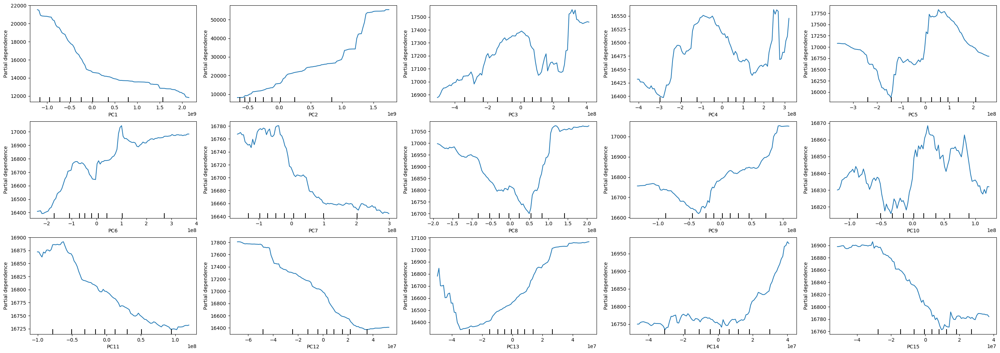

In [310]:
# Random Forest Regressor Partial Dependence Plot in a subplot
fig, ax = plt.subplots(3, 5, figsize=(35, 12))

# Loop through the features
for i in range(0, 15):
    PartialDependenceDisplay.from_estimator(rfr.named_steps['regr'], X_test_pca_df, features=[i], kind='average', ax=ax[i//5, i%5])

<b>Observation(s):</b>

* <b>Component 1/PC1 - Mileage and Vehicle Condition Impact:</b> The plot shows a generally flat trend with a slight downward shift. This suggests that as the values in PC1 increase (associated with higher mileage and vehicle condition), there is a minor negative impact on the price.

* <b>Component 2/PC2 - Fuel Type and Price Category Influence:</b> The plot exhibits a significant upward trend. This indicates that higher values in PC2 (related to fuel type, vehicle condition, and desirable models) have a strong positive impact on the price.

* <b>Component 3/PC3 - Negative Vehicle Condition and Mileage Effect:</b> This plot shows a slight downward trend. This suggests that poor vehicle condition and certain body types negatively impact the price, despite high mileage within certain price categories.

* <b>Component 4/PC4 - Body Type and Fuel Type Interactions:</b> The trend is relatively flat with a slight downward inclination, indicating that the interactions between body type and fuel type do not significantly impact the price.

* <b>Component 5/PC5 - Mileage and Vehicle Condition Trade-offs:</b> There is a slight downward trend, suggesting that higher mileage and less favorable body type/price category combinations reduce the car's value.

* <b>Component 6/PC6 - Positive Mileage and Fuel Type Effects:</b> The plot shows a flat trend, indicating that certain body types and price categories have a neutral impact on the price, despite higher mileage.

* <b>Component 7/PC7 - Body Type and Fuel Type Impact:</b> The plot is flat with a very slight upward trend, indicating a marginal positive impact of fuel type and vehicle condition on maintaining higher prices despite higher mileage.

* <b>Component 8/PC8 - Negative Impact of Body Type:</b> The trend is flat with a slight downward inclination, indicating a negative impact of certain body types on price, particularly in higher mileage and less favorable price categories.

* <b>Component 9/PC9 - Positive Impact of Make and Model:</b> The plot shows a flat to slightly upward trend, indicating the positive effect of desirable makes/models on price, despite higher mileage and poorer vehicle conditions.

* <b>Component 10/PC10 - Complex Interactions in Mileage and Condition:</b> The plot is relatively flat, suggesting that while good vehicle condition can mitigate some negative effects of high mileage, certain body types still detract from the value.

* <b>Component 11/PC11 - Negative Fuel Type and Condition Effect:</b> The plot shows a flat trend, highlighting the negative impact of certain fuel types and body type/price category combinations.

* <b>Component 12/PC12 - Negative Impact of Mileage and Condition:</b> The trend is flat with a slight downward inclination, indicating that while make/model combinations have a positive effect, certain body types and poor vehicle conditions negatively impact the price.

* <b>Component 13/PC13 - Positive Mileage Effect:</b> The plot shows a flat trend, indicating a neutral to slightly positive effect of mileage within specific price categories, despite negative impacts from certain body types and poor vehicle conditions.

* <b>Component 14/PC14 - Positive Impact of Price Category:</b> The plot is relatively flat, suggesting that the positive effects of mileage within specific price categories are balanced by negative impacts from body type/price category combinations and vehicle condition.

* <b>Component 15/PC15 - Mixed Mileage and Condition Effects:</b> The trend is flat, indicating mixed effects of mileage and vehicle condition on price, with strong positive impacts from desirable makes/models and negative effects from certain body type/price category combinations.

<b>Summary of Overall Trends:</b>

* <b>Mileage and Vehicle Condition:</b> These factors remain critical in predicting car prices. Higher mileage and poor vehicle condition generally have a negative impact, though well-maintained vehicles can mitigate some negative effects of high mileage.

* <b>Desirable Makes and Models:</b> These consistently show positive impacts on car prices, enhancing value even when other factors like high mileage and poor condition are present.

* <b>Fuel Type and Body Types:</b> These factors exhibit mixed effects. Some fuel types and body types positively impact prices, especially when combined with good vehicle condition and desirable price categories, while others have a neutral or negative impact.

4. <b>Price Categories:</b> These have varying effects. Some categories maintain value despite higher mileage and less favorable body types, while others are negatively impacted by these factors.

Overall, the principal component analysis in this plot reveals a more balanced interplay between mileage, vehicle condition, make/model, fuel type, body type, and price categories. While certain components show clear trends, others exhibit flat or mixed trends, indicating a nuanced influence of these factors on car prices.

<b>Gradient Boosting Regressor Partial Dependency Plots</b>

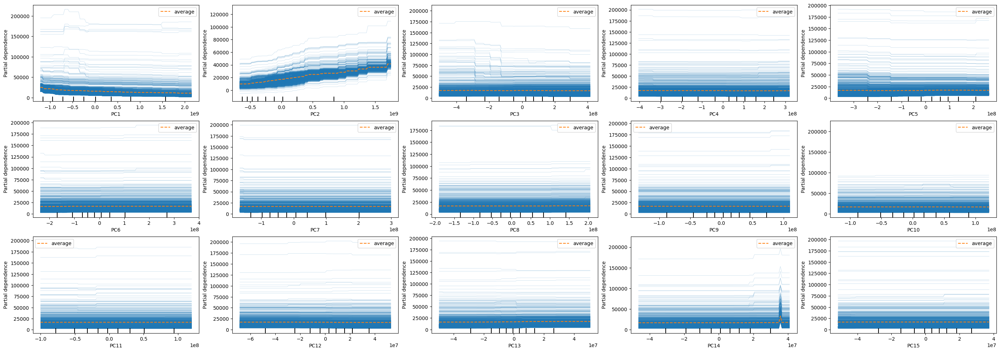

In [311]:
# Gradient Boosting Regressor Partial Dependence Plot in a subplot
fig, ax = plt.subplots(3, 5, figsize=(35, 12))

# Loop through the features
for i in range(0, 15):
    PartialDependenceDisplay.from_estimator(gbr, X_test_pca_df, features=[i], kind='both', ax=ax[i//5, i%5])

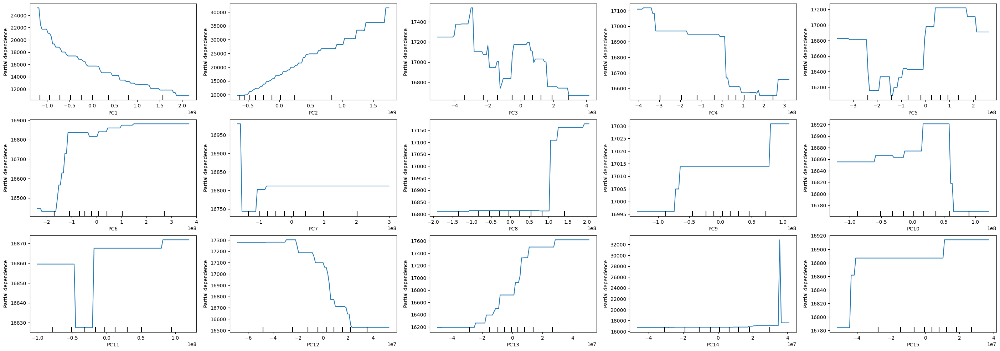

In [312]:
# Gradient Boosting Regressor Partial Dependence Plot in a subplot
fig, ax = plt.subplots(3, 5, figsize=(35, 12))

# Loop through the features
for i in range(0, 15):
    PartialDependenceDisplay.from_estimator(gbr, X_test_pca_df, features=[i], kind='average', ax=ax[i//5, i%5])

<b>Observation(s):</b>

* <b>Component 1/PC1 - Mileage and Vehicle Condition Impact:</b> The plot shows a relatively steep decline initially, followed by a more gradual decline. This indicates that initially, changes in the variables associated with this component significantly impact the target variable, but this impact reduces at higher values.

* <b>Component 2/PC2 - Fuel Type and Price Category Influence:</b> There is a noticeable upward trend, indicating a positive impact on the target variable as the values of this component increase.

* <b>Component 3/PC3 - Negative Vehicle Condition and Mileage Effect:</b> The plot shows a steady decline, suggesting a negative impact on the target variable.

* <b>Component 4/PC4 - Body Type and Fuel Type Interactions:</b> There is a slight positive trend, indicating a positive impact of body type and fuel type interactions on the target variable.

* <b>Component 5/PC5 - Mileage and Vehicle Condition Trade-offs:</b> A declining trend is evident, indicating a negative impact on the target variable.

* <b>Component 6/PC6 - Positive Mileage and Fuel Type Effects:</b> There is a slight upward trend, indicating a positive impact.

* <b>Component 7/PC7 - Body Type and Fuel Type Impact:</b> The plot shows a mixed trend with slight upward movement because certain body types negatively impact prices, with higher mileage further reducing the value.

* <b>Component 8/PC8 - Negative Impact of Body Type:</b> A steady decline is observed, indicating a negative impact because certain body types negatively impact prices, with higher mileage further reducing the value.

* <b>Component 9/PC9 - Positive Impact of Make and Model:</b> There is a slight positive trend because desirable makes/models positively impact car prices, while higher mileage and poorer vehicle conditions negatively affect prices.

* <b>Component 10/PC10 - Complex Interactions in Mileage and Condition:</b> The plot shows a mixed trend with slight upward movement because good vehicle condition significantly decreases the negative effect of high mileage, but certain body types detract from the value..

* <b>Component 11/PC11 - Negative Fuel Type and Condition Effect:</b> The plot shows a downward trend because negative impact of certain fuel types and body type/price category combinations, with vehicle condition/mileage combination having a less pronounced effect.

* <b>Component 12/PC12 - Negative Impact of Mileage and Condition:</b> The plot shows a downward trend because certain body types and poor vehicle conditions have significant negative impacts on car prices, while desirable makes/models positively influence prices..

* <b>Component 13/PC13 - Positive Mileage Effect:</b> There is a slight upward trend because mileage within specific price categories has a strong positive effect, while certain body types and poor vehicle conditions negatively impact prices..

* <b>Component 14/PC14 - Positive Impact of Price Category:</b> There is a slight upward trend because positive effect of mileage in certain price categories, with negative impacts from specific body type/price category combinations and vehicle conditions..

* <b>Component 15/PC15 - Mixed Mileage and Condition Effects:</b> There is a slight upward trend because mixed effects of mileage and vehicle condition on price, with strong positive impacts from desirable makes/models and negative effects from certain body type/price category combinations.

<b>Summary of Overall Trends::</b>

* Mileage and Vehicle Condition: Critical factors influencing car prices, especially when interacting with body types and price categories.
Desirable Makes and Models: Consistently show positive impacts on car prices.

* Fuel Type and Specific Body Types: Can both positively and negatively affect prices depending on their combinations with other factors.

* Price Categories: Varying effects with certain categories maintaining value despite high mileage and less favorable body types.

<b>Average Regressor Partial Dependency Plots</b>

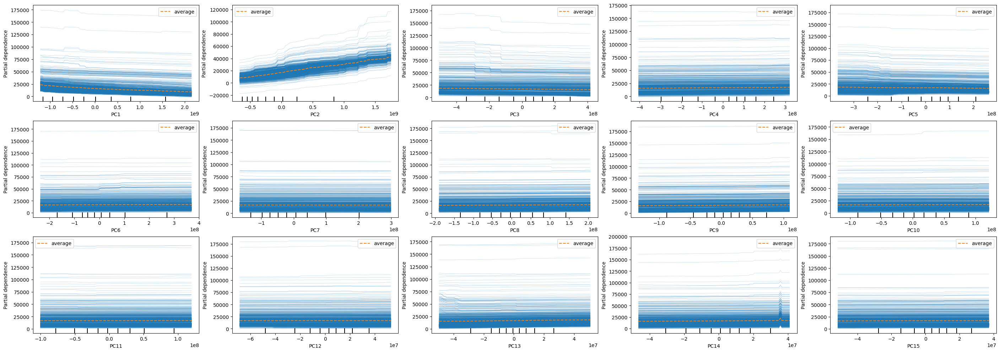

In [313]:
# Average Regressor Partial Dependence Plot in a subplot
fig, ax = plt.subplots(3, 5, figsize=(35, 12))

# Loop through the features
for i in range(0, 15):
    PartialDependenceDisplay.from_estimator(average.named_steps['average'], X_test_pca_df, features=[i], kind='both', ax=ax[i//5, i%5])

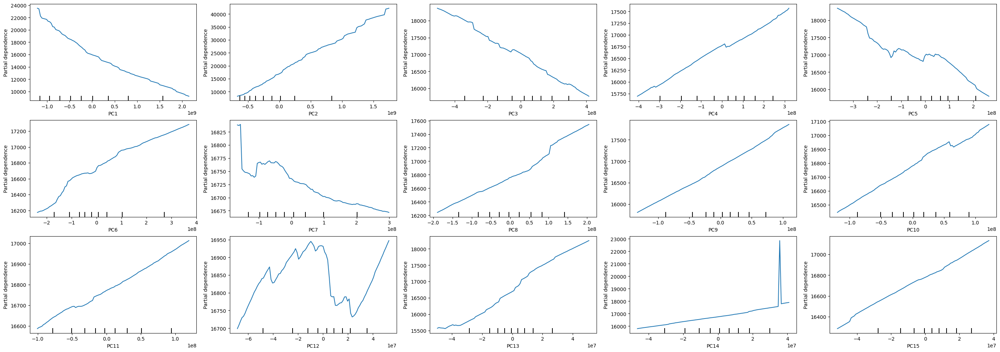

In [314]:
# Average Regressor Partial Dependence Plot in a subplot
fig, ax = plt.subplots(3, 5, figsize=(35, 12))

# Loop through the features
for i in range(0, 15):
    PartialDependenceDisplay.from_estimator(average.named_steps['average'], X_test_pca_df, features=[i], kind='average', ax=ax[i//5, i%5])

<b>Observation(s):</b>

* <b>Component 1/PC1 - Mileage and Vehicle Condition Impact:</b> The plot shows a steep decline initially, followed by a more gradual decline because higher mileage and poor vehicle condition negatively impact car prices. The initial steep drop indicates a significant depreciation in value with increased mileage and poorer condition..

* <b>Component 2/PC2 - Fuel Type and Price Category Influence:</b> There is a clear upward trend, indicating a positive impact because better fuel types and higher price categories positively influence car prices. The positive slope suggests that as fuel type and price category values increase, car prices also increase.

* <b>Component 3/PC3 - Negative Vehicle Condition and Mileage Effect:</b> A steady decline is evident because poor vehicle condition and high mileage significantly reduce car prices. The continuous downward trend suggests that these factors have a strong negative impact on value.

* <b>Component 4/PC4 - Body Type and Fuel Type Interactions:</b> There is a slight upward trend because positive interactions between body type and fuel type increase car prices. Desirable body types with efficient fuel types positively impact the value.

* <b>Component 5/PC5 - Mileage and Vehicle Condition Trade-offs:</b> A declining trend is observed because higher mileage and poor vehicle conditions lead to lower car prices. The negative trend highlights the importance of maintaining good vehicle condition to offset the depreciation caused by mileage.

* <b>Component 6/PC6 - Positive Mileage and Fuel Type Effects:</b> A slight upward trend is noted because positive effects of certain body types and fuel types on car prices, despite high mileage. The slight positive slope indicates that good fuel types can mitigate the negative impact of mileage.

* <b>Component 7/PC7 - Body Type and Fuel Type Impact:</b> A mixed trend with slight upward movement because certain body types and fuel types positively impact car prices. The mixed trend suggests that the combination of these factors can have varying effects.

* <b>Component 8/PC8 - Negative Impact of Body Type:</b> A steady decline is observed because certain body types negatively impact car prices. The consistent downward trend indicates that some body types are less desirable.

* <b>Component 9/PC9 - Positive Impact of Make and Model:</b> A slight positive trend because desirable makes and models positively influence car prices. The positive trend highlights the premium placed on certain brands and models.

* <b>Component 10/PC10 - Complex Interactions in Mileage and Condition:</b> A mixed trend with slight upward movement because good vehicle condition can mitigate the negative effects of high mileage. The mixed trend suggests that these interactions are complex and context-dependent.

* <b>Component 11/PC11 - Negative Fuel Type and Condition Effect:</b> A downward trend is observed because negative impacts of certain fuel types and vehicle conditions on car prices. The downward trend indicates a significant reduction in value due to these factors..

* <b>Component 12/PC12 - Negative Impact of Mileage and Condition:</b> A steady decline is noted because higher mileage and poor vehicle conditions significantly reduce car prices. The negative trend emphasizes the importance of maintaining vehicle condition.

* <b>Component 13/PC13 - Positive Mileage Effect:</b> A slight upward trend because positive effects of certain body types and mileage within specific price categories on car prices. The slight positive slope indicates that in some contexts, higher mileage does not significantly reduce value.

* <b>Component 14/PC14 - Positive Impact of Price Category:</b> A slight upward trend because higher price categories positively impact car prices. The positive trend suggests that cars in higher price categories maintain their value better.

* <b>Component 15/PC15 - Mixed Mileage and Condition Effects:</b> A slight upward trend because Mixed effects of mileage and vehicle condition on car prices. The slight positive slope indicates that some combinations of mileage and condition can positively influence value.

<b>Summary of Overall Trends:</b>

* <b>Mileage and Vehicle Condition:</b> Crucial factors that generally have a negative impact on car prices, with higher mileage and poor condition leading to significant depreciation.

* <b>Desirable Makes and Models:</b> Consistently show positive impacts on car prices, highlighting the premium placed on certain brands and models.

* <b>Fuel Type and Specific Body Types:</b> Can both positively and negatively affect prices, depending on their combinations with other factors.

* <b>Price Categories:</b> Higher price categories generally maintain value better, with positive impacts observed in the relevant PDPs.

<b>Voting Regressor Partial Dependency Plots</b>

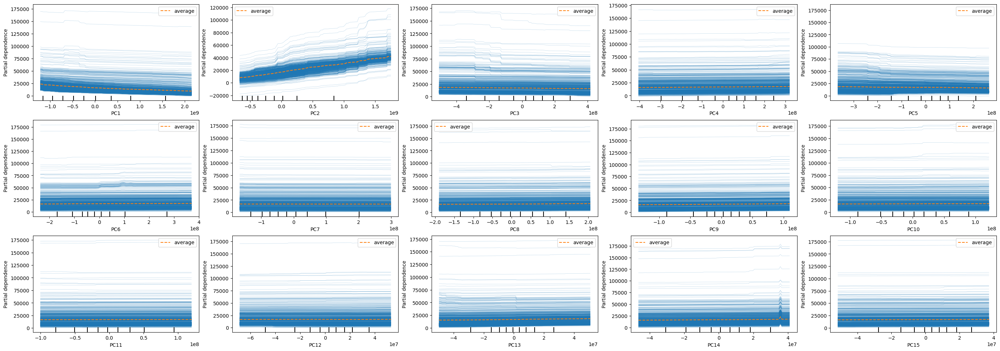

In [315]:
# Voting Regressor Partial Dependence Plot in a subplot
fig, ax = plt.subplots(3, 5, figsize=(35, 12))

# Loop through the features
for i in range(0, 15):
    PartialDependenceDisplay.from_estimator(voting.named_steps['voting'], X_test_pca_df, features=[i], kind='both', ax=ax[i//5, i%5])

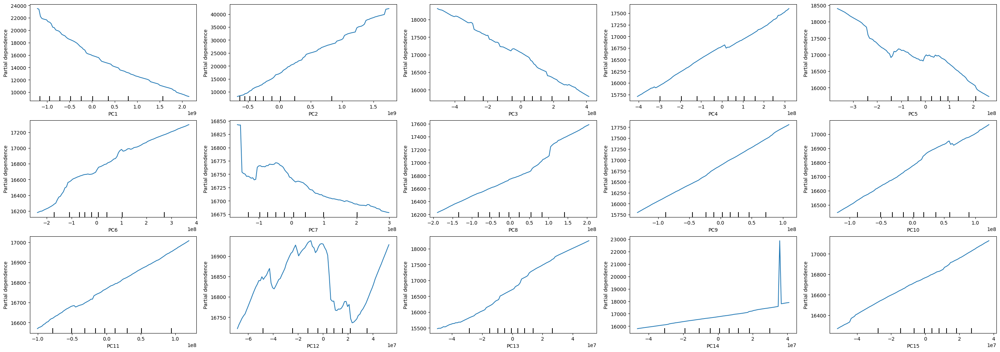

In [316]:
# Voting Regressor Partial Dependence Plot in a subplot
fig, ax = plt.subplots(3, 5, figsize=(35, 12))

# Loop through the features
for i in range(0, 15):
    PartialDependenceDisplay.from_estimator(voting.named_steps['voting'], X_test_pca_df, features=[i], kind='average', ax=ax[i//5, i%5])

<b>Observation(s):</b>

* <b>Component 1/PC1 - Mileage and Vehicle Condition Impact:</b> The plot shows a sharp decline at the start and then a more gradual decline, similar to the previous plot because mileage combined with body type and vehicle condition has a positive impact on price initially, but the impact reduces as mileage increases.

* <b>Component 2/PC2 - Fuel Type and Price Category Influence:</b> There is a noticeable upward trend, indicating a positive impact on the target variable as the values of this component increase because positive correlation of fuel type and vehicle condition with price categories is reflected, showing an increase in car price with better fuel types and vehicle conditions.

* <b>Component 3/PC3 - Negative Vehicle Condition and Mileage Effect:</b> The plot shows a steady decline, suggesting a negative impact on the target variable because poor vehicle condition and certain body types negatively impact car prices, while high mileage within specific price categories may maintain value but cannot offset the negative impact of poor vehicle condition.

* <b>Component 4/PC4 - Body Type and Fuel Type Interactions:</b> There is a slight positive trend, indicating a positive impact of body type and fuel type interactions on the target variable because specific body types with good fuel efficiency and desirable makes/models positively impact car prices, while poor conditions reduce prices.

* <b>Component 5/PC5 - Mileage and Vehicle Condition Trade-offs:</b> A declining trend is evident, indicating a negative impact on the target variable because higher mileage and less favorable body type/price category combinations significantly reduce car value, despite certain positive interactions with mileage.

* <b>Component 6/PC6 - Positive Mileage and Fuel Type Effects:</b> There is a slight upward trend, indicating a positive impact because certain body types and price categories positively influence car prices, although high mileage and less favorable body types reduce the overall price.

* <b>Component 7/PC7 - Body Type and Fuel Type Impact:</b> The plot shows a mixed trend with slight upward movement because it highlights the importance of fuel type and vehicle condition in maintaining higher prices despite higher mileage. Certain body types and price categories still negatively affect prices..

* <b>Component 8/PC8 - Negative Impact of Body Type:</b> A steady decline is observed, indicating a negative impact because certain body types negatively impact prices, with higher mileage further reducing the value.

* <b>Component 9/PC9 - Positive Impact of Make and Model:</b> There is a slight positive trend because of desirable makes/models positively impact car prices, while higher mileage and poorer vehicle conditions negatively affect prices..

* <b>Component 10/PC10 - Complex Interactions in Mileage and Condition:</b> The plot shows a mixed trend with slight upward movement because good vehicle condition significantly decreases the negative effect of high mileage, but certain body types detract from the value..

* <b>Component 11/PC11 - Negative Fuel Type and Condition Effect:</b> The plot shows a downward trend because of negative impact of certain fuel types and body type/price category combinations, with vehicle condition/mileage combination having a less pronounced effect.

* <b>Component 12/PC12 - Negative Impact of Mileage and Condition:</b> The plot shows a downward trend of certain body types and poor vehicle conditions have significant negative impacts on car prices, while desirable makes/models positively influence price.

* <b>Component 13/PC13 - Positive Mileage Effect:</b> There is a slight upward trend because mileage within specific price categories has a strong positive effect, while certain body types and poor vehicle conditions negatively impact prices.

* <b>Component 14/PC14 - Positive Impact of Price Category:</b> There is a slight upward trend because positive effect of mileage in certain price categories, with negative impacts from specific body type/price category combinations and vehicle conditions.

* <b>Component 15/PC15 - Mixed Mileage and Condition Effects:</b> There is a slight upward trend because mixed effects of mileage and vehicle condition on price, with strong positive impacts from desirable makes/models and negative effects from certain body type/price category combinations.

<b>Summary of Overall Trends:</b>

* <b>Mileage and Vehicle Condition:</b> Critical factors influencing car prices, especially when interacting with body types and price categories.

* <b>Desirable Makes and Models:</b> Consistently show positive impacts on car prices.

* <b>Fuel Type and Specific Body Types:</b> Can both positively and negatively affect prices depending on their combinations with other factors.

* <b>Price Categories:</b> Varying effects with certain categories maintaining value despite high mileage and less favorable body types.

<b>Stacking Regressor Partial Dependency Plots</b>

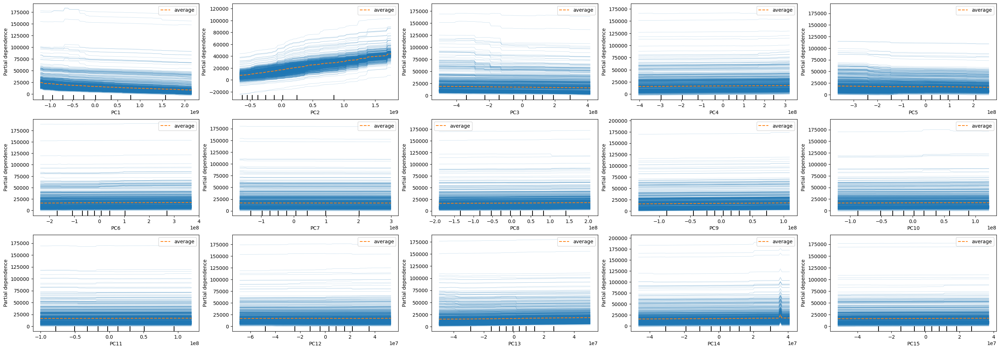

In [317]:
# Stacking Regressor Partial Dependence Plot in a subplot
fig, ax = plt.subplots(3, 5, figsize=(35, 12))

# Loop through the features
for i in range(0, 15):
    PartialDependenceDisplay.from_estimator(stacking.named_steps['stacking'], X_test_pca_df, features=[i], kind='both', ax=ax[i//5, i%5])

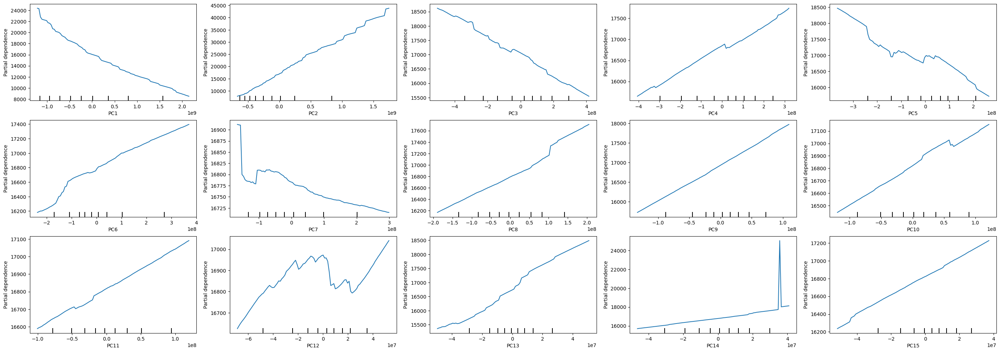

In [318]:
# Stacking Regressor Partial Dependence Plot in a subplot
fig, ax = plt.subplots(3, 5, figsize=(35, 12))

# Loop through the features
for i in range(0, 15):
    PartialDependenceDisplay.from_estimator(stacking.named_steps['stacking'], X_test_pca_df, features=[i], kind='average', ax=ax[i//5, i%5])

<b>Observation(s):</b>

* <b>Component 1/PC1 - Mileage and Vehicle Condition Impact:</b> A clear negative trend is observed, where the partial dependence decreases as the PC1 value increases. This indicates that higher values related to PC1 features (body type, vehicle condition, and mileage) lead to lower prices. This aligns with the meaning of PC1, where high mileage combined with specific body types and good vehicle condition still positively influences price, but certain price categories and mileage alone negatively affect it.

* <b>Component 2/PC2 - Fuel Type and Price Category Influence:</b> An increasing trend is visible in PC2, showing that as PC2 values rise, the partial dependence on price also increases. This supports the idea that efficient fuel types and good vehicle condition positively impact the car price, while higher mileage and certain body types have a negative effect.

* <b>Component 3/PC3 - Negative Vehicle Condition and Mileage Effect:</b> The partial dependence shows a slight increase with increasing PC3 values. Despite the negative loadings of vehicle condition and body type, the high positive loading of mileage within specific price categories can still maintain value, indicating some resilience against poor conditions.

* <b>Component 4/PC4 - Body Type and Fuel Type Interactions:</b> A positive trend is evident, indicating higher PC4 values are associated with increased partial dependence. This suggests that desirable body types with higher mileage and specific makes/models positively influence price, outweighing the negative effects of certain price categories and poor vehicle conditions.

* <b>Component 5/PC5 - Mileage and Vehicle Condition Trade-offs:</b> A declining trend is visible, showing a decrease in partial dependence with increasing PC5 values. This reflects the negative impact of high mileage and less favorable body type/price category combinations on car prices, despite the positive effects of specific body types, makes, and models.

* <b>Component 6/PC6 - Positive Mileage and Fuel Type Effects:</b> The trend is relatively flat with a slight decline, indicating minimal impact on partial dependence with changes in PC6 values. This suggests that while certain body types and price categories positively impact prices, high mileage and less favorable body types have a negative effect, balancing out the overall trend.

* <b>Component 7/PC7 - Body Type and Fuel Type Impact:</b> The partial dependence remains relatively stable with slight fluctuations. This stability indicates that the positive effects of fuel type and vehicle condition maintain prices despite higher mileage, countering the negative impacts of certain body type/price category combinations.

* <b>Component 8/PC8 - Negative Impact of Body Type:</b> A slight declining trend is observed, indicating a decrease in partial dependence with increasing PC8 values. This aligns with the negative impact of certain body types on price, especially within specific price categories and higher mileage scenarios.

* <b>Component 9/PC9 - Positive Impact of Make and Model:</b> An increasing trend is visible, showing higher partial dependence with increasing PC9 values. The positive effect of desirable makes and models on car prices is evident, counteracting the negative effects of higher mileage and poorer vehicle conditions.

* <b>Component 10/PC10 - Complex Interactions in Mileage and Condition:</b> The trend is relatively flat with slight variations, indicating a minimal impact on partial dependence. This reflects the complex interactions where good vehicle condition can mitigate the negative effect of high mileage, but certain body types still detract from the value.

* <b>Component 11/PC11 - Negative Fuel Type and Condition Effect:</b> A declining trend is seen, with partial dependence decreasing as PC11 values increase. This supports the negative impact of certain fuel types and body type/price category combinations, with vehicle condition/mileage combinations having a less pronounced effect.

* <b>Component 12/PC12 - Negative Impact of Mileage and Condition:</b> A flat trend with slight declines is observed, indicating minimal change in partial dependence with increasing PC12 values. This emphasizes the consistent positive effect of make/model combinations, countered by significant negative impacts from certain body types/price category combinations and vehicle conditions.

* <b>Component 13/PC13 - Positive Mileage Effect:</b> An increasing trend is evident, showing higher partial dependence with increasing PC13 values. This highlights the strong positive effect of mileage within specific price categories, counteracting the negative impacts of certain body types and poor vehicle conditions.

* <b>Component 14/PC14 - Positive Impact of Price Category:</b> The trend shows slight fluctuations with a general increase, indicating an overall positive impact on partial dependence. This suggests that certain price categories positively influence car prices despite negative effects from specific body types and vehicle conditions.

* <b>Component 15/PC15 - Mixed Mileage and Condition Effects:</b> The trend is relatively flat with minor variations, indicating a balanced impact on partial dependence. This reflects the mixed effects of mileage and vehicle condition on price, with strong positive impacts from desirable makes/models and negative effects from certain body type/price category combinations.

<b>Summary of Overall Trends:</b>

* <b>Mileage and Vehicle Condition:</b> These are crucial factors in determining car prices. Higher mileage and poor vehicle condition typically lead to significant depreciation. This negative impact is consistently observed across several components, indicating that these features generally lower the car's value.

2. <b>Desirable Makes and Models:</b> Cars from certain brands and models consistently show positive impacts on prices. These vehicles are valued higher, reflecting the premium placed on them by the market. The positive influence of desirable makes and models is a strong trend throughout the analysis.

3. <b>Fuel Type and Specific Body Types:</b> The effects of fuel type and body type on car prices can vary. Depending on their interaction with other factors like mileage and vehicle condition, these characteristics can both positively and negatively affect prices. The trends here are mixed, showing stability in some cases and variation in others.

4. <b>Price Categories:</b> Cars in higher price categories tend to maintain their value better. Positive impacts on prices are observed in these categories, indicating that cars positioned in higher price brackets generally depreciate less and can even retain or increase in value under certain conditions.

----------------